# Feature Engineering

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
PERIODO_PREDICCION = '2019-02'
UMBRAL_RIESGO = 11.5
UMBRAL_ALTO = 15.0

In [3]:
import pandas as pd
from feature_engineering.agg_matricula_X import generar_estadisticas_temporales , generar_estadisticas_x_persona_ciclo 
from feature_engineering.initial_pack import normalizar_dataset, merge_datos_academicos
from feature_engineering.crear_ciclo import crear_features_acumuladas , crear_features_acumuladas_2, crear_features_acumuladas_3 , crear_features_acumuladas_4 , crear_features_acumuladas_3_5
from feature_engineering.new_variables import generate_map_cluster , merge_global , generate_prctj_inasistencia_historico , generate_prctj_inasistencia_ciclo_pasado, generate_inasistencia_shock
from feature_engineering.data_cleaning import eliminar_estudiantes_sin_historial , limpiar_promedios_extremos_finales, delete_notas_bajas , limpiar_promedios_extremos , limpiar_eventos_shock , limpiar_ciclos_baja_carga

# --- Opciones para Filas ---
# Establece el máximo de filas a None para mostrar todas las filas.
# Nota: Si tu tabla tiene miles de filas, esto puede hacer la salida muy larga.
pd.set_option('display.max_rows', None) 

# --- Opciones para Columnas ---
# Establece el máximo de columnas a None para mostrar todas las columnas.
# Útil si tu DF final tiene 50+ columnas.
pd.set_option('display.max_columns', None)

# --- Opciones para Ancho de la Pantalla ---
# Establece el ancho máximo de la pantalla a un valor grande para evitar saltos de línea.
pd.set_option('display.width', 1000)

# --- Opciones para Precisión Decimal (Opcional, para mejor lectura) ---
pd.set_option('display.precision', 4)

print("✅ Opciones de visualización de Pandas configuradas para mostrar todas las filas y columnas.")

✅ Opciones de visualización de Pandas configuradas para mostrar todas las filas y columnas.


In [4]:
# funcion para sacar los valores unicos de todos los objects columns en df_final
def valores_unicos_object_columns(df):
    object_cols = df.select_dtypes(include=['object']).columns
    for col in object_cols:
        uniq_vals = df[col].unique()
        print(f'Valores unicos en {col}: {uniq_vals}')
        print(f'Cantidad de valores unicos en {col}: {len(uniq_vals)}\n')

# funcion para sacar el summary de todas las numeric columns en df_final
def summary_numeric_columns(df):
    numeric_cols = df.select_dtypes(include=['number']).columns
    for col in numeric_cols:
        print(f'Summary de {col}:')
        print(df[col].describe())
        print('\n')

In [5]:
# --- 0. Cargar DataFrame 'Original_backend' ---
df_estudiante = pd.read_csv('datasets/df_estudiante.csv', parse_dates=['FECHA_NACIMIENTO']) # Asegurarse de que la fecha de nacimiento se cargue como datetime
df_curso = pd.read_csv('datasets/df_curso.csv' )
df_matricula = pd.read_csv('datasets/df_matricula.csv')
# solo periodos menor a 2020-02
df_matricula = df_matricula[df_matricula['PER_MATRICULA'] <= PERIODO_PREDICCION ]

# --- 1. Mergear DataFrames del Backend ---
df_train = merge_datos_academicos(df_estudiante, df_curso, df_matricula)

# --- features de asistencia ---
df_train = df_train[~df_train['PER_MATRICULA'].str.endswith('-00')]# ELIMINAR PER_MATRICULAS QUE TERMINEN EN -00
df_train = generate_prctj_inasistencia_historico(df_train) # corregir asistencia para q no exista fuga de datos
df_train = generate_prctj_inasistencia_ciclo_pasado(df_train) # nueva feature
df_train = generate_inasistencia_shock(df_train) # nueva feature

⏳ Iniciando carga de datos...
✅ Archivos cargados exitosamente.
🔗 Realizando Merge 1: Matrícula + Estudiante (por COD_PERSONA)...
🔗 Realizando Merge 2: Resultado anterior + Curso (por COD_CURSO)...

🎉 Consolidación de datos completada.
   DataFrame final tiene 22793 filas y 19 columnas.
Iniciando Imputación por Media de Primeros Ciclos Históricos...
✅ Feature 'PRCTJ_INASISTENCIA_HISTORICO' generado e imputado. Valor residual: 15.80%
Iniciando generación de feature PC Inasistencia (Robusto, con búsqueda retrospectiva)...
✅ Feature 'PRCTJ_INASISTENCIA_CICLO_PASADO' (Robusto) generado. (Se generaron 5440 NaNs para primeros ciclos).
✅ Feature 'DIF_INASISTENCIA_SHOCK' generado exitosamente.
   Se generaron 5440 NaNs (donde no había historial NG o PC).


## Limpieza

In [6]:
# --- 2. Limpieza de datos para data_train ---
df_train = eliminar_estudiantes_sin_historial(df_train)
# df_train = limpiar_promedios_extremos(df_train, limit=0.001)
df_train = limpiar_eventos_shock(df_train, umbral_rendimiento_previo=10, umbral_shock_negativo=-7.5)
df_train = delete_notas_bajas(df_train, limit=0.001)
df_train = limpiar_ciclos_baja_carga(df_train, limit_creditos=14)


# cuantos per_matricula de 2019-02 hay en df_train


--- Proceso de Limpieza: Estudiantes sin Historial ---
Total de registros inicial: 22239
Cantidad de COD_PERSONA únicos inicial: 958

Cantidad de COD_PERSONA con solo una PER_MATRICULA: 264
Cantidad de registros a eliminar (264 personas): 1492

✅ Proceso completado.
Total de registros después de eliminar: 20747
Cantidad de COD_PERSONA únicos finales: 694
--- Proceso de Limpieza: Eliminando 'Eventos de Shock' (Caídas Abruptas) ---
    (Umbral: Historial > 10 y Caída < -7.5 pts)

Resultados de la limpieza:
 - Ciclos completos (Persona-Periodo) eliminados por 'Shock': 43
 - Registros (filas) eliminados: 131
Total de registros inicial: 20747
Total de registros final: 20616
--- Proceso de Limpieza: NOTAS BAJAS ---
🧹 Registros con NOTA < 0.001 eliminados: 178
Total de registros final: 20438
--- Proceso de Limpieza: Ciclos con Carga < 14 créditos ---

Resultados de la limpieza:
 - Ciclos completos (Persona-Periodo) eliminados: 836
 - Registros (filas) eliminados: 2370
Total de registros inici

## normalizar

In [7]:
df_estudiante_train, df_curso_train, df_matricula_train = normalizar_dataset(df_train) # Obtener los DataFrames normalizados después de la limpieza


✅ Normalización completada.
   Tabla ESTUDIANTE: 677 filas únicas.
   Tabla CURSO:      68 filas únicas.
   Tabla MATRÍCULA:  18068 filas (registros).


In [8]:
# --- 3. Generar features de Estudiante ---
df_inei = pd.read_csv('datasets/inei_pobreza_reducido.csv') # Cargar datos extraidos de la web del INEI
df_estudiante_train['FECHA_NACIMIENTO'] = pd.to_datetime(df_estudiante_train['FECHA_NACIMIENTO'], errors='coerce')


## generar cluster

In [9]:
# --- 4. Generar features de Curso ---
cluster_map = generate_map_cluster(df_train)
# los cluster deben ser string
df_curso_train['CLUSTER_DIFICULTAD'] = df_curso_train['CURSO'].map(cluster_map).astype(str)
df_train['CLUSTER_DIFICULTAD'] = df_train['CURSO'].map(cluster_map).astype(str)

🧩 Iniciando el proceso de Clustering para la Dificultad del Curso...
1. Calculando métricas de rendimiento por curso...
2. Normalizando las características...
3. Evaluando el número óptimo de clústeres (k)...
🔍 Mejor número de clústeres según Silhouette Score: k = 30
🔍 EL numero k usado es = 8

✅ Proceso de Clustering completado. Resumen final por clúster:
                    PROM_NOTA  PRCTJ_APROB  CREDITOS  NIVEL_CURSO
CLUSTER_DIFICULTAD                                               
5                        9.66        43.15      4.00         1.67
7                       11.54        61.24      4.00         3.18
0                       12.32        71.81      2.62         2.25
1                       12.40        75.78      2.89         8.44
4                       12.76        80.51      4.00         6.23
2                       14.20        88.79      2.20         4.00
3                       14.41        94.10      4.00         8.17
6                       15.05        96.83     

## generar fearures acumulados

In [10]:
# --- 5. Generar features de Ciclo ---
df_ciclo = crear_features_acumuladas_3(df_train)

Iniciando procesamiento de features (Acumuladas + Carga Actual)...
Generando dummies para carga de Familia y Cluster...
Agregando a nivel semestre...
Aplicando shift para obtener datos del ciclo anterior (NG/PC)...
Calculando feature de diferencia de carga (Shock de Créditos)...
Calculando feature de 'shock' (PC vs NG)...
✅ Procesamiento completado. DataFrame final con 3178 filas y 27 columnas.


In [11]:
# --- 5. Generar features de Desempeño por curso, familia y cluster ---
df_desempeño_curso = generar_estadisticas_temporales(df_train, 'COD_CURSO')
df_desempeño_familia = generar_estadisticas_temporales(df_train, 'FAMILIA')
df_desempeño_cluster_dificultad = generar_estadisticas_temporales(df_train, 'CLUSTER_DIFICULTAD')

# Imputación de NaNs en estadísticas NG y PC
# df_desempeño_curso = imputacion_temporal_global(df_desempeño_curso, 'COD_CURSO')
# df_desempeño_familia = imputacion_temporal_global(df_desempeño_familia, 'FAMILIA')
# df_desempeño_cluster_dificultad = imputacion_temporal_global(df_desempeño_cluster_dificultad, 'CLUSTER_DIFICULTAD')



🧩 Iniciando generación de estadísticas por 'COD_CURSO'...
Calculando estadísticas globales (NG)...
Calculando estadísticas del ciclo pasado (PC) con búsqueda retrospectiva...
Combinando resultados finales...
✅ Proceso completado. DataFrame final con 1070 filas y 20 columnas.
🧩 Iniciando generación de estadísticas por 'FAMILIA'...
Calculando estadísticas globales (NG)...
Calculando estadísticas del ciclo pasado (PC) con búsqueda retrospectiva...
Combinando resultados finales...
✅ Proceso completado. DataFrame final con 88 filas y 20 columnas.
🧩 Iniciando generación de estadísticas por 'CLUSTER_DIFICULTAD'...
Calculando estadísticas globales (NG)...
Calculando estadísticas del ciclo pasado (PC) con búsqueda retrospectiva...
Combinando resultados finales...
✅ Proceso completado. DataFrame final con 141 filas y 20 columnas.


In [12]:
# --- 6. Generar features de Desempeño personal por curso, familia y cluster ---
# df_desempeño_personal_curso = generar_estadisticas_x_persona_ciclo(df_train, 'COD_CURSO')
df_desempeño_personal_familia = generar_estadisticas_x_persona_ciclo(df_train, 'FAMILIA')
df_desempeño_personal_cluster_dificultad = generar_estadisticas_x_persona_ciclo(df_train, 'CLUSTER_DIFICULTAD')

# df_desempeño_personal_curso = imputacion_ng_temporal(df_desempeño_personal_curso, 'COD_CURSO')
# df_desempeño_personal_familia = imputacion_ng_temporal(df_desempeño_personal_familia, 'FAMILIA')
# df_desempeño_personal_cluster_dificultad = imputacion_ng_temporal(df_desempeño_personal_cluster_dificultad, 'CLUSTER_DIFICULTAD')


✅ Proceso completado. DataFrame final con 8989 filas y 12 columnas.
✅ Proceso completado. DataFrame final con 10934 filas y 12 columnas.


In [13]:
print("--- TABLA ESTUDIANTE ---")
print(df_estudiante_train.info())
print("--- TABLA CURSO ---")
print(df_curso_train.info())
print("--- TABLA MATRÍCULA ---")
print(df_matricula_train.info())
print("--- TABLA CICLO ---")
print(df_ciclo.info())
print("--- TABLA ESTADÍSTICAS CURSOS ---")
print(df_desempeño_curso.info())
print("--- TABLA ESTADÍSTICAS FAMILIA ---")
print(df_desempeño_familia.info())
print("--- TABLA ESTADÍSTICAS CLUSTER DIFICULTAD ---")
print(df_desempeño_cluster_dificultad.info())
# print("--- TABLA ESTADÍSTICAS PERSONALES CURSO ---")
# print(df_desempeño_personal_curso.info())
print("--- TABLA ESTADÍSTICAS PERSONALES FAMILIA ---")
print(df_desempeño_personal_familia.info())
print("--- TABLA ESTADÍSTICAS PERSONALES CLUSTER DIFICULTAD ---")
print(df_desempeño_personal_cluster_dificultad.info())

--- TABLA ESTUDIANTE ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 677 entries, 0 to 676
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   COD_PERSONA       677 non-null    int64         
 1   SEXO              677 non-null    object        
 2   PER_INGRESO       677 non-null    object        
 3   ESTADO_CIVIL      677 non-null    object        
 4   TIPO_COLEGIO      677 non-null    object        
 5   PTJE_INGRESO      677 non-null    float64       
 6   FECHA_NACIMIENTO  677 non-null    datetime64[ns]
 7   BECA_VIGENTE      677 non-null    int64         
 8   CONTRASENIA       677 non-null    object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 47.7+ KB
None
--- TABLA CURSO ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------         

## merge

In [14]:
# --- 1. Merge base: matricula + estudiante + curso ---
df_train = df_matricula_train.merge(df_estudiante_train, on='COD_PERSONA', how='left')
print("dimensiones:", df_train.shape)
df_train = df_train.merge(df_curso_train, on='COD_CURSO', how='left')
print("dimensiones:", df_train.shape)

# --- 2. Merge con desempeño general (no personal) ---
df_train = df_train.merge(
    df_desempeño_curso,
    on=['PER_MATRICULA', 'COD_CURSO'],
    how='left'
)
print("dimensiones:", df_train.shape)

df_train = df_train.merge(
    df_desempeño_familia,
    on=['PER_MATRICULA', 'FAMILIA'],
    how='left'
)
print("dimensiones:", df_train.shape)

df_train = df_train.merge(
    df_desempeño_cluster_dificultad,
    on=['PER_MATRICULA', 'CLUSTER_DIFICULTAD'],
    how='left'
)
print("dimensiones:", df_train.shape)
# --- 3. Merge con desempeño personal ---
df_train = df_train.merge(
    df_desempeño_personal_familia,
    on=['PER_MATRICULA', 'COD_PERSONA', 'FAMILIA'],
    how='left'
)
print("dimensiones:", df_train.shape)

df_train = df_train.merge(
    df_desempeño_personal_cluster_dificultad,
    on=['PER_MATRICULA', 'COD_PERSONA', 'CLUSTER_DIFICULTAD'],
    how='left'
)
print("dimensiones:", df_train.shape)

# --- 4. Merge con características de ciclo ---
df_train = df_train.merge(
    df_ciclo,
    on=['COD_PERSONA', 'PER_MATRICULA'],
    how='left'
)
print("dimensiones:", df_train.shape)

dimensiones: (18068, 15)
dimensiones: (18068, 22)
dimensiones: (18068, 40)
dimensiones: (18068, 58)
dimensiones: (18068, 76)
dimensiones: (18068, 85)
dimensiones: (18068, 94)
dimensiones: (18068, 119)


In [15]:
print("--- TABLA DE ENTRENAMIENTO ---")
print(df_train.info())



--- TABLA DE ENTRENAMIENTO ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18068 entries, 0 to 18067
Columns: 119 entries, COD_PERSONA to N_CLUSTER_7
dtypes: category(1), datetime64[ns](1), float64(85), int64(21), object(11)
memory usage: 16.3+ MB
None


## eliminar nulos

In [16]:
# de df_train eliminar per_matricula de 2011
df_train = df_train[df_train['PER_MATRICULA'] > '2011-02']

In [17]:
# tabla de registros con nulos
registros_con_nulos = df_train[df_train.isnull().any(axis=1)]
print(f"Cantidad de registros con nulos en df_train: {len(registros_con_nulos)}")
print("Registros con nulos:")
print(registros_con_nulos)


Cantidad de registros con nulos en df_train: 4768
Registros con nulos:
       COD_PERSONA COD_CURSO PER_MATRICULA   NOTA  PRCTJ_INASISTENCIA_HISTORICO  PRCTJ_INASISTENCIA_CICLO_PASADO  DIF_INASISTENCIA_SHOCK SEXO PER_INGRESO ESTADO_CIVIL                     TIPO_COLEGIO  PTJE_INGRESO FECHA_NACIMIENTO  BECA_VIGENTE CONTRASENIA                                           CURSO  CREDITOS TIPO_CURSO  HRS_CURSO FAMILIA  NIVEL_CURSO CLUSTER_DIFICULTAD  AVG_COD_CURSO_NG  QUARTIL_25_COD_CURSO_NG  QUARTIL_50_COD_CURSO_NG  QUARTIL_75_COD_CURSO_NG  PRCTJE_S_COD_CURSO_NG  MAX_COD_CURSO_NG  MIN_COD_CURSO_NG  DIF_Q75_Q25_COD_CURSO_NG  DIF_MAX_MIN_COD_CURSO_NG  AVG_COD_CURSO_PC  QUARTIL_25_COD_CURSO_PC  QUARTIL_50_COD_CURSO_PC  QUARTIL_75_COD_CURSO_PC  PRCTJE_S_COD_CURSO_PC  MAX_COD_CURSO_PC  MIN_COD_CURSO_PC  DIF_Q75_Q25_COD_CURSO_PC  DIF_MAX_MIN_COD_CURSO_PC  AVG_FAMILIA_NG  QUARTIL_25_FAMILIA_NG  QUARTIL_50_FAMILIA_NG  QUARTIL_75_FAMILIA_NG  PRCTJE_S_FAMILIA_NG  MAX_FAMILIA_NG  MIN_FAMILIA_NG  DIF_Q

In [18]:
valores_unicos_object_columns(df_train)
summary_numeric_columns(df_train)


Valores unicos en COD_CURSO: ['CS112' 'FG301' 'CS100' 'CS351' 'CS212' 'CS291' 'FG221' 'FG106' 'CS272'
 'CS391' 'CS312' 'CS341' 'CS3P1' 'CS402' 'MA201' 'ET201' 'CS331' 'CS342'
 'FG210' 'CS1D1' 'CS113' 'MA101' 'CS231' 'CS210' 'CS1D2' 'MA203' 'CS403'
 'CS370' 'FG205' 'ET301' 'MA307' 'MA306' 'FG204' 'CS381' 'FG350' 'CS261'
 'CS404' 'CS362' 'FG211' 'CS3P2' 'FG220' 'CS211' 'CS221' 'MA102' 'CB111'
 'CS292' 'ET101' 'CS251' 'CS281' 'CS2H1' 'CS201' 'CS1D3' 'FG107' 'FG111'
 'FG104' 'FG203' 'CS271' 'CB309' 'FG201' 'FG102' 'FG202' 'MA100' 'FG101'
 'CS361' 'CS111' 'FG105' 'FG103' 'CS311']
Cantidad de valores unicos en COD_CURSO: 68

Valores unicos en PER_MATRICULA: ['2013-01' '2014-02' '2015-02' '2019-01' '2019-02' '2012-02' '2012-01'
 '2013-02' '2014-01' '2015-01' '2016-01' '2016-02' '2017-02' '2017-01'
 '2018-02' '2018-01']
Cantidad de valores unicos en PER_MATRICULA: 16

Valores unicos en SEXO: ['M' 'F']
Cantidad de valores unicos en SEXO: 2

Valores unicos en PER_INGRESO: ['2012-02' '2014-02' '2

In [19]:
# registros con N_FAMILIA_CS ==7 
# registros_n_familia_cs_7 = df_train[df_train['N_FAMILIA_CS'] == 7]
# print(f"Cantidad de registros con N_FAMILIA_CS == 7: {len(registros_n_familia_cs_7)}")
# print("Registros con N_FAMILIA_CS == 7:")
# print(registros_n_familia_cs_7) 

📊 Resumen de Datos Faltantes (Total de filas: 17200)
                                     Conteo Nulos  Porcentaje Nulos
AVG_CLUSTER_DIFICULTAD_NG_P                  4548             26.44
DIF_MAX_MIN_CLUSTER_DIFICULTAD_NG_P          4548             26.44
DIF_Q75_Q25_CLUSTER_DIFICULTAD_NG_P          4548             26.44
MIN_CLUSTER_DIFICULTAD_NG_P                  4548             26.44
MAX_CLUSTER_DIFICULTAD_NG_P                  4548             26.44
PRCTJE_S_CLUSTER_DIFICULTAD_NG_P             4548             26.44
QUARTIL_75_CLUSTER_DIFICULTAD_NG_P           4548             26.44
QUARTIL_50_CLUSTER_DIFICULTAD_NG_P           4548             26.44
QUARTIL_25_CLUSTER_DIFICULTAD_NG_P           4548             26.44
MAX_FAMILIA_NG_P                             3757             21.84
QUARTIL_25_FAMILIA_NG_P                      3757             21.84
QUARTIL_50_FAMILIA_NG_P                      3757             21.84
QUARTIL_75_FAMILIA_NG_P                      3757             2

/var/folders/rn/ysxq396j7lbg3qnwvfpvfsfm0000gn/T/ipykernel_10237/4271262601.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_nulos.index, y='Conteo Nulos', data=df_nulos, palette='viridis')


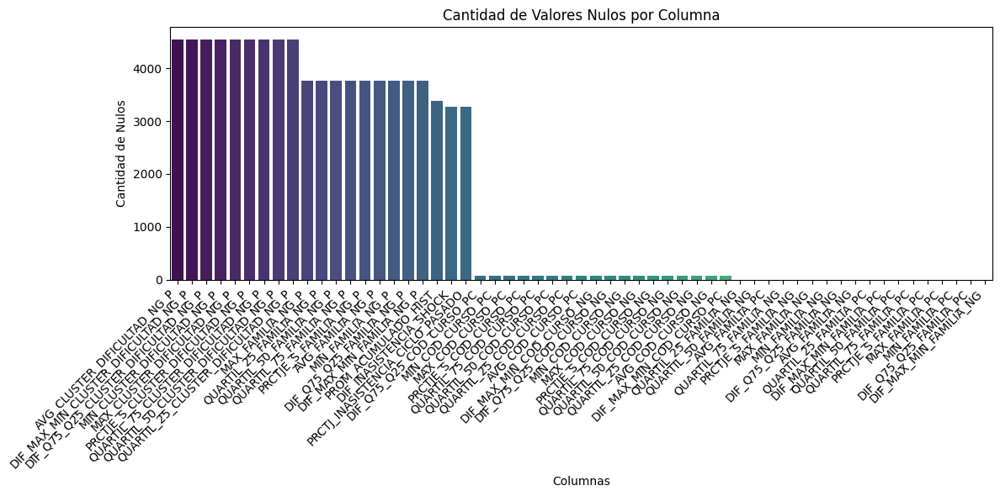

In [20]:
# cantidad de nulos por columna y fila de df_train
import pandas as pd

def obtener_datos_faltantes(df):
    """
    Calcula la cantidad y el porcentaje de valores faltantes (NaN) por columna 
    en un DataFrame de Pandas.

    Args:
        df (pd.DataFrame): DataFrame de entrada.

    Returns:
        pd.DataFrame: Tabla resumen con el Conteo y Porcentaje de Nulos.
    """
    
    # 1. Conteo de valores nulos por columna
    nulos_conteo = df.isnull().sum()
    
    # 2. Porcentaje de valores nulos
    nulos_porcentaje = (nulos_conteo / len(df)) * 100
    
    # 3. Crear el DataFrame resumen
    df_nulos = pd.DataFrame({
        'Conteo Nulos': nulos_conteo,
        'Porcentaje Nulos': nulos_porcentaje.round(2)
    })
    
    # 4. Filtrar y ordenar: Mostrar solo las columnas que tienen al menos un valor nulo
    df_nulos = df_nulos[df_nulos['Conteo Nulos'] > 0]
    df_nulos = df_nulos.sort_values(by='Conteo Nulos', ascending=False)
    
    print(f"📊 Resumen de Datos Faltantes (Total de filas: {len(df)})")
    
    return df_nulos

#--- Ejemplo de Uso (Suponiendo que ya tienes df_train) ---
nulos_reporte = obtener_datos_faltantes(df_train)
print(nulos_reporte)


# barplot de los nulos por columna en df_train
import matplotlib.pyplot as plt
import seaborn as sns
def plot_nulos_barplot(df_nulos):
    """
    Genera un barplot que muestra la cantidad de valores nulos por columna.

    Args:
        df_nulos (pd.DataFrame): DataFrame con el resumen de nulos, 
                                 debe contener una columna 'Conteo Nulos'.
    """
    plt.figure(figsize=(12, 6))
    sns.barplot(x=df_nulos.index, y='Conteo Nulos', data=df_nulos, palette='viridis')
    plt.xticks(rotation=45, ha='right')
    plt.title('Cantidad de Valores Nulos por Columna')
    plt.xlabel('Columnas')
    plt.ylabel('Cantidad de Nulos')
    plt.tight_layout()
    plt.show()
#--- Ejemplo de Uso (Suponiendo que ya tienes nulos_reporte) ---
plot_nulos_barplot(nulos_reporte)

In [21]:
nulos_reporte

,Conteo Nulos,Porcentaje Nulos
AVG_CLUSTER_DIFICULTAD_NG_P,4548,26.44
DIF_MAX_MIN_CLUSTER_DIFICULTAD_NG_P,4548,26.44
DIF_Q75_Q25_CLUSTER_DIFICULTAD_NG_P,4548,26.44
MIN_CLUSTER_DIFICULTAD_NG_P,4548,26.44
MAX_CLUSTER_DIFICULTAD_NG_P,4548,26.44
PRCTJE_S_CLUSTER_DIFICULTAD_NG_P,4548,26.44
QUARTIL_75_CLUSTER_DIFICULTAD_NG_P,4548,26.44
QUARTIL_50_CLUSTER_DIFICULTAD_NG_P,4548,26.44
QUARTIL_25_CLUSTER_DIFICULTAD_NG_P,4548,26.44
MAX_FAMILIA_NG_P,3757,21.84


In [22]:
def analizar_nulos_por_periodo(df_all):
    """
    Calcula la cantidad total de valores nulos por registro (fila) en las 
    features de desempeño temporal y agrupa este conteo por PER_MATRICULA.
    
    Args:
        df (pd.DataFrame): DataFrame de entrada que contiene las features temporales.
        
    Returns:
        pd.DataFrame: Conteo de nulos por PER_MATRICULA.
    """
    df = df_all.copy()
    # 1. Identificar las columnas de features temporales (NG_P, PC_P, etc.)
    # Buscamos columnas que terminen en _NG, _PC, _NG_P, o _PC_P

    temp_cols = [col for col in df.columns if any(suf in col for suf in ['_NG', '_PC'])]
    
    if not temp_cols:
        print("Advertencia: No se encontraron columnas de features temporales para analizar.")
        return pd.DataFrame()

    # 2. Contar el número total de NaNs por fila (registro)
    df['TOTAL_NAN_ROW'] = df[temp_cols].isnull().sum(axis=1)

    # 3. Agrupar por PER_MATRICULA y sumar los NaNs totales
    # (El número de nulos por periodo se correlaciona con la cantidad de alumnos nuevos/primeros ciclos)
    nulos_por_periodo = (
        df.groupby('PER_MATRICULA')
        .agg(
            Registros_Totales=('NOTA', 'count'),
            Total_NAN_Features=('TOTAL_NAN_ROW', 'sum')
        )
        .reset_index()
    )
    
    # 4. Calcular el promedio de features nulas por registro en ese periodo
    nulos_por_periodo['Promedio_NAN_x_Registro'] = (
        nulos_por_periodo['Total_NAN_Features'] / nulos_por_periodo['Registros_Totales']
    ).round(2)
    
    # 5. Ordenar para ver los periodos con más problemas
    nulos_por_periodo = nulos_por_periodo.sort_values(
        'PER_MATRICULA', ascending=True
    ).reset_index(drop=True)
    
    print("\n📊 Nulos Promedio por Periodo de Matrícula (PER_MATRICULA)")
    
    return nulos_por_periodo

# --- Ejemplo de uso (Suponiendo que ya tienes df_train) ---
reporte_periodo_nulos = analizar_nulos_por_periodo(df_train)
print(reporte_periodo_nulos)


📊 Nulos Promedio por Periodo de Matrícula (PER_MATRICULA)
   PER_MATRICULA  Registros_Totales  Total_NAN_Features  Promedio_NAN_x_Registro
0        2012-01                713                6444                     9.04
1        2012-02                625                1602                     2.56
2        2013-01                843                7551                     8.96
3        2013-02                814                2556                     3.14
4        2014-01               1081                8433                     7.80
5        2014-02                921                2610                     2.83
6        2015-01               1000                5274                     5.27
7        2015-02                998                2862                     2.87
8        2016-01               1091                7200                     6.60
9        2016-02               1107                3006                     2.72
10       2017-01               1372               

In [23]:
# eliminar filas con nulos 
df_train = df_train.dropna()

In [24]:
valores_unicos_object_columns(df_train)
summary_numeric_columns(df_train)

Valores unicos en COD_CURSO: ['CS291' 'FG221' 'FG301' 'CS212' 'CS312' 'CS272' 'CS3P1' 'CS391' 'CS331'
 'CS342' 'CS210' 'MA101' 'CS1D2' 'CS403' 'MA307' 'MA306' 'ET301' 'FG204'
 'FG210' 'FG211' 'FG220' 'CS113' 'CS211' 'CS221' 'MA102' 'MA201' 'CB111'
 'CS351' 'CS292' 'CS251' 'ET101' 'CS281' 'CS2H1' 'ET201' 'CS201' 'CS381'
 'CS402' 'CS370' 'CS231' 'CS3P2' 'CS362' 'FG107' 'MA203' 'CS1D3' 'FG106'
 'FG111' 'CB309' 'FG350' 'FG104' 'CS271' 'FG203' 'CS341' 'CS261' 'CS404'
 'FG201' 'CS100' 'MA100' 'FG101' 'FG205' 'CS361' 'FG202' 'FG105' 'CS1D1'
 'FG103' 'FG102' 'CS112' 'CS111' 'CS311']
Cantidad de valores unicos en COD_CURSO: 68

Valores unicos en PER_MATRICULA: ['2014-02' '2015-02' '2019-02' '2013-01' '2012-02' '2013-02' '2014-01'
 '2012-01' '2015-01' '2016-01' '2016-02' '2017-02' '2017-01' '2018-02'
 '2019-01' '2018-01']
Cantidad de valores unicos en PER_MATRICULA: 16

Valores unicos en SEXO: ['M' 'F']
Cantidad de valores unicos en SEXO: 2

Valores unicos en PER_INGRESO: ['2012-02' '2014-02' '2

## distribuciones

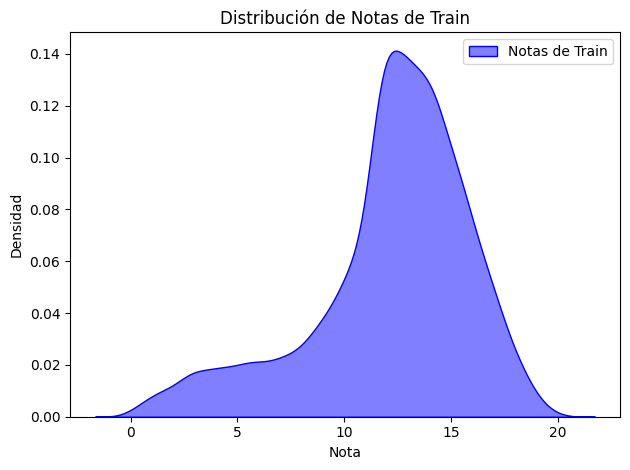

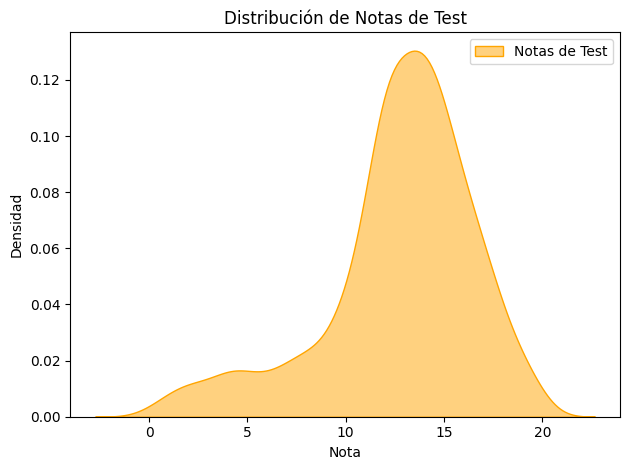

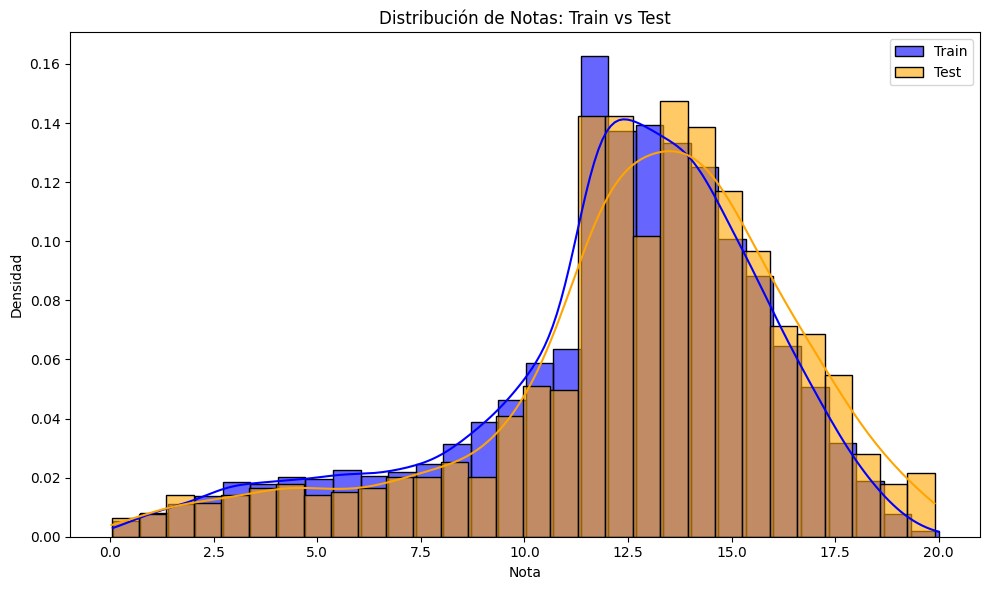

In [25]:
# X es todo df_train - el periodo 2020-02
df = df_train.copy()
train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION]
# distribucion de notas de train
sns.kdeplot(train['NOTA'], label='Notas de Train', color='blue', fill=True, alpha=0.5)
plt.title('Distribución de Notas de Train')
plt.xlabel('Nota')
plt.ylabel('Densidad')
plt.legend()
plt.tight_layout()
plt.show()

test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION]
# distribucion de notas de test
sns.kdeplot(test['NOTA'], label='Notas de Test', color='orange', fill=True, alpha=0.5)
plt.title('Distribución de Notas de Test')
plt.xlabel('Nota')
plt.ylabel('Densidad')
plt.legend()
plt.tight_layout()
plt.show()

# bartplot de la distribucion de notas de train y test
plt.figure(figsize=(10, 6))
sns.histplot(train['NOTA'], color='blue', label='Train', kde=True, stat="density", bins=30, alpha=0.6)
sns.histplot(test['NOTA'], color='orange', label='Test', kde=True, stat="density", bins=30, alpha=0.6)
plt.title('Distribución de Notas: Train vs Test')
plt.xlabel('Nota')
plt.ylabel('Densidad')
plt.legend()
plt.tight_layout()
plt.show()

# xtest es X sin NOTA
Y_train = train['NOTA']
X_train = train.drop(columns=['NOTA'])
# ahora test sin NOTA
X_test = test.drop(columns=['NOTA'])
Y_test = test['NOTA']



In [26]:
# summary de notas
print("Summary de Notas de Train:")
print(Y_train.describe())
print("\nSummary de Notas de Test:")
print(Y_test.describe())

Summary de Notas de Train:
count    11245.0000
mean        12.1461
std          3.7153
min          0.0600
25%         10.6600
50%         12.7400
75%         14.6000
max         20.0000
Name: NOTA, dtype: float64

Summary de Notas de Test:
count    1187.0000
mean       12.7071
std         3.8155
min         0.0300
25%        11.5100
50%        13.3000
75%        15.1500
max        19.9000
Name: NOTA, dtype: float64


In [27]:
# summary de ponderados de train y test
print("Summary de PROM_ACUMULADO_HIST de Train:")
print(X_train['PROM_ACUMULADO_HIST'].describe())
print("\nSummary de PROM_ACUMULADO_HIST de Test:")
print(X_test['PROM_ACUMULADO_HIST'].describe())

Summary de PROM_ACUMULADO_HIST de Train:
count    11245.0000
mean        12.5242
std          2.3468
min          3.2617
25%         11.1264
50%         12.6676
75%         13.9862
max         18.7498
Name: PROM_ACUMULADO_HIST, dtype: float64

Summary de PROM_ACUMULADO_HIST de Test:
count    1187.0000
mean       12.4675
std         2.5238
min         5.8455
25%        10.7127
50%        12.5292
75%        14.1008
max        18.3944
Name: PROM_ACUMULADO_HIST, dtype: float64


In [28]:
summary_numeric_columns(X_train)

Summary de COD_PERSONA:
count    11245.0000
mean     22334.8335
std       7428.5663
min         57.0000
25%      16712.0000
50%      22369.0000
75%      28704.0000
max      37605.0000
Name: COD_PERSONA, dtype: float64


Summary de PRCTJ_INASISTENCIA_HISTORICO:
count    11245.0000
mean        11.0129
std          8.0513
min          0.0000
25%          4.4643
50%          9.4643
75%         15.7242
max         61.6667
Name: PRCTJ_INASISTENCIA_HISTORICO, dtype: float64


Summary de PRCTJ_INASISTENCIA_CICLO_PASADO:
count    11245.0000
mean        12.6406
std          9.9048
min          0.0000
25%          4.7619
50%         10.5769
75%         18.5268
max         73.9583
Name: PRCTJ_INASISTENCIA_CICLO_PASADO, dtype: float64


Summary de DIF_INASISTENCIA_SHOCK:
count    11245.0000
mean         1.6277
std          4.8363
min        -24.8893
25%         -0.7639
50%          0.6250
75%          3.6695
max         46.9061
Name: DIF_INASISTENCIA_SHOCK, dtype: float64


Summary de PTJE_INGRESO:

# Categorizacion de características

In [29]:
# Categorizacion de características
real_features_list = [col for col in X_train.columns if col not in ['PER_MATRICULA', 'COD_PERSONA']]


# Métodos de Selección de Características

In [30]:
X_train.shape

(11245, 118)

## 1. Filtro (Filter Methods)

### Varianza (Variance Threshold)

In [31]:
import pandas as pd
from sklearn.feature_selection import VarianceThreshold
import numpy as np

def aplicar_variance_threshold(df_train, umbral=0.01):
    """
    Calcula la varianza de todas las features numéricas y aplica un umbral 
    para identificar cuáles features son casi constantes.
    
    Args:
        df_train (pd.DataFrame): DataFrame de entrenamiento con features numéricas.
        umbral (float): Varianza mínima requerida para mantener una feature.
        
    Returns:
        pd.DataFrame: Reporte de varianzas y lista de features a eliminar.
    """
    print(f"🔎 Iniciando análisis de Varianza con Umbral T={umbral}...")
    
    # 1. Limpieza de IDs y Metadatos (para asegurar solo features numéricas relevantes)
    cols_to_remove = [
        'COD_PERSONA', 'FECHA_NACIMIENTO', 'NOTA', 'PER_MATRICULA', 
    ]
    
    X_num = df_train.select_dtypes(include=np.number).drop(
        columns=[c for c in cols_to_remove if c in df_train.columns], errors='ignore'
    ).copy()
    
    # 2. Manejo de NaNs: Imputar con la mediana antes de calcular la varianza.
    # La varianza no se puede calcular en NaNs.
    X_num = X_num.fillna(X_num.median())

    # 3. Calcular la Varianza de cada Feature
    varianzas = X_num.var().sort_values(ascending=True)
    
    # 4. Aplicar el Umbral
    features_a_eliminar = varianzas[varianzas < umbral].index.tolist()
    
    # 5. Generar Reporte
    df_varianza = pd.DataFrame({
        'Feature': varianzas.index,
        'Varianza': varianzas.values
    })
    
    print(f"\n📊 Reporte de Varianza (Umbral T={umbral}):")
    print("---------------------------------------")
    print(df_varianza[df_varianza['Varianza'] < 1.0].to_string(index=False))
    
    print(f"\n⚠️ Features a Eliminar (Varianza < {umbral}): {len(features_a_eliminar)}")
    
    if features_a_eliminar:
        print("   " + "\n   ".join(features_a_eliminar))
    else:
        print("   Ninguna feature eliminada con este umbral.")

    # 6. Retornar el reporte completo para una revisión detallada
    return df_varianza

# --- Ejecución (Necesitas df_train con todas tus features) ---
df_varianza_report = aplicar_variance_threshold(df, umbral=0.01)

🔎 Iniciando análisis de Varianza con Umbral T=0.01...

📊 Reporte de Varianza (Umbral T=0.01):
---------------------------------------
                          Feature  Varianza
           PCT_CREDITOS_APROBADOS    0.0266
            PCT_CREDITOS_LLEVADOS    0.0337
             PCT_CURSOS_APROBADOS    0.0366
                     BECA_VIGENTE    0.0418
              PCT_CURSOS_LLEVADOS    0.0469
                     N_FAMILIA_CB    0.0847
                   MAX_FAMILIA_NG    0.0963
            PRCTJE_S_FAMILIA_NG_P    0.1030
 PRCTJE_S_CLUSTER_DIFICULTAD_NG_P    0.1108
                     N_FAMILIA_ET    0.1121
           DIF_Q75_Q25_FAMILIA_NG    0.1759
        MAX_CLUSTER_DIFICULTAD_NG    0.2028
                      N_CLUSTER_3    0.2119
                   MIN_FAMILIA_NG    0.3494
                     N_FAMILIA_MA    0.3592
                   MAX_FAMILIA_PC    0.3730
           DIF_Q75_Q25_FAMILIA_PC    0.4568
            QUARTIL_75_FAMILIA_NG    0.4808
                      N_CLUSTE

### Correlación (Pearson/Spearman)

In [32]:


def analizar_correlacion_features(df_train, umbral_multicolinealidad=0.90):
    """
    Realiza un análisis de correlación de Pearson para:
    1. Medir la relación de cada feature con la variable objetivo (NOTA).
    2. Identificar features altamente correlacionados entre sí (multicolinealidad).
    
    Args:
        df_train (pd.DataFrame): DataFrame de entrenamiento (antes de la división train/test).
        umbral_multicolinealidad (float): Umbral para considerar features como redundantes (e.g., 0.90).
        
    Returns:
        pd.DataFrame: Reporte de correlación con NOTA y lista de features redundantes.
    """
    print("🔎 Iniciando análisis de Correlación de Pearson (Filter Method)...")
    
    # 1. Definición y Limpieza de Features Numéricas
    cols_to_remove = [
        'PER_MATRICULA', 'CONTRASENIA', 'COD_PERSONA', 'FECHA_NACIMIENTO', 
        # Aseguramos que solo queden features numéricas y la NOTA
    ]
    
    # Crea un DF limpio solo con features numéricas para el análisis de correlación
    df_corr = df_train.select_dtypes(include=np.number).drop(
        columns=[c for c in cols_to_remove if c in df_train.columns], errors='ignore'
    ).copy()
    
    # Eliminar NaN con la mediana para el cálculo de correlación
    df_corr = df_corr.fillna(df_corr.median())

    # 2. Correlación con la Variable Objetivo (NOTA)
    correlation_with_target = df_corr.corr()['NOTA'].sort_values(ascending=False).drop('NOTA')
    
    print("\n📊 Correlación de Pearson con la NOTA (Target):")
    print("--------------------------------------------------")
    print(correlation_with_target.head(15).to_string())
    
    # 3. Identificación de Multicolinealidad (Correlación entre Features)
    
    # Calcular la matriz de correlación de las features (excluyendo NOTA)
    X_corr = df_corr.drop(columns=['NOTA']).corr().abs()
    
    upper = X_corr.where(np.triu(np.ones(X_corr.shape), k=1).astype(bool))
    
    # Encontrar las features con correlación muy alta (redundantes)
    redundant_features = [
        column for column in upper.columns 
        if any(upper[column] > umbral_multicolinealidad)
    ]
    
    print(f"\n⚠️ Features Redundantes (Correlación > {umbral_multicolinealidad*100}%):")
    if redundant_features:
        for feat in redundant_features:
            highly_correlated_with = X_corr.loc[:, feat][X_corr.loc[:, feat] > umbral_multicolinealidad].index.tolist()
            # Asegurar que no se imprima la correlación con sí misma
            highly_correlated_with = [hc for hc in highly_correlated_with if hc != feat]
            
            # Imprimir solo la relación una vez (la primera columna)
            if highly_correlated_with:
                 print(f" - {feat} está altamente correlacionado con: {', '.join(highly_correlated_with)}")
    else:
        print(" - No se encontraron features altamente correlacionados entre sí.")

    return correlation_with_target

# --- Ejecución (Debes usar tu DataFrame que ya tiene todas las features) ---
df_corr_report = analizar_correlacion_features(df)

🔎 Iniciando análisis de Correlación de Pearson (Filter Method)...

📊 Correlación de Pearson con la NOTA (Target):
--------------------------------------------------
AVG_FAMILIA_NG_P                      0.5396
QUARTIL_50_FAMILIA_NG_P               0.5285
QUARTIL_25_FAMILIA_NG_P               0.5262
AVG_CLUSTER_DIFICULTAD_NG_P           0.5161
QUARTIL_75_FAMILIA_NG_P               0.5122
QUARTIL_25_CLUSTER_DIFICULTAD_NG_P    0.5064
QUARTIL_50_CLUSTER_DIFICULTAD_NG_P    0.5050
PROM_ACUMULADO_HIST                   0.5048
PROMEDIO_CICLO_PASADO                 0.4883
QUARTIL_75_CLUSTER_DIFICULTAD_NG_P    0.4849
MIN_CLUSTER_DIFICULTAD_NG_P           0.4704
MIN_FAMILIA_NG_P                      0.4468
PRCTJE_S_FAMILIA_NG_P                 0.4452
MAX_FAMILIA_NG_P                      0.4396
MAX_CLUSTER_DIFICULTAD_NG_P           0.4182

⚠️ Features Redundantes (Correlación > 90.0%):
 - HRS_CURSO está altamente correlacionado con: CREDITOS
 - QUARTIL_25_COD_CURSO_NG está altamente correlacionad

### Análisis de Ganancia/Información (IG/MI)

In [33]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression # Para MI en Regresión
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

def analizar_informacion_mutua(df_train):
    """
    Calcula la Información Mutua (Mutual Information) entre cada feature numérica 
    y la variable objetivo (NOTA). Un puntaje más alto indica una mayor dependencia.
    
    Args:
        df_train (pd.DataFrame): DataFrame de entrenamiento.
        
    Returns:
        pd.DataFrame: Reporte de features ordenadas por puntuación de Información Mutua.
    """
    print("🔎 Iniciando análisis de Información Mutua (MI)...")
    
    # 1. Definición de Features y Target
    
    # Columnas que deben ser excluidas del set de features (X)
    cols_to_exclude = ['NOTA', 'PER_MATRICULA', 'COD_PERSONA']
    
    # Seleccionar solo features numéricas
    X_raw = df_train.select_dtypes(include=np.number).drop(
        columns=[c for c in cols_to_exclude if c in df_train.columns], errors='ignore'
    )
    Y = df_train['NOTA']

    # 2. Preprocesamiento (Obligatorio para MI)
    # MI es sensible a la escala, y no tolera NaNs. Usamos escalado y imputación.
    imputer = SimpleImputer(strategy='median')
    scaler = StandardScaler()

    # Primero imputamos NaNs (si los hay)
    X_imputed = pd.DataFrame(imputer.fit_transform(X_raw), columns=X_raw.columns)
    
    # Luego escalamos el resultado (opcional pero ayuda a la estabilidad)
    X_scaled = scaler.fit_transform(X_imputed)
    
    # 3. Cálculo de la Información Mutua
    # El f_regression de SelectKBest utiliza el f_test, que es lineal. MI es no lineal.
    mi_scores = mutual_info_regression(X_scaled, Y, random_state=42)
    
    # 4. Generar Reporte
    df_mi = pd.DataFrame({
        'Feature': X_raw.columns,
        'Mutual_Information_Score': mi_scores.round(4)
    }).sort_values(by='Mutual_Information_Score', ascending=False).reset_index(drop=True)
    
    print("\n📊 Top 15 Features según Información Mutua (Dependencia No Lineal):")
    print("------------------------------------------------------------------")
    print(df_mi.head(15).to_string())
    
    # Comparamos el top de MI con el top de Feature Importance (LGBM) para verificar consistencia.
    
    return df_mi

# --- Ejecución (Necesitas df_train con todas tus features) ---
df_mi_report = analizar_informacion_mutua(df)

🔎 Iniciando análisis de Información Mutua (MI)...

📊 Top 15 Features según Información Mutua (Dependencia No Lineal):
------------------------------------------------------------------
                               Feature  Mutual_Information_Score
0              QUARTIL_50_FAMILIA_NG_P                    0.2311
1                     AVG_FAMILIA_NG_P                    0.2303
2              QUARTIL_25_FAMILIA_NG_P                    0.2128
3              QUARTIL_75_FAMILIA_NG_P                    0.1976
4   QUARTIL_50_CLUSTER_DIFICULTAD_NG_P                    0.1958
5   QUARTIL_75_CLUSTER_DIFICULTAD_NG_P                    0.1953
6          AVG_CLUSTER_DIFICULTAD_NG_P                    0.1922
7                PROMEDIO_CICLO_PASADO                    0.1899
8                  PROM_ACUMULADO_HIST                    0.1817
9   QUARTIL_25_CLUSTER_DIFICULTAD_NG_P                    0.1807
10         MIN_CLUSTER_DIFICULTAD_NG_P                    0.1738
11                    MIN_FAMILIA_N

### Pruebas Estadísticas (f-test)

In [34]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import f_regression # f_regression para problemas de regresión
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

def analizar_f_test_regression(df_train):
    """
    Calcula el F-value (F-test / F-regression) para cada feature numérica 
    contra la variable objetivo (NOTA). Un puntaje F más alto indica una 
    mayor dependencia lineal.
    
    Args:
        df_train (pd.DataFrame): DataFrame de entrenamiento.
        
    Returns:
        pd.DataFrame: Reporte de features ordenadas por puntuación F.
    """
    print("🔎 Iniciando análisis de Pruebas Estadísticas (F-Regression)...")
    
    # 1. Definición de Features y Target
    
    # Columnas que deben ser excluidas del set de features (X)
    cols_to_exclude = ['NOTA', 'PER_MATRICULA', 'COD_PERSONA']
    
    X_raw = df_train.select_dtypes(include=np.number).drop(
        columns=[c for c in cols_to_exclude if c in df_train.columns], errors='ignore'
    )
    Y = df_train['NOTA']

    # 2. Preprocesamiento (Obligatorio para F-test)
    # F-test no tolera NaNs. Usamos imputación, pero no escalamiento (no es necesario para F-test).
    imputer = SimpleImputer(strategy='median')

    # Imputamos NaNs (si los hay)
    X_imputed = pd.DataFrame(imputer.fit_transform(X_raw), columns=X_raw.columns)
    
    # 3. Cálculo de F-test / F-scores
    # f_regression devuelve los F-values y los p-values. Solo necesitamos los F-values.
    f_values, p_values = f_regression(X_imputed, Y)
    
    # 4. Generar Reporte
    df_f_test = pd.DataFrame({
        'Feature': X_raw.columns,
        'F_Score': f_values.round(4)
    }).sort_values(by='F_Score', ascending=False).reset_index(drop=True)
    
    print("\n📊 Top 15 Features según F-Score (Dependencia Lineal):")
    print("--------------------------------------------------")
    print(df_f_test.head(15).to_string())
    
    # Se añade la columna de p-value para referencia (cuán significativa es la relación)
    df_f_test['P_Value'] = p_values.round(4)
    
    return df_f_test

# --- Ejecución (Necesitas df_train con todas tus features) ---
df_f_test_report = analizar_f_test_regression(df)

🔎 Iniciando análisis de Pruebas Estadísticas (F-Regression)...

📊 Top 15 Features según F-Score (Dependencia Lineal):
--------------------------------------------------
                               Feature    F_Score
0                     AVG_FAMILIA_NG_P  5105.8365
1              QUARTIL_50_FAMILIA_NG_P  4816.9738
2              QUARTIL_25_FAMILIA_NG_P  4760.2403
3          AVG_CLUSTER_DIFICULTAD_NG_P  4512.1313
4              QUARTIL_75_FAMILIA_NG_P  4420.9066
5   QUARTIL_25_CLUSTER_DIFICULTAD_NG_P  4286.2095
6   QUARTIL_50_CLUSTER_DIFICULTAD_NG_P  4255.1307
7                  PROM_ACUMULADO_HIST  4250.7872
8                PROMEDIO_CICLO_PASADO  3892.4749
9   QUARTIL_75_CLUSTER_DIFICULTAD_NG_P  3822.0194
10         MIN_CLUSTER_DIFICULTAD_NG_P  3532.3544
11                    MIN_FAMILIA_NG_P  3100.4005
12               PRCTJE_S_FAMILIA_NG_P  3072.8934
13                    MAX_FAMILIA_NG_P  2976.6467
14         MAX_CLUSTER_DIFICULTAD_NG_P  2634.5926


### Reporte de importancia de features del LGBM

In [35]:
import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
import joblib

def obtener_reporte_completo_con_importancia(df_train):
    """
    Entrena un pipeline de LGBM manejando features numéricas y categóricas, 
    y extrae el ranking de importancia de todas las features.
    """
    
    # --- 0. Preparación y División de Datos Temporal ---
    # Asumimos que PERIODO_PREDICCION está definido globalmente (ej. '2019-02')
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    
    Y_train = train['NOTA']
    X_train = train.drop(columns=['NOTA'])
    
    # 1. Definición de Tipos de Features
    
    # Columnas a ELIMINAR (IDs, Ruido, Alta Cardinalidad innecesaria)
    cols_to_remove = [
        'PER_MATRICULA', 'CONTRASENIA', 'COD_PERSONA', 
        'DEPARTAMENTO_PRO', 'PROVINCIA_PRO', 'DISTRITO_PRO', 
        'FECHA_NACIMIENTO', 'DEPARTAMENTO_RES', 'PROVINCIA_RES',
        'DISTRITO_RES'
    ]
    
    # Identificar automáticamente categóricas y numéricas
    categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
    numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
    
    # Filtrar las listas para eliminar las columnas no deseadas
    categorical_features = [c for c in categorical_features if c not in cols_to_remove]
    numeric_features = [c for c in numeric_features if c not in cols_to_remove]
    
    print(f"Features numéricas a procesar: {len(numeric_features)}")
    print(f"Features categóricas a procesar: {len(categorical_features)}")
    
    # 2. Creación del Preprocesador
    
    # Pipeline para variables categóricas
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])
    
    # Pipeline para variables numéricas
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ],
        remainder='drop' # Ignora cualquier columna que no esté en las listas
    )

    # 3. Entrenamiento del Pipeline LGBM
    lgbm_model = LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=42, n_jobs=-1)
    lgbm_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', lgbm_model)])
    
    print("\nIniciando entrenamiento de LGBM (Num+Cat) para extraer Feature Importance...")
    
    # Entrenar el pipeline
    lgbm_pipeline.fit(X_train, Y_train)
    
    # --- 4. Extracción y Reporte del Feature Importance ---
    
    # Obtener los nombres de las features después del One-Hot Encoding
    try:
        ohe_features = list(lgbm_pipeline['preprocessor'].named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))
    except AttributeError:
        # Fallback para versiones antiguas de sklearn
        ohe_features = [] 
        print("Advertencia: No se pudieron extraer nombres de OHE. El reporte puede estar incompleto.")

    # Combinar nombres numéricos y OHE
    all_features = numeric_features + ohe_features
    
    importances = lgbm_pipeline['regressor'].feature_importances_
    
    # --- Asegurar Consistencia (Manejo de Errores) ---
    if len(all_features) != len(importances):
        print(f"Error: Discrepancia en la longitud de features ({len(all_features)}) e importancias ({len(importances)}).")
        print("Asegúrate de que todas las features de entrada (numéricas y categóricas) sean correctas.")
        return pd.DataFrame() # Retorna DF vacío si falla

    df_lgbm_report = pd.DataFrame({
        'Feature': all_features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False).reset_index(drop=True)
    
    print(f"✅ Extracción de Feature Importance completa. Top 15:")
    print(df_lgbm_report.head(15).to_string(index=False))

    return df_lgbm_report

# --- Uso: 
df_lgbm_report = obtener_reporte_completo_con_importancia(df)

Features numéricas a procesar: 104
Features categóricas a procesar: 10

Iniciando entrenamiento de LGBM (Num+Cat) para extraer Feature Importance...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14135
[LightGBM] [Info] Number of data points in the train set: 11245, number of used features: 283
[LightGBM] [Info] Start training from score 12.146088
✅ Extracción de Feature Importance completa. Top 15:
                            Feature  Importance
             DIF_INASISTENCIA_SHOCK         692
       PRCTJ_INASISTENCIA_HISTORICO         549
                               EDAD         490
                     DIF_PROM_SHOCK         379
    PRCTJ_INASISTENCIA_CICLO_PASADO         377
              PROMEDIO_CICLO_PASADO         352
           DIF_Q75_Q25_FAMILIA_NG_P         351
DIF_Q

In [36]:
# import pandas as pd
# import numpy as np
# from sklearn.linear_model import LinearRegression 
# from lightgbm import LGBMRegressor
# from sklearn.ensemble import RandomForestRegressor
# from xgboost import XGBRegressor
# from sklearn.metrics import mean_squared_error, r2_score
# from sklearn.pipeline import Pipeline
# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import StandardScaler
# from sklearn.impute import SimpleImputer
# import joblib # Necesario para serialización

# def obtener_reporte_completo_con_importancia(df_train):
#     """
#     Entrena los modelos, calcula las métricas, y extrae el ranking de 
#     importancia del mejor modelo (LightGBM) para el análisis comparativo.
#     """
    
#     # --- 0. Preparación y División de Datos Temporal ---
#     train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    
#     Y_train = train['NOTA']
#     X_train = train.drop(columns=['NOTA'])
    
#     # 1. Definición de Features (Exclusión de IDs/Ruido)
#     # Usaremos la lista de exclusión que has identificado
#     cols_to_remove = [
#         'PER_MATRICULA_INT', 'CONTRASENIA', 'COD_PERSONA', 'FECHA_NACIMIENTO', 
#         'COD_CURSO', 'DEPARTAMENTO_PRO', 'PROVINCIA_PRO', 'DISTRITO_PRO', 
#         'DEPARTAMENTO_RES', 'PROVINCIA_RES', 'DISTRITO_RES', 'PER_MATRICULA', 
#         'CLUSTER_DIFICULTAD', 'ESTADO_CIVIL', 'SEXO', 'PER_INGRESO', 'CURSO', 
#         'TIPO_CURSO', 'FAMILIA',
#         # También eliminamos las que tienen baja importancia (para simplificar X_train)
#         'QUARTIL_50_CLUSTER_DIFICULTAD_NG', 'QUARTIL_50_FAMILIA_NG', 
#         'QUARTIL_50_COD_CURSO_NG', 'QUARTIL_50_COD_CURSO_PC',
#     ]
    
#     X_train = X_train.drop(columns=[c for c in cols_to_remove if c in X_train.columns], errors='ignore')
#     numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
    
#     # 2. Preprocesador (Imputación por Mediana + Estandarización)
#     numeric_transformer = Pipeline(steps=[
#         ('imputer', SimpleImputer(strategy='median')),
#         ('scaler', StandardScaler()) 
#     ])
#     preprocessor = ColumnTransformer(
#         transformers=[('num', numeric_transformer, numeric_features)],
#         remainder='drop'
#     )

#     # 3. Entrenamiento del Pipeline LGBM (Modelo que genera la importancia)
#     lgbm_model = LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=42, n_jobs=-1)
#     lgbm_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', lgbm_model)])
    
#     print("\nIniciando entrenamiento de LGBM para extraer Feature Importance...")
#     lgbm_pipeline.fit(X_train, Y_train)
    
#     # --- 4. Extracción y Reporte del Feature Importance (La parte faltante) ---
    
#     importances = lgbm_pipeline['regressor'].feature_importances_
    
#     # Los nombres de las features son las features numéricas que pasaron al pipeline
#     feature_names = numeric_features 
    
#     df_lgbm_report = pd.DataFrame({
#         'Feature': feature_names,
#         'Importance': importances
#     }).sort_values(by='Importance', ascending=False).reset_index(drop=True)
    
#     print(f"✅ Extracción de Feature Importance completa. Top 15:")
#     print(df_lgbm_report.head(15).to_string(index=False))

#     return df_lgbm_report

# # --- Uso: 
# df_lgbm_report = obtener_reporte_completo_con_importancia(df)

### Análisis comparativo

In [37]:
def consolidar_reportes_filtro(df_corr_report, df_mi_report, df_f_test_report, df_lgbm_report, top_n=30):
    """
    Consolida los resultados de los métodos de filtro y del LGBM, 
    calculando un Ranking Ponderado para priorizar la Importancia del Modelo (LGBM).
    """
    print("✨ Consolidando y comparando resultados de Filter Methods (Ponderado)...")

    # 0. Definición de Pesos
    PESOS = {
        'Rank_LGBM': 10,
        'Rank_MI': 5,
        'Rank_F_Test': 2,
        'Rank_Correlacion': 1
    }
    total_pesos = sum(PESOS.values())

    # --- Merge de Reportes (Pasos 1-3) ---
    df_consolidado = df_corr_report.reset_index()
    df_consolidado.columns = ['Feature', 'Correlacion_NOTA']

    df_consolidado = df_consolidado.merge(df_mi_report[['Feature', 'Mutual_Information_Score']], on='Feature', how='left')
    df_consolidado = df_consolidado.merge(df_f_test_report[['Feature', 'F_Score']], on='Feature', how='left')
    df_consolidado = df_consolidado.merge(df_lgbm_report[['Feature', 'Importance']], on='Feature', how='left')

    # --- 4. Imputar Nulos a Cero para el Ranking ---
    # La imputación asegura que los features sin score obtengan el peor rank.
    df_consolidado['Importance'] = df_consolidado['Importance'].fillna(0)
    df_consolidado['Mutual_Information_Score'] = df_consolidado['Mutual_Information_Score'].fillna(0)
    df_consolidado['F_Score'] = df_consolidado['F_Score'].fillna(0)
    
    # --- 5. Calcular los Rankings (method='min' para forzar enteros) ---
    df_consolidado['Rank_Correlacion'] = df_consolidado['Correlacion_NOTA'].abs().rank(ascending=False, method='min').astype(int)
    df_consolidado['Rank_MI'] = df_consolidado['Mutual_Information_Score'].rank(ascending=False, method='min').astype(int)
    df_consolidado['Rank_F_Test'] = df_consolidado['F_Score'].rank(ascending=False, method='min').astype(int)
    df_consolidado['Rank_LGBM'] = df_consolidado['Importance'].rank(ascending=False, method='min').astype(int)

    # --- 6. Calcular el Ranking Ponderado (NUEVO) ---
    
    # Extraer columnas de rank
    df_ranks = df_consolidado[['Rank_LGBM', 'Rank_MI', 'Rank_F_Test', 'Rank_Correlacion']]
    
    # Aplicar pesos
    df_consolidado['Rank_Ponderado'] = (
        (df_ranks['Rank_LGBM'] * PESOS['Rank_LGBM']) +
        (df_ranks['Rank_MI'] * PESOS['Rank_MI']) +
        (df_ranks['Rank_F_Test'] * PESOS['Rank_F_Test']) +
        (df_ranks['Rank_Correlacion'] * PESOS['Rank_Correlacion'])
    ) / total_pesos
    
    df_consolidado['Rank_Ponderado'] = df_consolidado['Rank_Ponderado'].round(1)

    # Ordenar por el Ranking Ponderado
    df_consolidado = df_consolidado.sort_values(by='Rank_Ponderado').reset_index(drop=True)

    print(f"\n\n⚖️ Reporte Consolidado (Ponderación: LGBM x{PESOS['Rank_LGBM']}, MI x{PESOS['Rank_MI']}, F-Test x{PESOS['Rank_F_Test']}, Corr x{PESOS['Rank_Correlacion']}):")
    print("-------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
    
    # Nota: El nombre de la columna se cambia a 'Rank_Ponderado' para el reporte
    df_reporte = df_consolidado[['Feature', 'Rank_LGBM', 'Rank_MI', 'Rank_F_Test', 'Rank_Correlacion', 'Rank_Ponderado']].head(top_n)

    
    
    print(df_reporte.to_string(index=False))
    
    return df_consolidado

# --- Uso (Debes llamar a esta función con tus reportes) ---
# df_reporte_consolidado_ponderado = consolidar_reportes_filtro_PONDERADO(
#     df_corr_report, df_mi_report, df_f_test_report, df_lgbm_report
# )

df_reporte_consolidado = consolidar_reportes_filtro(
    df_corr_report, 
    df_mi_report, 
    df_f_test_report, 
    df_lgbm_report,
    top_n=50
)

✨ Consolidando y comparando resultados de Filter Methods (Ponderado)...


⚖️ Reporte Consolidado (Ponderación: LGBM x10, MI x5, F-Test x2, Corr x1):
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                            Feature  Rank_LGBM  Rank_MI  Rank_F_Test  Rank_Correlacion  Rank_Ponderado
              PROMEDIO_CICLO_PASADO          6        8            9                 9             7.1
            QUARTIL_75_FAMILIA_NG_P         12        4            5                 5             8.6
                PROM_ACUMULADO_HIST          9        9            8                 8             8.8
            QUARTIL_25_FAMILIA_NG_P         18        3            3                 3            11.3
                   MAX_FAMILIA_NG_P         12       13           14                14            12.6
            QUARTIL_50_FAMILIA_NG_P         24        1        

In [38]:
df_corr_report_l = df_corr_report.reset_index()
df_corr_report_l.columns = ['Feature', 'Correlacion_NOTA']

### funciones de busqueda

In [39]:
def generate_list_features(k):
    # lista de top k features segun correlacion
    top_k_correlacion = df_corr_report_l.head(k)['Feature'].tolist()
    # lista de top k features segun miutual information
    top_k_mi = df_mi_report.head(k)['Feature'].tolist()
    # lista de top k features segun f_test
    top_k_f_test = df_f_test_report.head(k)['Feature'].tolist()
    # lista de top k features segun lgbm
    top_k_lgbm = df_lgbm_report.head(k)['Feature'].tolist()
    # lista de top k features segun consolidado
    top_k_consolidado = df_reporte_consolidado.head(k)['Feature'].tolist()
    
    diccionario_top_k = {
    'correlacion': top_k_correlacion,
    'mi': top_k_mi,
    'f_test': top_k_f_test,
    'lgbm': top_k_lgbm,
    'consolidado': top_k_consolidado
}
    return diccionario_top_k

def entrenar_y_evaluar_modelos_regresion_final(df_train, k , function):
    Resultados = {}
    listas_top_k = generate_list_features(k)
    for nombre, lista in listas_top_k.items():
        print(f"\n{'='*20} Evaluación con Top {k} basado en {nombre} {'='*20}\n")
        df_resultados_k_lista = function(df_train, lista)
        print(f"\nResultados para el Top {k} basado en {nombre}:")
        # imprimir todos menos Pipeline 
        print({k: v for k, v in df_resultados_k_lista.items() if k != 'Pipeline'})
        Resultados[nombre] = df_resultados_k_lista
    return Resultados


# resultados_finales = {}
# for k in [10, 15, 20, 30, 50, 70]:
#     print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
#     Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k)
#     resultados_finales[k] = Resultados




In [40]:
# lista de variables categoricas en X_train
categorical_vars = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_vars

['COD_CURSO',
 'PER_MATRICULA',
 'SEXO',
 'PER_INGRESO',
 'ESTADO_CIVIL',
 'TIPO_COLEGIO',
 'CONTRASENIA',
 'CURSO',
 'TIPO_CURSO',
 'FAMILIA',
 'CLUSTER_DIFICULTAD',
 'RANKING']

In [41]:
# lsita de variables numericas en X_train
numeric_vars = X_train.select_dtypes(include=['number']).columns.tolist()
numeric_vars

['COD_PERSONA',
 'PRCTJ_INASISTENCIA_HISTORICO',
 'PRCTJ_INASISTENCIA_CICLO_PASADO',
 'DIF_INASISTENCIA_SHOCK',
 'PTJE_INGRESO',
 'BECA_VIGENTE',
 'CREDITOS',
 'HRS_CURSO',
 'NIVEL_CURSO',
 'AVG_COD_CURSO_NG',
 'QUARTIL_25_COD_CURSO_NG',
 'QUARTIL_50_COD_CURSO_NG',
 'QUARTIL_75_COD_CURSO_NG',
 'PRCTJE_S_COD_CURSO_NG',
 'MAX_COD_CURSO_NG',
 'MIN_COD_CURSO_NG',
 'DIF_Q75_Q25_COD_CURSO_NG',
 'DIF_MAX_MIN_COD_CURSO_NG',
 'AVG_COD_CURSO_PC',
 'QUARTIL_25_COD_CURSO_PC',
 'QUARTIL_50_COD_CURSO_PC',
 'QUARTIL_75_COD_CURSO_PC',
 'PRCTJE_S_COD_CURSO_PC',
 'MAX_COD_CURSO_PC',
 'MIN_COD_CURSO_PC',
 'DIF_Q75_Q25_COD_CURSO_PC',
 'DIF_MAX_MIN_COD_CURSO_PC',
 'AVG_FAMILIA_NG',
 'QUARTIL_25_FAMILIA_NG',
 'QUARTIL_50_FAMILIA_NG',
 'QUARTIL_75_FAMILIA_NG',
 'PRCTJE_S_FAMILIA_NG',
 'MAX_FAMILIA_NG',
 'MIN_FAMILIA_NG',
 'DIF_Q75_Q25_FAMILIA_NG',
 'DIF_MAX_MIN_FAMILIA_NG',
 'AVG_FAMILIA_PC',
 'QUARTIL_25_FAMILIA_PC',
 'QUARTIL_50_FAMILIA_PC',
 'QUARTIL_75_FAMILIA_PC',
 'PRCTJE_S_FAMILIA_PC',
 'MAX_FAMILIA_P

In [ ]:
X_train.shape

(11245, 118)

In [ ]:
CANT_FEATURES = X_train.shape[1]
CANT_FEATURES

118

# Evaluar features

Dataset de entrenamiento final listo. Filas: 11245
Iniciando re-entrenamiento del Pipeline LGBM para el ranking de importancia...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14001
[LightGBM] [Info] Number of data points in the train set: 11245, number of used features: 216
[LightGBM] [Info] Start training from score 12.146088
Dimensiones de feature importance: (219, 2)


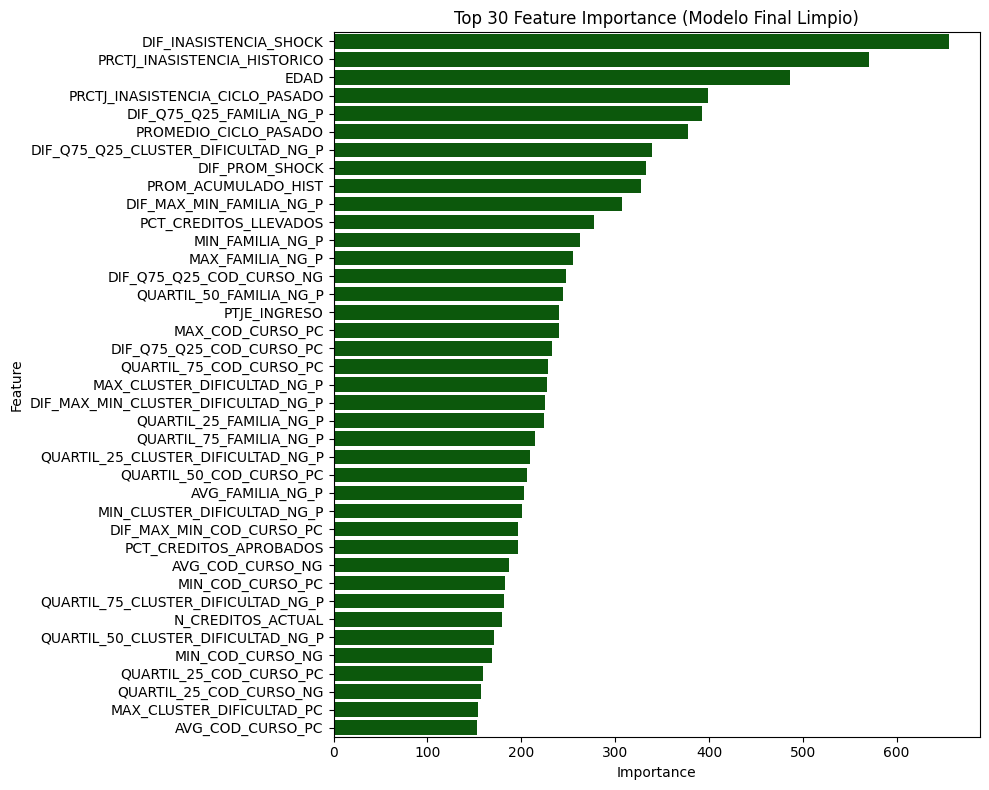

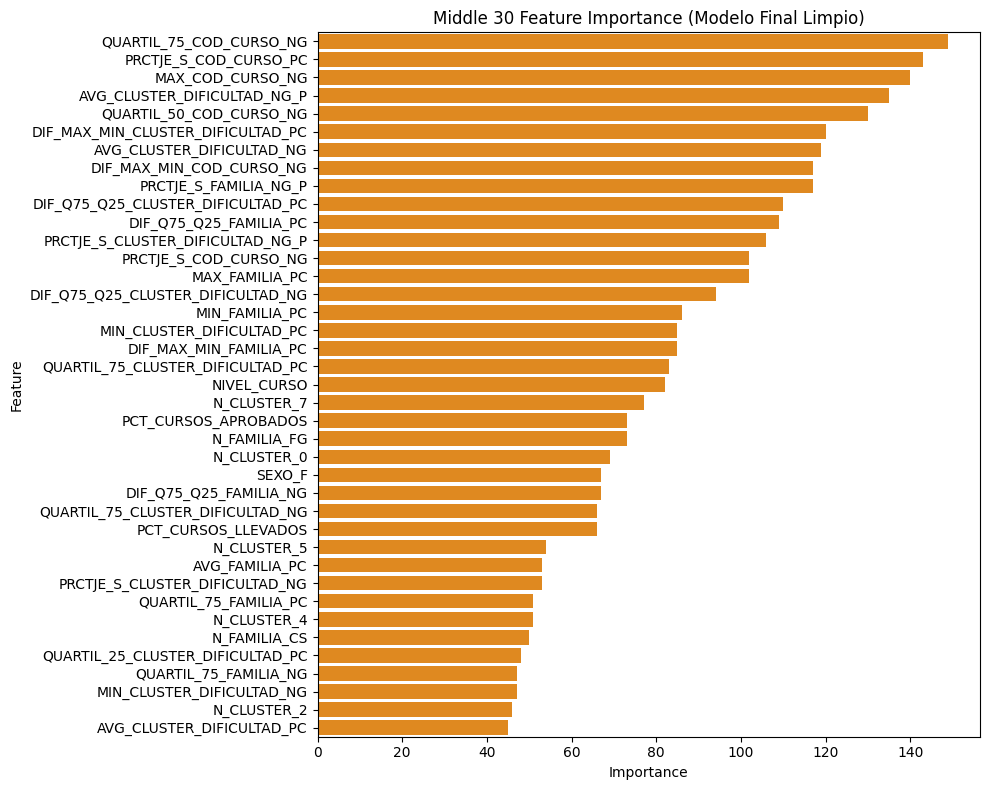

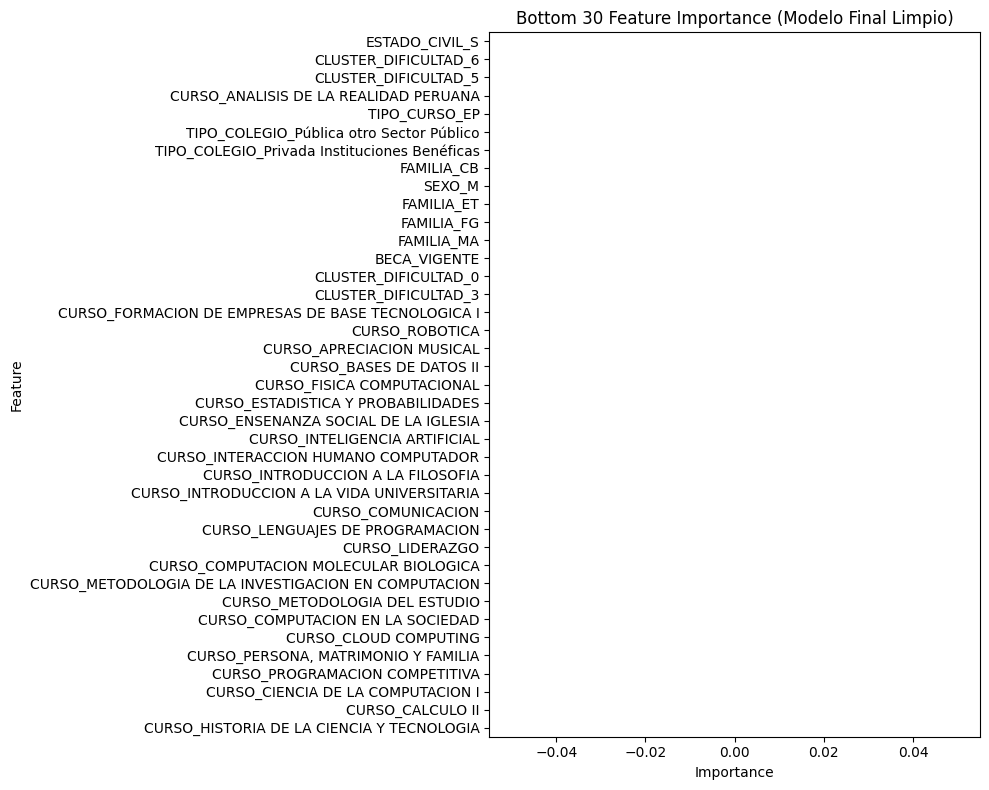

                                Feature  Importance
0                DIF_INASISTENCIA_SHOCK         656
1          PRCTJ_INASISTENCIA_HISTORICO         570
2                                  EDAD         486
3       PRCTJ_INASISTENCIA_CICLO_PASADO         399
4              DIF_Q75_Q25_FAMILIA_NG_P         393
5                 PROMEDIO_CICLO_PASADO         378
6   DIF_Q75_Q25_CLUSTER_DIFICULTAD_NG_P         339
7                        DIF_PROM_SHOCK         333
8                   PROM_ACUMULADO_HIST         328
9              DIF_MAX_MIN_FAMILIA_NG_P         307
10                PCT_CREDITOS_LLEVADOS         277
11                     MIN_FAMILIA_NG_P         263
12                     MAX_FAMILIA_NG_P         255
13             DIF_Q75_Q25_COD_CURSO_NG         248
14              QUARTIL_50_FAMILIA_NG_P         245
15                         PTJE_INGRESO         240
16                     MAX_COD_CURSO_PC         240
17             DIF_Q75_Q25_COD_CURSO_PC         233
18          

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer

def obtener_importancia_features_lgbm_FINAL(df_train):
    """
    Entrena el pipeline de LightGBM después de eliminar features problemáticas (COD_PERSONA, POBREZA_PRO)
    y extrae el ranking de las 30 features más importantes para la predicción de la NOTA.
    """
    
    # --- 0. Preparación y División de Datos Temporal ---
    
    # Eliminación de features problemáticas (leakage/ruido)

    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
        
    X_train = train.drop(columns=['NOTA'])
    Y_train = train['NOTA']
    
    print(f"Dataset de entrenamiento final listo. Filas: {len(X_train)}")
    
    # 1. Definición de Tipos de Features
    
    # Identificar automáticamente categóricas y numéricas
    categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
    numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
    
    # Excluir solo el índice entero temporal que no se necesita
    cols_to_remove_post = ['PER_MATRICULA', 'CONTRASENIA', 'COD_PERSONA', 'COD_CURSO', 'FECHA_NACIMIENTO'] #, 'CURSO', 'PER_MATRICULA', 'CLUSTER_DIFICULTAD', 'ESTADO_CIVIL', 'SEXO',
                        #    'PER_INGRESO']
    categorical_features = [c for c in categorical_features if c not in cols_to_remove_post]
    numeric_features = [c for c in numeric_features if c not in cols_to_remove_post]
    
    # 2. Creación del Preprocesador
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])
    
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')), # Imputación de NaNs en features temporales
        ('scaler', StandardScaler())
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ],
        remainder='drop'
    )

    # 3. Entrenamiento del Pipeline LGBM (Usando los parámetros óptimos, si los tuviéramos)
    # Volvemos a los parámetros base si no se usa el tuning, para la importancia
    model = LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=42, n_jobs=-1)
    full_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', model)])
    
    print("Iniciando re-entrenamiento del Pipeline LGBM para el ranking de importancia...")
    full_pipeline.fit(X_train, Y_train)
    
    # 4. Extracción de Nombres de Features
    ohe_features = list(full_pipeline['preprocessor'].named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))
    all_features = numeric_features + ohe_features
    
    # 5. Extracción y Ranking de Importancia
    importances = full_pipeline['regressor'].feature_importances_
    
    feature_importance_df = pd.DataFrame({
        'Feature': all_features,
        'Importance': importances # Usamos el valor absoluto si solo queremos magnitud, pero LGBM ya da positivos
    }).sort_values(by='Importance', ascending=False)

    # 6. Visualización y Retorno del Top 30
    print('Dimensiones de feature importance:', feature_importance_df.shape)
    top_30 = feature_importance_df.head(int(CANT_FEATURES/3)).reset_index(drop=True)
    middle_30 = feature_importance_df.iloc[int(CANT_FEATURES/3):2* int(CANT_FEATURES/3)].reset_index(drop=True)
    peores_30 = feature_importance_df.tail(int(CANT_FEATURES/3)).reset_index(drop=True)

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=top_30, color='darkgreen')
    plt.title('Top 30 Feature Importance (Modelo Final Limpio)')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=middle_30, color='darkorange')
    plt.title('Middle 30 Feature Importance (Modelo Final Limpio)')
    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(10, 8))
    sns.barplot(x='Importance', y='Feature', data=peores_30, color='darkred')
    plt.title('Bottom 30 Feature Importance (Modelo Final Limpio)')
    plt.tight_layout()
    plt.show()

    return top_30, feature_importance_df


# --- La función ya está lista para usarse con tu df_train ---
importancia_features_final, feature_importance_df = obtener_importancia_features_lgbm_FINAL(df_train)
print(importancia_features_final)

# MODELADO

## modelo hibrido

In [44]:
# summary de notas
print("Summary de Notas de Train:")
print(Y_train.describe())
print("\nSummary de Notas de Test:")
print(Y_test.describe())

Summary de Notas de Train:
count    11245.0000
mean        12.1461
std          3.7153
min          0.0600
25%         10.6600
50%         12.7400
75%         14.6000
max         20.0000
Name: NOTA, dtype: float64

Summary de Notas de Test:
count    1187.0000
mean       12.7071
std         3.8155
min         0.0300
25%        11.5100
50%        13.3000
75%        15.1500
max        19.9000
Name: NOTA, dtype: float64


### clasificador

In [45]:


def plot_matrices_normalizadas_binarias(resultados_clasificador_dict, title_suffix="Detección de Excelencia"):
    """
    Itera sobre el diccionario de resultados (K, Método, Modelo) y plotea las 
    matrices de confusión normalizadas en una sola figura horizontal.
    """
    
    model_labels = ['No Alto (0)', 'Alto (1)']
    
    # 1. Preparar la lista de figuras a plotear
    # Almacenaremos tuplas: (Título, Matriz_Normalizada)
    matrices_a_plotear = []

    # Iterar Nivel 1: K (15, 20, 30, 70)
    for k, resultados_por_k in resultados_clasificador_dict.items():
        
        # Iterar Nivel 2: Método de Selección ('correlacion', 'mi', 'f_test', etc.)
        for metodo_seleccion, metricas_por_metodo in resultados_por_k.items():
            
            # Asumimos que el resultado está anidado bajo la única clave de modelo (ej: 'LGBM_Alto')
            # Extraemos el primer valor del diccionario más interno

            matriz_normalizada = metricas_por_metodo['Matriz_Confusion_normalizada']
            
            # Crear el título único para cada gráfico
            titulo = f"K={k} - Método: {metodo_seleccion.upper()}"
            
            matrices_a_plotear.append((titulo, matriz_normalizada))

    
    # 2. Configurar la figura para el plot (Múltiples subplots)
    
    num_plots = len(matrices_a_plotear)
    # Asegurarse de que 'axes' sea un array incluso para un solo plot
    if num_plots == 1:
        axes = [axes]

    print(f"\nGenerando {num_plots} Matrices de Confusión Normalizadas:")

    # 3. Plotear cada matriz en columnas de 3
    cols = 3
    rows = (num_plots + cols - 1) // cols  # Calcular número de filas necesarias
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4.5 * rows))
    axes = axes.flatten()  # Aplanar para facilitar el acceso

    for i, (titulo, matriz) in enumerate(matrices_a_plotear):
        
        # El Recall de la Clase 1 (Alto) es matriz[1, 1]
        recall_alto = matriz[1, 1]
        
        sns.heatmap(matriz, annot=True, fmt='.2f', cmap='Blues', 
                    xticklabels=model_labels, yticklabels=model_labels, 
                    ax=axes[i], cbar=False)
        
        axes[i].set_title(f"{titulo}\nRecall Alto: {recall_alto:.2f}", fontsize=10)
        axes[i].set_xlabel('Predicción')
        
    fig.suptitle(f"Comparativa de Clasificadores Binarios - {title_suffix}", fontsize=14, y=1.05)
    plt.tight_layout()
    plt.show()

# # --- Cómo usar esta función ---

# best = None
# # Usaremos Recall_Weighted como el proxy principal de detección/cobertura
# best_recall_weighted = -np.inf 

# # Iterar Nivel 1: K (ej. 10, 15, 20, 70)
# for k, resultados_por_k in resultados_clasificador_B.items():
    
#     # Iterar Nivel 2: Método de Selección ('correlacion', 'mi', 'f_test', etc.)
#     for metodo_seleccion, metricas in resultados_por_k.items():
        
#         # 1. Obtener la métrica clave para la búsqueda (Detección)
#         # Usamos Recall_Weighted como proxy de la capacidad de detección.
#         recall_score = float(metricas['Recall_Alto']) 
        
#         # 2. Búsqueda: Maximizar la Detección
#         if recall_score > best_recall_weighted:
#             best_recall_weighted = recall_score
            
#             best = {
#                 'k': k,
#                 'metodo_seleccion': metodo_seleccion,
#                 'F1_Score_Alto': float(metricas['F1_Score_Alto']),
#                 'Accuracy': float(metricas['Accuracy']),
#                 'Recall_Alto': recall_score,
#                 'Pipeline': metricas['Pipeline'],
#                 'Matriz_Confusion': metricas['Matriz_Confusion'],
#                 'Matriz_Confusion_normalizada': metricas['Matriz_Confusion_normalizada']
#             }
#         print(f"Probado K={k}, Método={metodo_seleccion}, Recall_Alto={recall_score:.4f}")


#### Clasificador A

##### busqueda


############################## Evaluación Completa para Top 70 Features ##############################


==================== Evaluación con Top 70 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


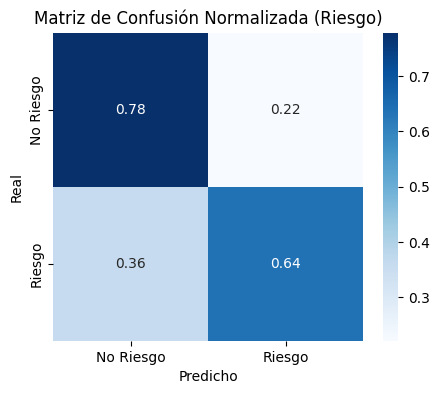

   Recall de Riesgo (Clase 1): 0.6379

Resultados para el Top 70 basado en correlacion:
{'Accuracy': '0.7439', 'Precision_W': '0.7746', 'Recall_W': '0.7439', 'F1_Score_W': '0.7547', 'Recall_Riesgo': '0.6379', 'F1_Riesgo': '0.5490', 'Matriz_Confusion': array([[698, 199],
       [105, 185]]), 'Matriz_Confusion_normalizada': array([[0.77814939, 0.22185061],
       [0.36206897, 0.63793103]])}

==================== Evaluación con Top 70 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


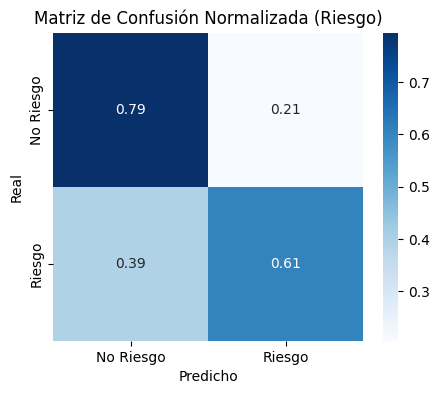

   Recall de Riesgo (Clase 1): 0.6069

Resultados para el Top 70 basado en mi:
{'Accuracy': '0.7489', 'Precision_W': '0.7710', 'Recall_W': '0.7489', 'F1_Score_W': '0.7574', 'Recall_Riesgo': '0.6069', 'F1_Riesgo': '0.5415', 'Matriz_Confusion': array([[713, 184],
       [114, 176]]), 'Matriz_Confusion_normalizada': array([[0.79487179, 0.20512821],
       [0.39310345, 0.60689655]])}

==================== Evaluación con Top 70 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


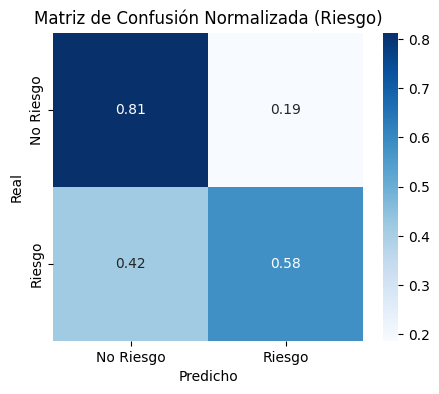

   Recall de Riesgo (Clase 1): 0.5828

Resultados para el Top 70 basado en f_test:
{'Accuracy': '0.7565', 'Precision_W': '0.7706', 'Recall_W': '0.7565', 'F1_Score_W': '0.7624', 'Recall_Riesgo': '0.5828', 'F1_Riesgo': '0.5391', 'Matriz_Confusion': array([[729, 168],
       [121, 169]]), 'Matriz_Confusion_normalizada': array([[0.81270903, 0.18729097],
       [0.41724138, 0.58275862]])}

==================== Evaluación con Top 70 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


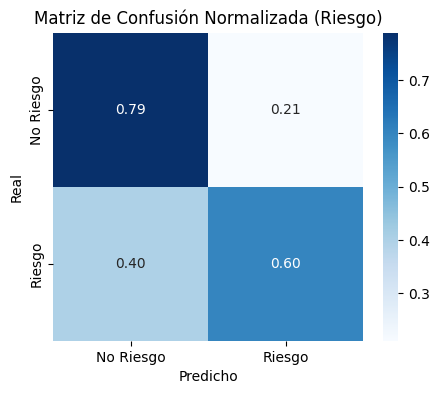

   Recall de Riesgo (Clase 1): 0.6000

Resultados para el Top 70 basado en lgbm:
{'Accuracy': '0.7430', 'Precision_W': '0.7664', 'Recall_W': '0.7430', 'F1_Score_W': '0.7520', 'Recall_Riesgo': '0.6000', 'F1_Riesgo': '0.5329', 'Matriz_Confusion': array([[708, 189],
       [116, 174]]), 'Matriz_Confusion_normalizada': array([[0.78929766, 0.21070234],
       [0.4       , 0.6       ]])}

==================== Evaluación con Top 70 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


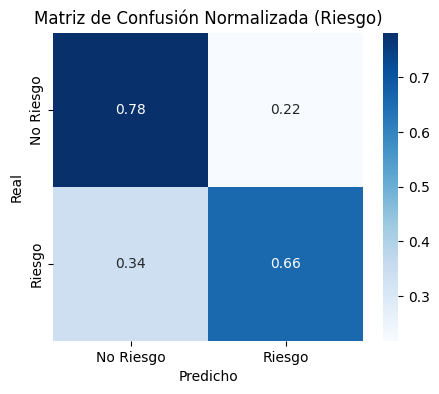

   Recall de Riesgo (Clase 1): 0.6586

Resultados para el Top 70 basado en consolidado:
{'Accuracy': '0.7515', 'Precision_W': '0.7827', 'Recall_W': '0.7515', 'F1_Score_W': '0.7622', 'Recall_Riesgo': '0.6586', 'F1_Riesgo': '0.5643', 'Matriz_Confusion': array([[701, 196],
       [ 99, 191]]), 'Matriz_Confusion_normalizada': array([[0.78149387, 0.21850613],
       [0.34137931, 0.65862069]])}


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMClassifier
from sklearn.metrics import recall_score, f1_score, accuracy_score, precision_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.utils.class_weight import compute_sample_weight

def entrenar_clasificador_riesgo(df_train, features_list):
    """
    Entrena un clasificador binario (LGBM) manejando automáticamente 
    la diferencia entre features One-Hot (SEXO_F) y columnas crudas (SEXO).
    """
    
    # ==============================================================================
    # 1. AUTO-CORRECCIÓN DE FEATURES (La parte nueva)
    # ==============================================================================
    features_para_entrenamiento = set()
    cols_categoricas_disponibles = df_train.select_dtypes(include=['object', 'category']).columns
    
    for feat in features_list:
        if feat in df_train.columns:
            # Caso 1: La variable existe tal cual (ej: 'NOTA', 'EDAD')
            features_para_entrenamiento.add(feat)
        else:
            # Caso 2: Es una variable One-Hot (ej: 'SEXO_F'), buscamos su origen ('SEXO')
            encontrado = False
            for cat_col in cols_categoricas_disponibles:
                # Si 'SEXO_F' empieza con 'SEXO', asumimos que 'SEXO' es la columna necesaria
                if feat.startswith(str(cat_col)):
                    features_para_entrenamiento.add(cat_col)
                    encontrado = True
                    break
            # Opcional: Si no encuentra el padre, podrías imprimir un aviso, pero aquí lo omitimos para limpieza.

    real_features_list = list(features_para_entrenamiento)
    # ==============================================================================

    # Preparación de datos
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()

    # Target
    Y_train_risk = (train['NOTA'] < UMBRAL_RIESGO).astype(int)
    Y_test_risk = (test['NOTA'] < UMBRAL_RIESGO).astype(int)
    
    # --- AQUÍ LA MAGIA: Usamos la lista corregida (real_features_list) ---
    X_train = train[real_features_list]
    X_test = test[real_features_list]
    
    # Identificar tipos de columnas automáticamente sobre lo que realmente entró
    features_numericos = X_train.select_dtypes(include=np.number).columns.tolist()
    features_categoricos = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

    # --- 2. Pipeline ---
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])

    categoric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, features_numericos),
            ('cat', categoric_transformer, features_categoricos)
        ],        
        remainder='drop'
    )
    
    # Pesos
    sample_weights_train = compute_sample_weight(class_weight='balanced', y=Y_train_risk)
    
    # Modelo
    lgbm_classifier = LGBMClassifier(objective='binary', n_estimators=500, random_state=42, n_jobs=-1, verbose=-1)
    pipe_riesgo = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', lgbm_classifier)])
    
    # Entrenamiento
    pipe_riesgo.fit(X_train, Y_train_risk, classifier__sample_weight=sample_weights_train)
        
    # --- 3. Evaluación ---
    Y_test_pred = pipe_riesgo.predict(X_test)
        
    accuracy = accuracy_score(Y_test_risk, Y_test_pred)
    precision = precision_score(Y_test_risk, Y_test_pred, average='weighted', zero_division=0)
    recall = recall_score(Y_test_risk, Y_test_pred, average='weighted', zero_division=0)
    f1 = f1_score(Y_test_risk, Y_test_pred, average='weighted', zero_division=0)
    cm = confusion_matrix(Y_test_risk, Y_test_pred)

    recall_c1 = recall_score(Y_test_risk, Y_test_pred, pos_label=1)
    f1_c1 = f1_score(Y_test_risk, Y_test_pred, pos_label=1)
    
    # --- 4. Visualización ---
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm / cm.sum(axis=1, keepdims=True), annot=True, fmt='.2f', cmap='Blues', 
                xticklabels=['No Riesgo', 'Riesgo'], 
                yticklabels=['No Riesgo', 'Riesgo'])
    plt.title('Matriz de Confusión Normalizada (Riesgo)')
    plt.ylabel('Real')
    plt.xlabel('Predicho')
    plt.show()

    resultados = {
        'LGBM_Riesgo': {
            'Accuracy': f"{accuracy:.4f}",
            'Precision_W': f"{precision:.4f}",
            'Recall_W': f"{recall:.4f}",
            'F1_Score_W': f"{f1:.4f}",
            'Recall_Riesgo': f"{recall_c1:.4f}",
            'F1_Riesgo': f"{f1_c1:.4f}",
            'Pipeline': pipe_riesgo,
            'Matriz_Confusion': cm,
            'Matriz_Confusion_normalizada': cm / cm.sum(axis=1, keepdims=True)
        }
    }
    
    print(f"   Recall de Riesgo (Clase 1): {recall_c1:.4f}")
    
    return resultados['LGBM_Riesgo']

resultados_clasificador_A = {}
for k in [10, 15, 20, 30, 50, 70]:
    print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
    Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k, entrenar_clasificador_riesgo)
    resultados_clasificador_A[k] = Resultados

##### resultado

In [49]:
best = None
# Usaremos Recall_Weighted como el proxy principal de detección/cobertura
best_recall_weighted = -np.inf 

# Iterar Nivel 1: K (ej. 10, 15, 20, 70)
for k, resultados_por_k in resultados_clasificador_A.items():
    
    # Iterar Nivel 2: Método de Selección ('correlacion', 'mi', 'f_test', etc.)
    for metodo_seleccion, metricas in resultados_por_k.items():
        
        # 1. Obtener la métrica clave para la búsqueda (Detección)
        # Usamos Recall_Weighted como proxy de la capacidad de detección.
        metrica_a_optimizar = 'F1_Riesgo'
        recall_score = float(metricas[metrica_a_optimizar]) 
        
        # 2. Búsqueda: Maximizar la Detección
        if recall_score > best_recall_weighted:
            best_recall_weighted = recall_score
            
            best = {
                'k': k,
                'metodo_seleccion': metodo_seleccion,
                'F1_Test': float(metricas['F1_Score_W']),
                'Accuracy': float(metricas['Accuracy']),
                'Precision_Weighted': float(metricas['Precision_W']),
                'Recall_Weighted': float(metricas['Recall_W']), # Usar la métrica de búsqueda
                'Recall Riesgo': float(metricas['Recall_Riesgo']),
                'F1 Riesgo': float(metricas['F1_Riesgo']),
                'Pipeline': metricas['Pipeline'],
                'Matriz_Confusion': metricas['Matriz_Confusion'],
                'Matriz_Confusion_normalizada': metricas['Matriz_Confusion_normalizada']
            }
        print(f"Probado K={k}, Método={metodo_seleccion}, {metrica_a_optimizar}={recall_score:.4f}")


print("\n🏆 Mejor Modelo Clasificador A (Detección de Riesgo) Encontrado:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo_seleccion']}")
print(f"Recall (Weighted) en Test: {best['Recall_Weighted']:.4f}")
print(f"F1-Score (Weighted) Asociado: {best['F1_Test']:.4f}")
print(f"Accuracy en Test: {best['Accuracy']:.4f}")
print(f"Precision (Weighted) en Test: {best['Precision_Weighted']:.4f}")
print(f"Recall de Riesgo en Test: {best['Recall Riesgo']:.4f}")
print(f"F1 de Riesgo en Test: {best['F1 Riesgo']:.4f}")
print(f"Matriz de Confusión del Mejor Modelo:")
print(best['Matriz_Confusion'])
print(f"Matriz de Confusión Normalizada del Mejor Modelo:")
print(best['Matriz_Confusion_normalizada'].round(4))

# Guardar el mejor pipeline clasificador para el Paso 3
best_clasificador_A = best['Pipeline']
lista_features_A = generate_list_features(best['k'])[best['metodo_seleccion']]

Probado K=70, Método=correlacion, F1_Riesgo=0.5490
Probado K=70, Método=mi, F1_Riesgo=0.5415
Probado K=70, Método=f_test, F1_Riesgo=0.5391
Probado K=70, Método=lgbm, F1_Riesgo=0.5329
Probado K=70, Método=consolidado, F1_Riesgo=0.5643

🏆 Mejor Modelo Clasificador A (Detección de Riesgo) Encontrado:
Top K Features: 70
Método de Selección: consolidado
Recall (Weighted) en Test: 0.7515
F1-Score (Weighted) Asociado: 0.7622
Accuracy en Test: 0.7515
Precision (Weighted) en Test: 0.7827
Recall de Riesgo en Test: 0.6586
F1 de Riesgo en Test: 0.5643
Matriz de Confusión del Mejor Modelo:
[[701 196]
 [ 99 191]]
Matriz de Confusión Normalizada del Mejor Modelo:
[[0.7815 0.2185]
 [0.3414 0.6586]]


In [ ]:
# # relacion entre probabilidad de riesgo y algunas features numericas
# features_numericas_a_examinar = lista_features_A  # Añade más si es necesario  
# for feature in features_numericas_a_examinar:
#     if feature in df_falsos_positivos.columns:
#         plt.figure(figsize=(8,6))
#         sns.scatterplot(data=df_falsos_positivos, x='PROBABILIDAD_RIESGO', y=feature)
#         plt.title(f'Relación entre Probabilidad de Riesgo y {feature} (Falsos Positivos)')
#         plt.xlabel('Probabilidad de Riesgo Predicha')
#         plt.ylabel(feature)
#         plt.grid(True)
#         plt.show()

#### Clasificador B

##### busqueda


############################## Evaluación Completa para Top 10 Features ##############################


==================== Evaluación con Top 10 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


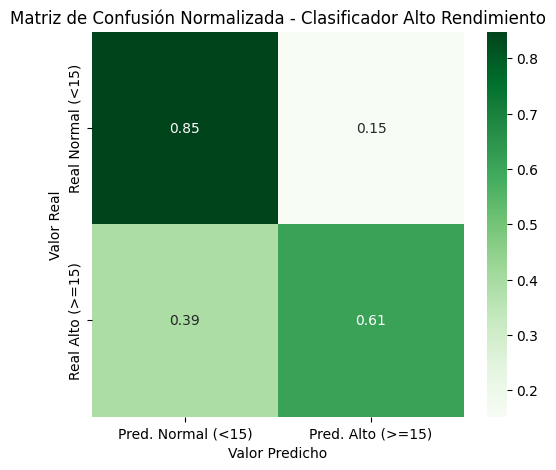

   Recall de Alto Rendimiento (Clase 1): 0.6113
   F1-Score de Alto Rendimiento: 0.6037

Resultados para el Top 10 basado en correlacion:
{'Accuracy': '0.7843', 'F1_Score_Alto': '0.6037', 'Recall_Alto': '0.6113', 'Matriz_Confusion': array([[736, 132],
       [124, 195]]), 'Matriz_Confusion_normalizada': array([[0.84792627, 0.15207373],
       [0.38871473, 0.61128527]])}

==================== Evaluación con Top 10 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


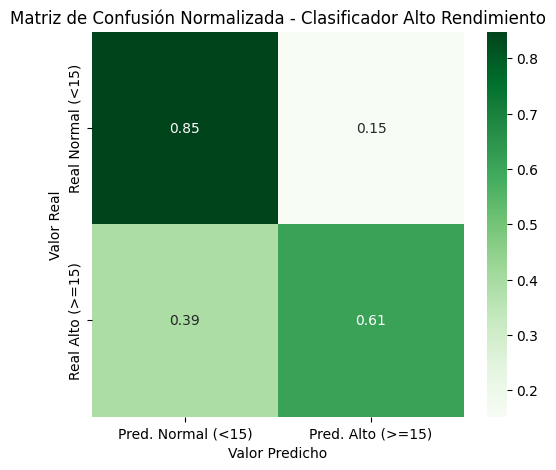

   Recall de Alto Rendimiento (Clase 1): 0.6113
   F1-Score de Alto Rendimiento: 0.6037

Resultados para el Top 10 basado en mi:
{'Accuracy': '0.7843', 'F1_Score_Alto': '0.6037', 'Recall_Alto': '0.6113', 'Matriz_Confusion': array([[736, 132],
       [124, 195]]), 'Matriz_Confusion_normalizada': array([[0.84792627, 0.15207373],
       [0.38871473, 0.61128527]])}

==================== Evaluación con Top 10 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


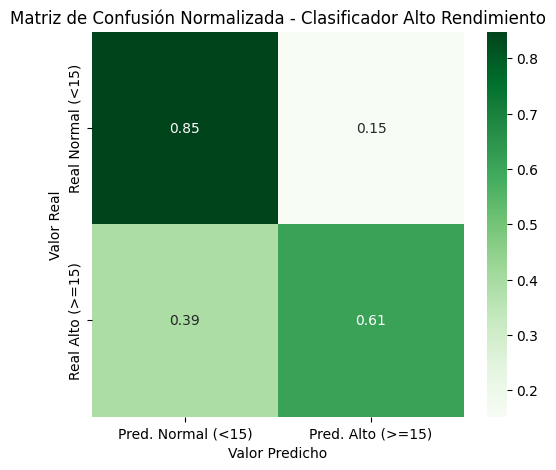

   Recall de Alto Rendimiento (Clase 1): 0.6113
   F1-Score de Alto Rendimiento: 0.6037

Resultados para el Top 10 basado en f_test:
{'Accuracy': '0.7843', 'F1_Score_Alto': '0.6037', 'Recall_Alto': '0.6113', 'Matriz_Confusion': array([[736, 132],
       [124, 195]]), 'Matriz_Confusion_normalizada': array([[0.84792627, 0.15207373],
       [0.38871473, 0.61128527]])}

==================== Evaluación con Top 10 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


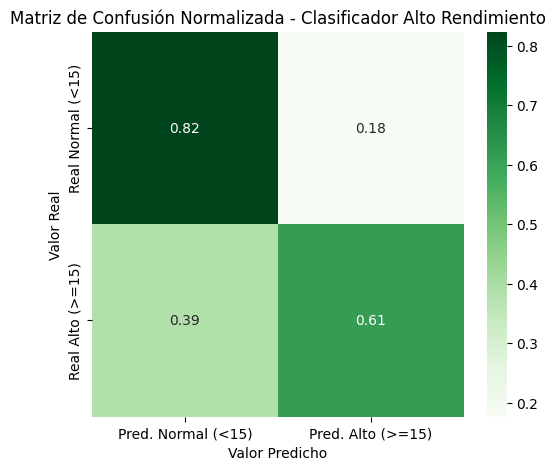

   Recall de Alto Rendimiento (Clase 1): 0.6144
   F1-Score de Alto Rendimiento: 0.5868

Resultados para el Top 10 basado en lgbm:
{'Accuracy': '0.7675', 'F1_Score_Alto': '0.5868', 'Recall_Alto': '0.6144', 'Matriz_Confusion': array([[715, 153],
       [123, 196]]), 'Matriz_Confusion_normalizada': array([[0.82373272, 0.17626728],
       [0.38557994, 0.61442006]])}

==================== Evaluación con Top 10 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


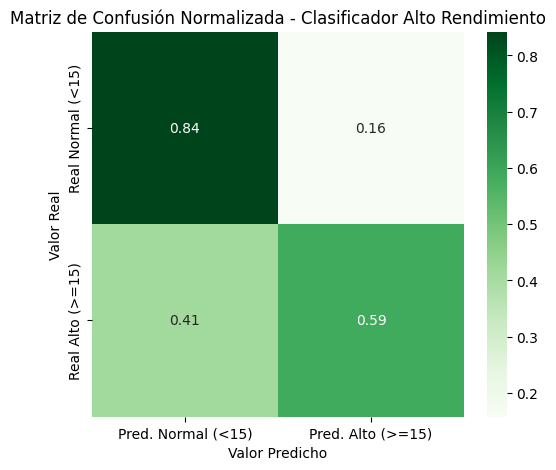

   Recall de Alto Rendimiento (Clase 1): 0.5862
   F1-Score de Alto Rendimiento: 0.5816

Resultados para el Top 10 basado en consolidado:
{'Accuracy': '0.7734', 'F1_Score_Alto': '0.5816', 'Recall_Alto': '0.5862', 'Matriz_Confusion': array([[731, 137],
       [132, 187]]), 'Matriz_Confusion_normalizada': array([[0.8421659, 0.1578341],
       [0.4137931, 0.5862069]])}

############################## Evaluación Completa para Top 15 Features ##############################


==================== Evaluación con Top 15 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


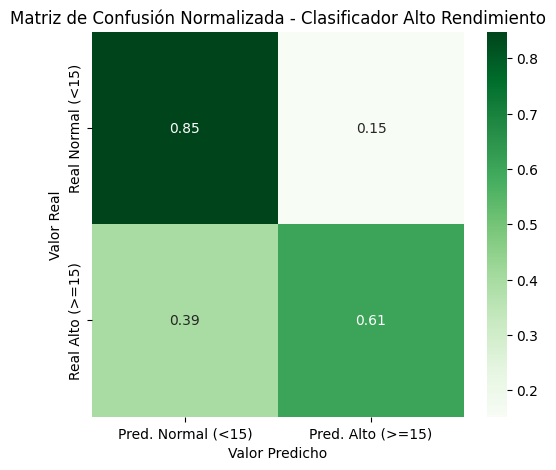

   Recall de Alto Rendimiento (Clase 1): 0.6050
   F1-Score de Alto Rendimiento: 0.5994

Resultados para el Top 15 basado en correlacion:
{'Accuracy': '0.7826', 'F1_Score_Alto': '0.5994', 'Recall_Alto': '0.6050', 'Matriz_Confusion': array([[736, 132],
       [126, 193]]), 'Matriz_Confusion_normalizada': array([[0.84792627, 0.15207373],
       [0.39498433, 0.60501567]])}

==================== Evaluación con Top 15 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


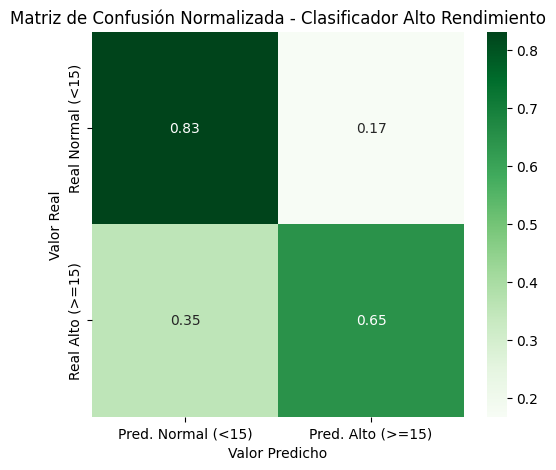

   Recall de Alto Rendimiento (Clase 1): 0.6458
   F1-Score de Alto Rendimiento: 0.6140

Resultados para el Top 15 basado en mi:
{'Accuracy': '0.7818', 'F1_Score_Alto': '0.6140', 'Recall_Alto': '0.6458', 'Matriz_Confusion': array([[722, 146],
       [113, 206]]), 'Matriz_Confusion_normalizada': array([[0.83179724, 0.16820276],
       [0.35423197, 0.64576803]])}

==================== Evaluación con Top 15 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


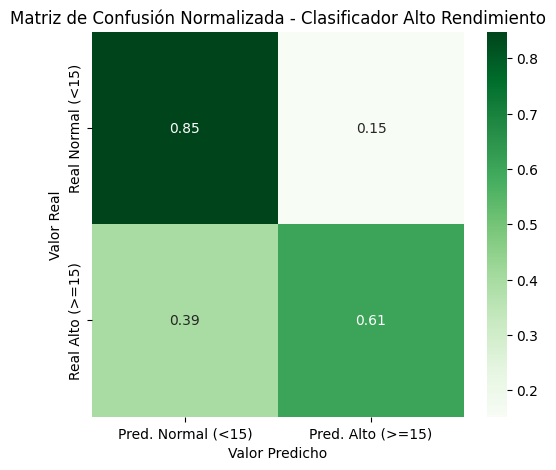

   Recall de Alto Rendimiento (Clase 1): 0.6050
   F1-Score de Alto Rendimiento: 0.5994

Resultados para el Top 15 basado en f_test:
{'Accuracy': '0.7826', 'F1_Score_Alto': '0.5994', 'Recall_Alto': '0.6050', 'Matriz_Confusion': array([[736, 132],
       [126, 193]]), 'Matriz_Confusion_normalizada': array([[0.84792627, 0.15207373],
       [0.39498433, 0.60501567]])}

==================== Evaluación con Top 15 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


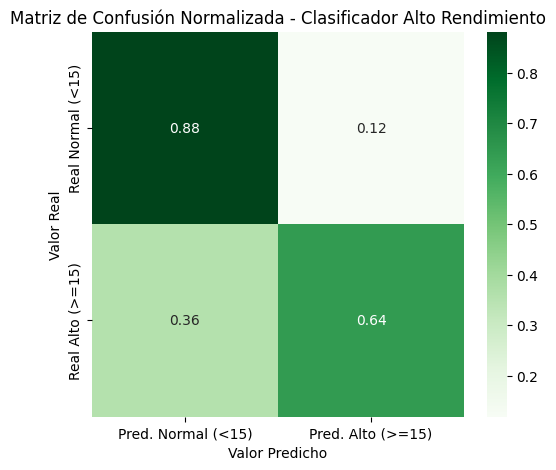

   Recall de Alto Rendimiento (Clase 1): 0.6426
   F1-Score de Alto Rendimiento: 0.6539

Resultados para el Top 15 basado en lgbm:
{'Accuracy': '0.8172', 'F1_Score_Alto': '0.6539', 'Recall_Alto': '0.6426', 'Matriz_Confusion': array([[765, 103],
       [114, 205]]), 'Matriz_Confusion_normalizada': array([[0.88133641, 0.11866359],
       [0.35736677, 0.64263323]])}

==================== Evaluación con Top 15 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


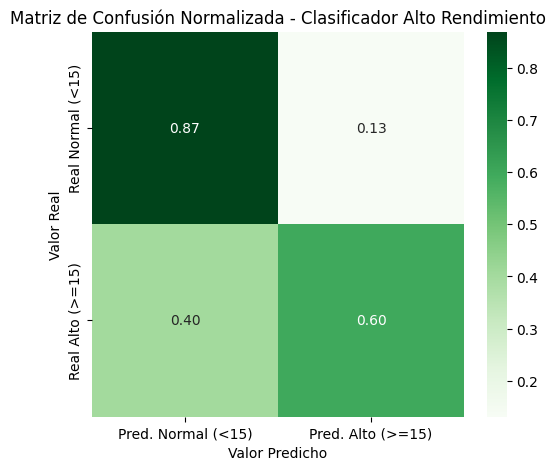

   Recall de Alto Rendimiento (Clase 1): 0.5956
   F1-Score de Alto Rendimiento: 0.6100

Resultados para el Top 15 basado en consolidado:
{'Accuracy': '0.7953', 'F1_Score_Alto': '0.6100', 'Recall_Alto': '0.5956', 'Matriz_Confusion': array([[754, 114],
       [129, 190]]), 'Matriz_Confusion_normalizada': array([[0.86866359, 0.13133641],
       [0.40438871, 0.59561129]])}

############################## Evaluación Completa para Top 20 Features ##############################


==================== Evaluación con Top 20 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


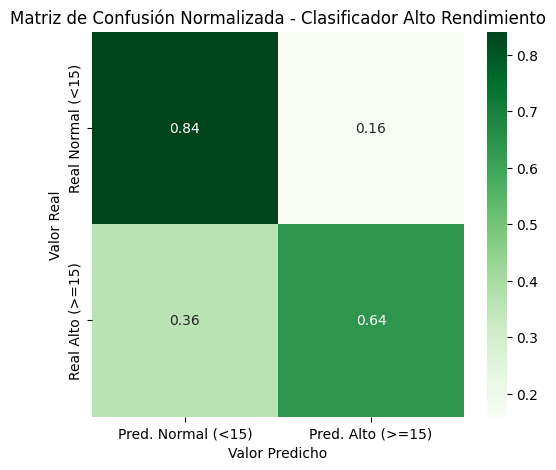

   Recall de Alto Rendimiento (Clase 1): 0.6395
   F1-Score de Alto Rendimiento: 0.6172

Resultados para el Top 20 basado en correlacion:
{'Accuracy': '0.7869', 'F1_Score_Alto': '0.6172', 'Recall_Alto': '0.6395', 'Matriz_Confusion': array([[730, 138],
       [115, 204]]), 'Matriz_Confusion_normalizada': array([[0.84101382, 0.15898618],
       [0.36050157, 0.63949843]])}

==================== Evaluación con Top 20 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


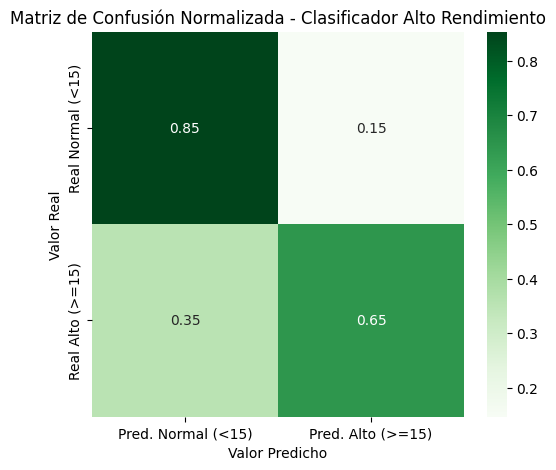

   Recall de Alto Rendimiento (Clase 1): 0.6458
   F1-Score de Alto Rendimiento: 0.6319

Resultados para el Top 20 basado en mi:
{'Accuracy': '0.7978', 'F1_Score_Alto': '0.6319', 'Recall_Alto': '0.6458', 'Matriz_Confusion': array([[741, 127],
       [113, 206]]), 'Matriz_Confusion_normalizada': array([[0.85368664, 0.14631336],
       [0.35423197, 0.64576803]])}

==================== Evaluación con Top 20 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


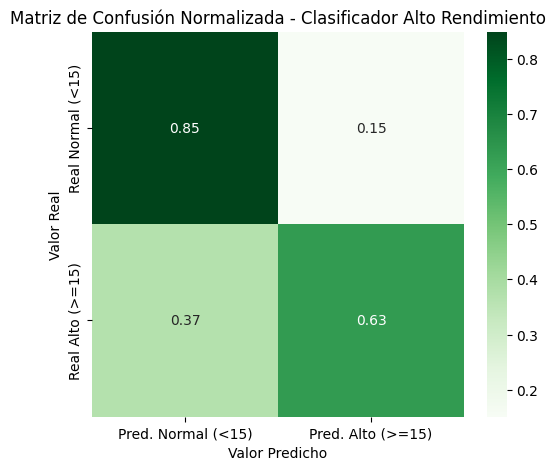

   Recall de Alto Rendimiento (Clase 1): 0.6301
   F1-Score de Alto Rendimiento: 0.6175

Resultados para el Top 20 basado en f_test:
{'Accuracy': '0.7902', 'F1_Score_Alto': '0.6175', 'Recall_Alto': '0.6301', 'Matriz_Confusion': array([[737, 131],
       [118, 201]]), 'Matriz_Confusion_normalizada': array([[0.84907834, 0.15092166],
       [0.36990596, 0.63009404]])}

==================== Evaluación con Top 20 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


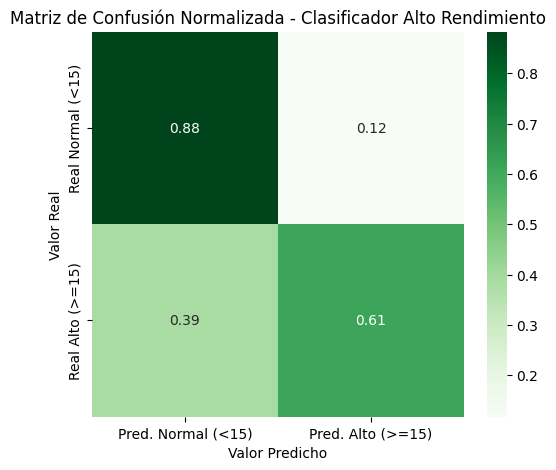

   Recall de Alto Rendimiento (Clase 1): 0.6113
   F1-Score de Alto Rendimiento: 0.6331

Resultados para el Top 20 basado en lgbm:
{'Accuracy': '0.8096', 'F1_Score_Alto': '0.6331', 'Recall_Alto': '0.6113', 'Matriz_Confusion': array([[766, 102],
       [124, 195]]), 'Matriz_Confusion_normalizada': array([[0.88248848, 0.11751152],
       [0.38871473, 0.61128527]])}

==================== Evaluación con Top 20 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


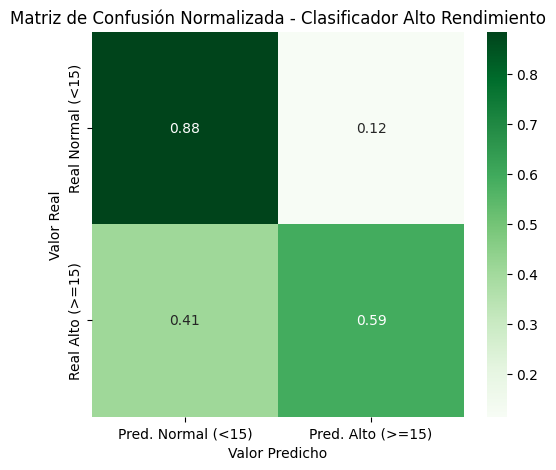

   Recall de Alto Rendimiento (Clase 1): 0.5925
   F1-Score de Alto Rendimiento: 0.6217

Resultados para el Top 20 basado en consolidado:
{'Accuracy': '0.8062', 'F1_Score_Alto': '0.6217', 'Recall_Alto': '0.5925', 'Matriz_Confusion': array([[768, 100],
       [130, 189]]), 'Matriz_Confusion_normalizada': array([[0.88479263, 0.11520737],
       [0.40752351, 0.59247649]])}

############################## Evaluación Completa para Top 30 Features ##############################


==================== Evaluación con Top 30 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


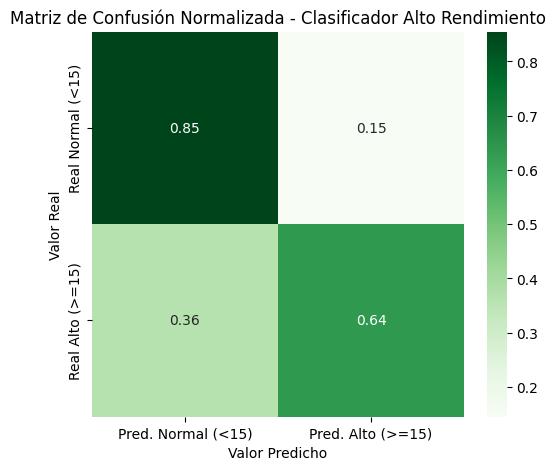

   Recall de Alto Rendimiento (Clase 1): 0.6364
   F1-Score de Alto Rendimiento: 0.6265

Resultados para el Top 30 basado en correlacion:
{'Accuracy': '0.7961', 'F1_Score_Alto': '0.6265', 'Recall_Alto': '0.6364', 'Matriz_Confusion': array([[742, 126],
       [116, 203]]), 'Matriz_Confusion_normalizada': array([[0.85483871, 0.14516129],
       [0.36363636, 0.63636364]])}

==================== Evaluación con Top 30 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


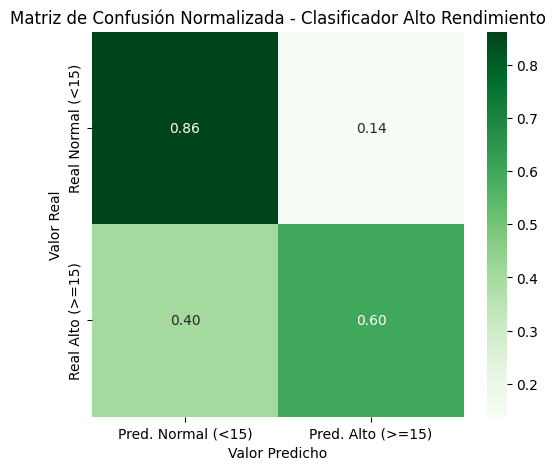

   Recall de Alto Rendimiento (Clase 1): 0.5987
   F1-Score de Alto Rendimiento: 0.6063

Resultados para el Top 30 basado en mi:
{'Accuracy': '0.7911', 'F1_Score_Alto': '0.6063', 'Recall_Alto': '0.5987', 'Matriz_Confusion': array([[748, 120],
       [128, 191]]), 'Matriz_Confusion_normalizada': array([[0.86175115, 0.13824885],
       [0.40125392, 0.59874608]])}

==================== Evaluación con Top 30 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


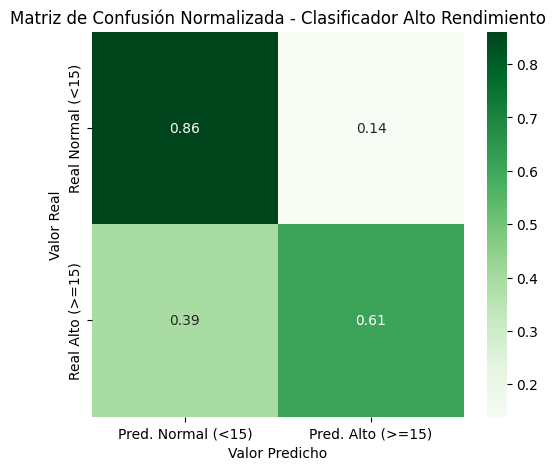

   Recall de Alto Rendimiento (Clase 1): 0.6082
   F1-Score de Alto Rendimiento: 0.6120

Resultados para el Top 30 basado en f_test:
{'Accuracy': '0.7928', 'F1_Score_Alto': '0.6120', 'Recall_Alto': '0.6082', 'Matriz_Confusion': array([[747, 121],
       [125, 194]]), 'Matriz_Confusion_normalizada': array([[0.86059908, 0.13940092],
       [0.39184953, 0.60815047]])}

==================== Evaluación con Top 30 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


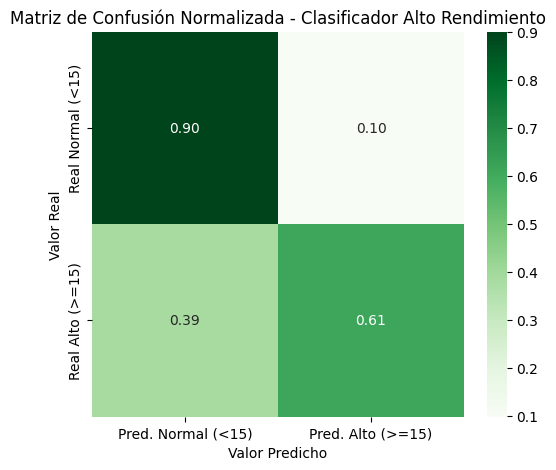

   Recall de Alto Rendimiento (Clase 1): 0.6144
   F1-Score de Alto Rendimiento: 0.6522

Resultados para el Top 30 basado en lgbm:
{'Accuracy': '0.8239', 'F1_Score_Alto': '0.6522', 'Recall_Alto': '0.6144', 'Matriz_Confusion': array([[782,  86],
       [123, 196]]), 'Matriz_Confusion_normalizada': array([[0.90092166, 0.09907834],
       [0.38557994, 0.61442006]])}

==================== Evaluación con Top 30 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


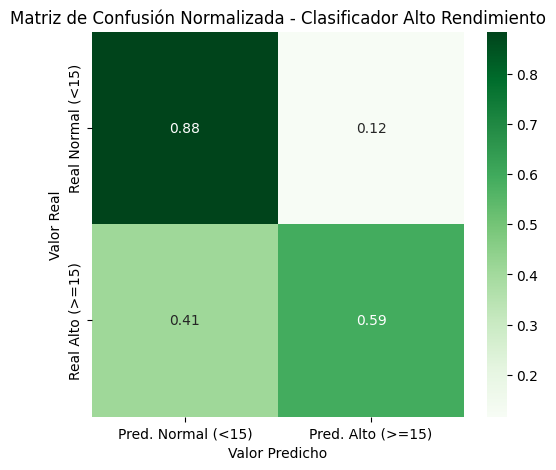

   Recall de Alto Rendimiento (Clase 1): 0.5925
   F1-Score de Alto Rendimiento: 0.6207

Resultados para el Top 30 basado en consolidado:
{'Accuracy': '0.8054', 'F1_Score_Alto': '0.6207', 'Recall_Alto': '0.5925', 'Matriz_Confusion': array([[767, 101],
       [130, 189]]), 'Matriz_Confusion_normalizada': array([[0.88364055, 0.11635945],
       [0.40752351, 0.59247649]])}

############################## Evaluación Completa para Top 50 Features ##############################


==================== Evaluación con Top 50 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


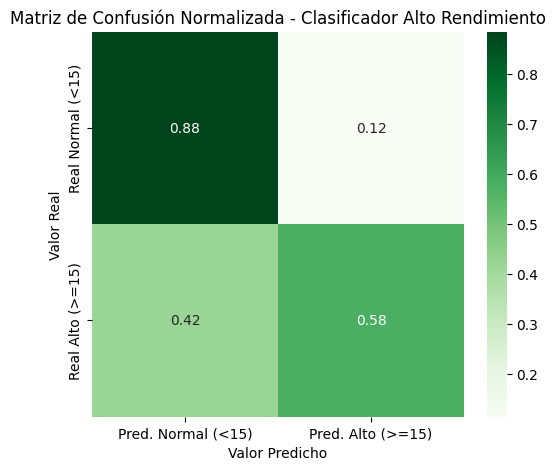

   Recall de Alto Rendimiento (Clase 1): 0.5799
   F1-Score de Alto Rendimiento: 0.6126

Resultados para el Top 50 basado en correlacion:
{'Accuracy': '0.8029', 'F1_Score_Alto': '0.6126', 'Recall_Alto': '0.5799', 'Matriz_Confusion': array([[768, 100],
       [134, 185]]), 'Matriz_Confusion_normalizada': array([[0.88479263, 0.11520737],
       [0.4200627 , 0.5799373 ]])}

==================== Evaluación con Top 50 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


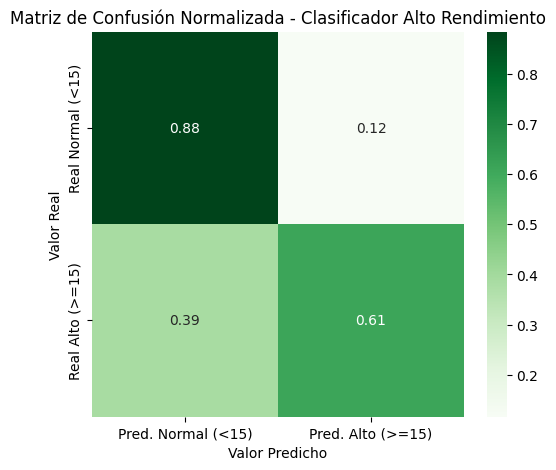

   Recall de Alto Rendimiento (Clase 1): 0.6113
   F1-Score de Alto Rendimiento: 0.6341

Resultados para el Top 50 basado en mi:
{'Accuracy': '0.8104', 'F1_Score_Alto': '0.6341', 'Recall_Alto': '0.6113', 'Matriz_Confusion': array([[767, 101],
       [124, 195]]), 'Matriz_Confusion_normalizada': array([[0.88364055, 0.11635945],
       [0.38871473, 0.61128527]])}

==================== Evaluación con Top 50 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


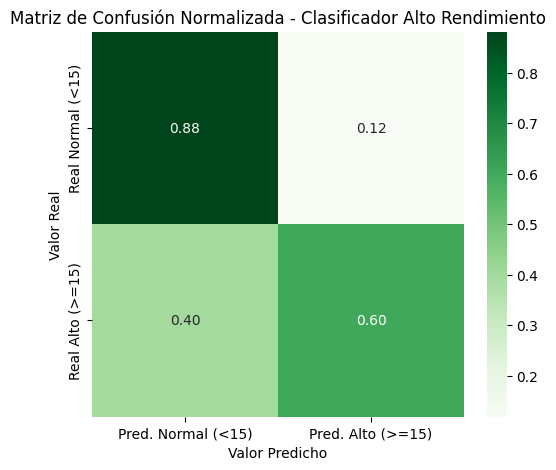

   Recall de Alto Rendimiento (Clase 1): 0.6019
   F1-Score de Alto Rendimiento: 0.6254

Resultados para el Top 50 basado en f_test:
{'Accuracy': '0.8062', 'F1_Score_Alto': '0.6254', 'Recall_Alto': '0.6019', 'Matriz_Confusion': array([[765, 103],
       [127, 192]]), 'Matriz_Confusion_normalizada': array([[0.88133641, 0.11866359],
       [0.39811912, 0.60188088]])}

==================== Evaluación con Top 50 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


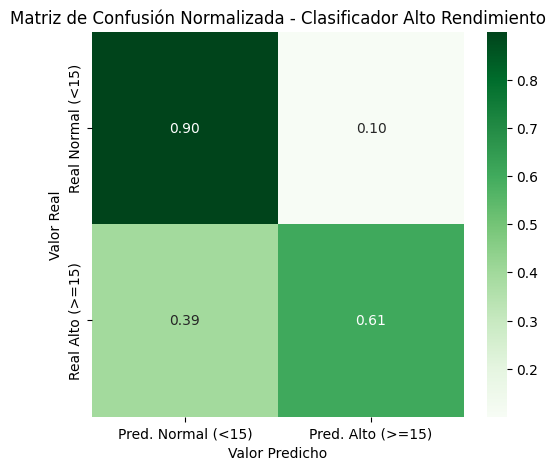

   Recall de Alto Rendimiento (Clase 1): 0.6050
   F1-Score de Alto Rendimiento: 0.6444

Resultados para el Top 50 basado en lgbm:
{'Accuracy': '0.8206', 'F1_Score_Alto': '0.6444', 'Recall_Alto': '0.6050', 'Matriz_Confusion': array([[781,  87],
       [126, 193]]), 'Matriz_Confusion_normalizada': array([[0.89976959, 0.10023041],
       [0.39498433, 0.60501567]])}

==================== Evaluación con Top 50 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


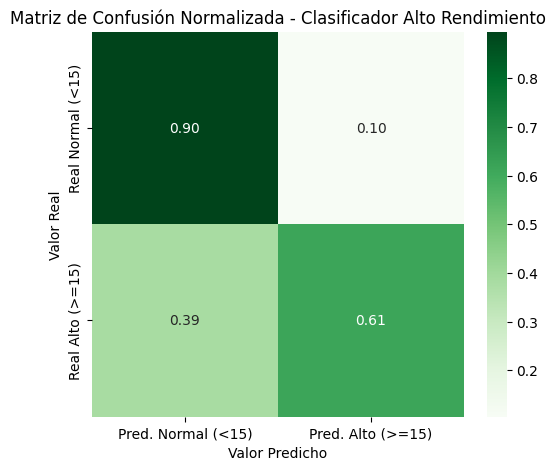

   Recall de Alto Rendimiento (Clase 1): 0.6144
   F1-Score de Alto Rendimiento: 0.6469

Resultados para el Top 50 basado en consolidado:
{'Accuracy': '0.8197', 'F1_Score_Alto': '0.6469', 'Recall_Alto': '0.6144', 'Matriz_Confusion': array([[777,  91],
       [123, 196]]), 'Matriz_Confusion_normalizada': array([[0.89516129, 0.10483871],
       [0.38557994, 0.61442006]])}

############################## Evaluación Completa para Top 70 Features ##############################


==================== Evaluación con Top 70 basado en correlacion ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


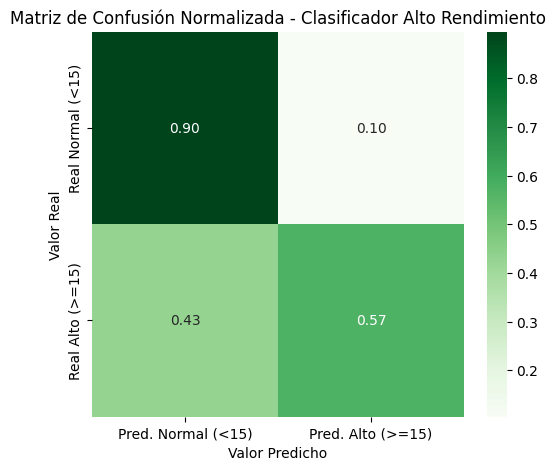

   Recall de Alto Rendimiento (Clase 1): 0.5737
   F1-Score de Alto Rendimiento: 0.6172

Resultados para el Top 70 basado en correlacion:
{'Accuracy': '0.8088', 'F1_Score_Alto': '0.6172', 'Recall_Alto': '0.5737', 'Matriz_Confusion': array([[777,  91],
       [136, 183]]), 'Matriz_Confusion_normalizada': array([[0.89516129, 0.10483871],
       [0.42633229, 0.57366771]])}

==================== Evaluación con Top 70 basado en mi ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


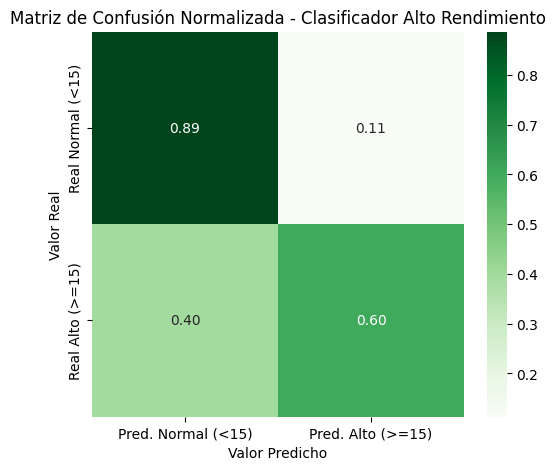

   Recall de Alto Rendimiento (Clase 1): 0.6019
   F1-Score de Alto Rendimiento: 0.6305

Resultados para el Top 70 basado en mi:
{'Accuracy': '0.8104', 'F1_Score_Alto': '0.6305', 'Recall_Alto': '0.6019', 'Matriz_Confusion': array([[770,  98],
       [127, 192]]), 'Matriz_Confusion_normalizada': array([[0.88709677, 0.11290323],
       [0.39811912, 0.60188088]])}

==================== Evaluación con Top 70 basado en f_test ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


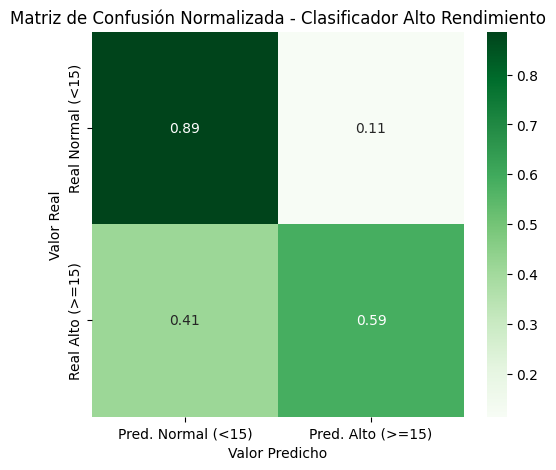

   Recall de Alto Rendimiento (Clase 1): 0.5862
   F1-Score de Alto Rendimiento: 0.6182

Resultados para el Top 70 basado en f_test:
{'Accuracy': '0.8054', 'F1_Score_Alto': '0.6182', 'Recall_Alto': '0.5862', 'Matriz_Confusion': array([[769,  99],
       [132, 187]]), 'Matriz_Confusion_normalizada': array([[0.8859447, 0.1140553],
       [0.4137931, 0.5862069]])}

==================== Evaluación con Top 70 basado en lgbm ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


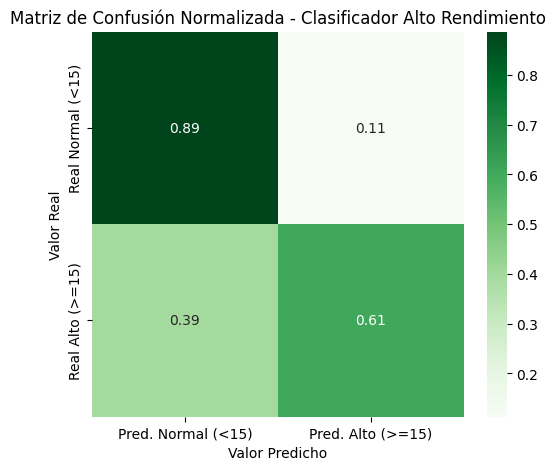

   Recall de Alto Rendimiento (Clase 1): 0.6050
   F1-Score de Alto Rendimiento: 0.6328

Resultados para el Top 70 basado en lgbm:
{'Accuracy': '0.8113', 'F1_Score_Alto': '0.6328', 'Recall_Alto': '0.6050', 'Matriz_Confusion': array([[770,  98],
       [126, 193]]), 'Matriz_Confusion_normalizada': array([[0.88709677, 0.11290323],
       [0.39498433, 0.60501567]])}

==================== Evaluación con Top 70 basado en consolidado ====================



/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


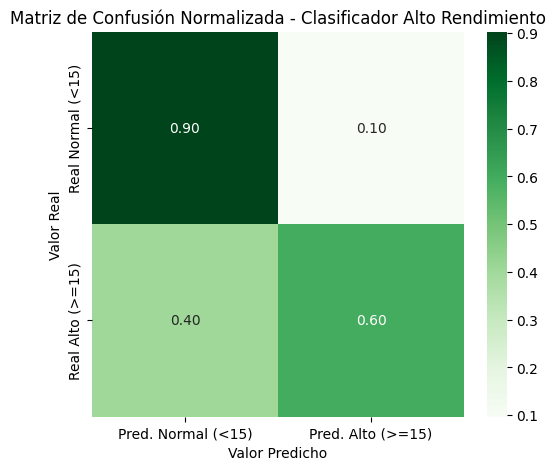

   Recall de Alto Rendimiento (Clase 1): 0.5956
   F1-Score de Alto Rendimiento: 0.6408

Resultados para el Top 70 basado en consolidado:
{'Accuracy': '0.8206', 'F1_Score_Alto': '0.6408', 'Recall_Alto': '0.5956', 'Matriz_Confusion': array([[784,  84],
       [129, 190]]), 'Matriz_Confusion_normalizada': array([[0.90322581, 0.09677419],
       [0.40438871, 0.59561129]])}


In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMClassifier
from sklearn.metrics import recall_score, f1_score, accuracy_score, precision_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.utils.class_weight import compute_sample_weight

def entrenar_clasificador_alto(df_train, features_list):
    """
    Entrena un clasificador binario (LGBM) para predecir ALTO Rendimiento (Clase 1),
    corrigiendo automáticamente features OHE y mostrando la matriz de confusión.
    
    Target: 1 si NOTA >= 15.0 (Alto); 0 si NOTA < 15.0 (No Alto).
    """

    # ==============================================================================
    # 1. AUTO-CORRECCIÓN DE FEATURES (Esto faltaba)
    # ==============================================================================
    features_para_entrenamiento = set()
    # Detectamos qué columnas categóricas tiene el DF original (ej: SEXO, TIPO_COLEGIO)
    cols_categoricas_disponibles = df_train.select_dtypes(include=['object', 'category']).columns
    
    for feat in features_list:
        if feat in df_train.columns:
            # Si la columna existe tal cual (ej: NOTA, EDAD), la guardamos
            features_para_entrenamiento.add(feat)
        else:
            # Si no existe, verificamos si es una variable hija (ej: SEXO_F) de una categórica
            for cat_col in cols_categoricas_disponibles:
                if feat.startswith(str(cat_col)):
                    features_para_entrenamiento.add(cat_col)
                    break
    
    real_features_list = list(features_para_entrenamiento)
    # ==============================================================================

    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()

    # Target Binario: 1 para Alto (>= 15.0)
    Y_train_alto = (train['NOTA'] >= UMBRAL_ALTO).astype(int)
    Y_test_alto = (test['NOTA'] >= UMBRAL_ALTO).astype(int)
    
    # Usamos la lista de features corregida
    X_train = train[real_features_list]
    X_test = test[real_features_list]
    
    # Separamos numéricas y categóricas automáticamente sobre las columnas REALES
    features_numericos = X_train.select_dtypes(include=np.number).columns.tolist()
    features_categoricos = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

    # --- 2. Pipeline y Ponderación ---
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])
    
    categoric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, features_numericos),
            ('cat', categoric_transformer, features_categoricos)
        ],
        remainder='drop'
    )

    lgbm_classifier = LGBMClassifier(
        objective='binary',
        n_estimators=500, 
        learning_rate=0.05, 
        random_state=42, 
        n_jobs=-1,
        verbose=-1
    )

    pipe_alto = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', lgbm_classifier)])
    
    # Ponderación para balancear clases (Importante para Alto Rendimiento que suele ser minoría)
    sample_weights_train = compute_sample_weight(class_weight='balanced', y=Y_train_alto)
    
    # Entrenamiento con Pesos
    pipe_alto.fit(X_train, Y_train_alto, classifier__sample_weight=sample_weights_train)
        
    # --- 3. Evaluación (en Test) ---
    Y_test_pred = pipe_alto.predict(X_test)
        
    accuracy = accuracy_score(Y_test_alto, Y_test_pred)
    # Métricas centradas en la Clase 1 (Alto Rendimiento)
    f1_c1 = f1_score(Y_test_alto, Y_test_pred, pos_label=1, average='binary', zero_division=0)
    recall_c1 = recall_score(Y_test_alto, Y_test_pred, pos_label=1, average='binary', zero_division=0)
    cm = confusion_matrix(Y_test_alto, Y_test_pred)

    # --- 4. Visualización y Retorno ---
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm / cm.sum(axis=1, keepdims=True), annot=True, fmt='.2f', cmap='Greens', 
                xticklabels=['Pred. Normal (<15)', 'Pred. Alto (>=15)'], 
                yticklabels=['Real Normal (<15)', 'Real Alto (>=15)'])
    plt.title('Matriz de Confusión Normalizada - Clasificador Alto Rendimiento')
    plt.ylabel('Valor Real')
    plt.xlabel('Valor Predicho')
    plt.show()

    # --- Retorno en Formato de Diccionario ---
    resultados = {
        'LGBM_Alto': {
            'Accuracy': f"{accuracy:.4f}",
            'F1_Score_Alto': f"{f1_c1:.4f}",
            'Recall_Alto': f"{recall_c1:.4f}",
            'Pipeline': pipe_alto,
            'Matriz_Confusion': cm,
            'Matriz_Confusion_normalizada': cm / cm.sum(axis=1, keepdims=True)
        }
    }

    print(f"   Recall de Alto Rendimiento (Clase 1): {recall_c1:.4f}")
    print(f"   F1-Score de Alto Rendimiento: {f1_c1:.4f}")

    return resultados['LGBM_Alto']

resultados_clasificador_B = {}
for k in [10, 15, 20, 30, 50, 70]:
    print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
    Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k, entrenar_clasificador_alto)
    resultados_clasificador_B[k] = Resultados

##### resultado

In [55]:
best = None
# Usaremos Recall_Weighted como el proxy principal de detección/cobertura
best_recall_weighted = -np.inf 

# Iterar Nivel 1: K (ej. 10, 15, 20, 70)
for k, resultados_por_k in resultados_clasificador_B.items():
    
    # Iterar Nivel 2: Método de Selección ('correlacion', 'mi', 'f_test', etc.)
    for metodo_seleccion, metricas in resultados_por_k.items():
        
        # 1. Obtener la métrica clave para la búsqueda (Detección)
        # Usamos Recall_Weighted como proxy de la capacidad de detección.
        metrica_a_optimizar = 'F1_Score_Alto'
        recall_score = float(metricas[metrica_a_optimizar]) 
        
        # 2. Búsqueda: Maximizar la Detección
        if recall_score > best_recall_weighted:
            best_recall_weighted = recall_score
            
            best = {
                'k': k,
                'metodo_seleccion': metodo_seleccion,
                'F1_Score_Alto': float(metricas['F1_Score_Alto']),
                'Accuracy': float(metricas['Accuracy']),
                'Recall_Alto': float(metricas['Recall_Alto']),
                'Pipeline': metricas['Pipeline'],
                'Matriz_Confusion': metricas['Matriz_Confusion'],
                'Matriz_Confusion_normalizada': metricas['Matriz_Confusion_normalizada']
            }
        # print(f"Probado K={k}, Método={metodo_seleccion}, {metrica_a_optimizar}={recall_score:.4f}")


print("\n🏆 Mejor Modelo Clasificador B (Detección de Alto Rendimiento) Encontrado:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo_seleccion']}")
print(f"Accuracy en Test: {best['Accuracy']:.4f}")
print(f"Recall de Alto en Test: {best['Recall_Alto']:.4f}")
print(f"F1-Score de Alto en Test: {best['F1_Score_Alto']:.4f}")
print(f"Matriz de Confusión del Mejor Modelo:")
print(best['Matriz_Confusion'])
print(f"Matriz de Confusión Normalizada del Mejor Modelo:")
print(best['Matriz_Confusion_normalizada'].round(4))

# Guardar el mejor pipeline clasificador para el Paso 3
best_clasificador_B = best['Pipeline']
lista_features_B = generate_list_features(best['k'])[best['metodo_seleccion']]


🏆 Mejor Modelo Clasificador B (Detección de Alto Rendimiento) Encontrado:
Top K Features: 15
Método de Selección: lgbm
Accuracy en Test: 0.8172
Recall de Alto en Test: 0.6426
F1-Score de Alto en Test: 0.6539
Matriz de Confusión del Mejor Modelo:
[[765 103]
 [114 205]]
Matriz de Confusión Normalizada del Mejor Modelo:
[[0.8813 0.1187]
 [0.3574 0.6426]]


#### Clasificador multiclase

##### busqueda


############################## Evaluación Completa para Top 116 Features ##############################


==================== Evaluación con Top 116 basado en correlacion ====================


Iniciando entrenamiento comparativo MULTICLASE...


/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


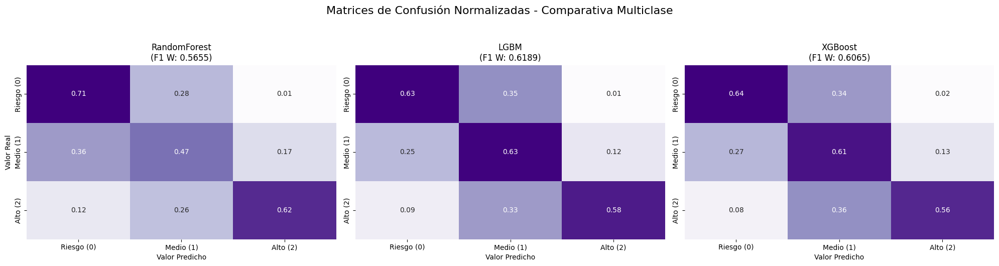


Resultados para el Top 116 basado en correlacion:
{'RandomForest': {'Accuracy': '0.5644', 'F1_Weighted': '0.5655', 'Recall_Riesgo(0)': '0.7111', 'Recall_Medio(1)': '0.4699', 'Recall_Alto(2)': '0.6176', 'Pipeline': Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['QUARTIL_75_CLUSTER_DIFICULTAD_NG',
                                                   'PRCTJE_S_CLUSTER_DIFICULTAD_NG_P',
                                                   'SEM_CURSADOS',
                                                   'N_CLUSTER_7',
                                           

/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


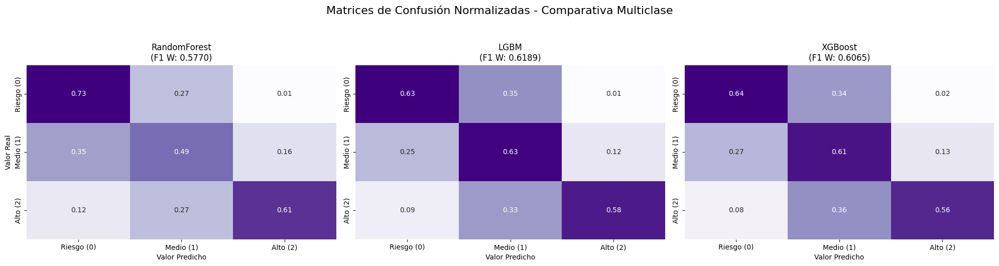


Resultados para el Top 116 basado en mi:
{'RandomForest': {'Accuracy': '0.5754', 'F1_Weighted': '0.5770', 'Recall_Riesgo(0)': '0.7259', 'Recall_Medio(1)': '0.4883', 'Recall_Alto(2)': '0.6113', 'Pipeline': Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['QUARTIL_75_CLUSTER_DIFICULTAD_NG',
                                                   'PRCTJE_S_CLUSTER_DIFICULTAD_NG_P',
                                                   'SEM_CURSADOS',
                                                   'N_CLUSTER_7',
                                                   '

/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


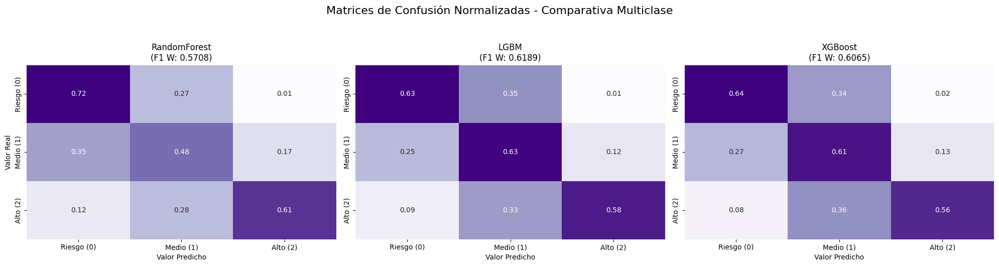


Resultados para el Top 116 basado en f_test:
{'RandomForest': {'Accuracy': '0.5695', 'F1_Weighted': '0.5708', 'Recall_Riesgo(0)': '0.7185', 'Recall_Medio(1)': '0.4833', 'Recall_Alto(2)': '0.6050', 'Pipeline': Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['QUARTIL_75_CLUSTER_DIFICULTAD_NG',
                                                   'PRCTJE_S_CLUSTER_DIFICULTAD_NG_P',
                                                   'SEM_CURSADOS',
                                                   'N_CLUSTER_7',
                                                

/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


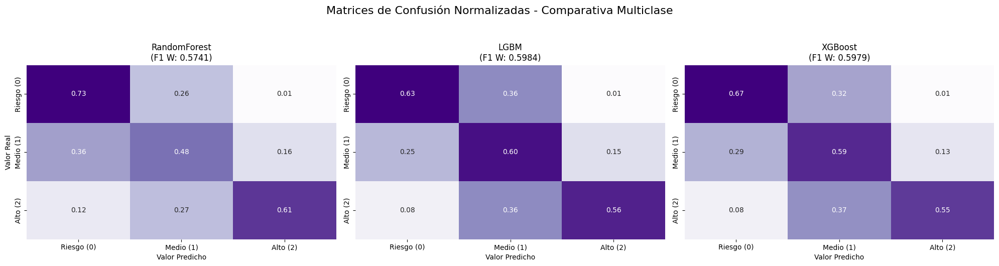


Resultados para el Top 116 basado en lgbm:
{'RandomForest': {'Accuracy': '0.5729', 'F1_Weighted': '0.5741', 'Recall_Riesgo(0)': '0.7296', 'Recall_Medio(1)': '0.4833', 'Recall_Alto(2)': '0.6082', 'Pipeline': Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['QUARTIL_75_CLUSTER_DIFICULTAD_NG',
                                                   'PRCTJE_S_CLUSTER_DIFICULTAD_NG_P',
                                                   'N_CLUSTER_7',
                                                   'QUARTIL_25_CLUSTER_DIFICULTAD_PC',
                              

/Users/stewart/2025-2/ML/ML_P3/venv/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


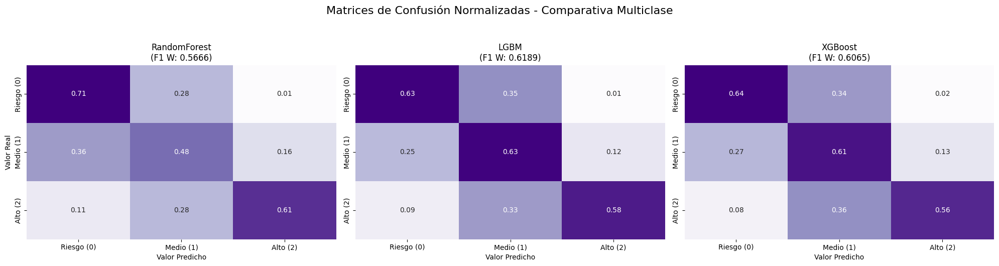


Resultados para el Top 116 basado en consolidado:
{'RandomForest': {'Accuracy': '0.5653', 'F1_Weighted': '0.5666', 'Recall_Riesgo(0)': '0.7111', 'Recall_Medio(1)': '0.4783', 'Recall_Alto(2)': '0.6050', 'Pipeline': Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['QUARTIL_75_CLUSTER_DIFICULTAD_NG',
                                                   'PRCTJE_S_CLUSTER_DIFICULTAD_NG_P',
                                                   'SEM_CURSADOS',
                                                   'N_CLUSTER_7',
                                           

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Importar Clasificadores
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier 

from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, precision_score, recall_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer 
from sklearn.utils.class_weight import compute_sample_weight

def entrenar_clasificador_multiclase_COMPARATIVO(df_train, features_list):
    """
    Entrena y compara RF, LGBM y XGB para clasificación MULTICLASE (0=Riesgo, 1=Medio, 2=Alto).
    Incluye auto-corrección de features y visualización comparativa.
    """
    
    # ==============================================================================
    # 1. AUTO-CORRECCIÓN DE FEATURES (Sanitización)
    # ==============================================================================
    features_para_entrenamiento = set()
    cols_categoricas_disponibles = df_train.select_dtypes(include=['object', 'category']).columns
    
    for feat in features_list:
        if feat in df_train.columns:
            features_para_entrenamiento.add(feat)
        else:
            # Si entra 'SEXO_F', buscamos 'SEXO'
            for cat_col in cols_categoricas_disponibles:
                if feat.startswith(str(cat_col)):
                    features_para_entrenamiento.add(cat_col)
                    break
    
    real_features_list = list(features_para_entrenamiento)
    # ==============================================================================
    
    # --- 2. Preparación y División de Datos ---
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()

    # --- 3. Creación del Target Multiclase ---
    bins = [0.0, 10.99, 14.99, 20.01] 
    labels = [0, 1, 2] # 0=Riesgo, 1=Medio, 2=Alto
    
    Y_train_multi = pd.cut(train['NOTA'], bins=bins, labels=labels, right=True, include_lowest=True).astype(int)
    Y_test_multi = pd.cut(test['NOTA'], bins=bins, labels=labels, right=True, include_lowest=True).astype(int)
    
    # print("\n--- Distribución del Target Multiclase ---")
    # print(f"Train: {Y_train_multi.value_counts(normalize=True).sort_index().to_dict()}")

    # Asignación de Features con la lista corregida
    X_train = train[real_features_list]
    X_test = test[real_features_list]
    
    # Separación automática de tipos
    features_numericos = X_train.select_dtypes(include=np.number).columns.tolist()
    features_categoricos = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
    
    # --- 4. Preprocesador Híbrido ---
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])
    
    categoric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, features_numericos),
            ('cat', categoric_transformer, features_categoricos)
        ],
        remainder='drop'
    )

    # --- 5. Definición de Modelos ---
    modelos = {
        'RandomForest': RandomForestClassifier(
            n_estimators=200, max_depth=10, min_samples_leaf=5,
            random_state=42, n_jobs=-1, class_weight='balanced' # RF soporta esto nativo
        ),
        'LGBM': LGBMClassifier(
            objective='multiclass', num_class=3, n_estimators=500,
            learning_rate=0.05, random_state=42, n_jobs=-1, verbose=-1
        ),
        'XGBoost': XGBClassifier(
            objective='multi:softmax', num_class=3, n_estimators=500,
            learning_rate=0.05, random_state=42, n_jobs=-1,
            enable_categorical=False # El pipeline hace el OHE
        )
    }

    # --- 6. Cálculo de Pesos (Para LGBM y XGBoost) ---
    sample_weights_train = compute_sample_weight(class_weight='balanced', y=Y_train_multi)
    
    resultados = {}
    matrices_confusion = {}
    
    print(f"\nIniciando entrenamiento comparativo MULTICLASE...")

    for nombre, modelo in modelos.items():
        # print(f"-> Entrenando {nombre}...")
        
        clf_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', modelo)])
        
        # --- APLICACIÓN DE PESOS ---
        # RandomForest ya tiene 'class_weight' en el init, pero no hace daño pasarlo en fit para los otros
        # Para XGB y LGBM es obligatorio pasarlo aquí.
        if nombre == 'RandomForest':
             clf_pipeline.fit(X_train, Y_train_multi)
        else:
             clf_pipeline.fit(X_train, Y_train_multi, classifier__sample_weight=sample_weights_train)
            
        # --- Evaluación ---
        Y_test_pred = clf_pipeline.predict(X_test)
        
        # Métricas
        acc = accuracy_score(Y_test_multi, Y_test_pred)
        f1_w = f1_score(Y_test_multi, Y_test_pred, average='weighted', zero_division=0)
        recalls = recall_score(Y_test_multi, Y_test_pred, average=None, zero_division=0) # [R_0, R_1, R_2]

        cm = confusion_matrix(Y_test_multi, Y_test_pred)
        matrices_confusion[nombre] = cm

        resultados[nombre] = {
            'Accuracy': f"{acc:.4f}",
            'F1_Weighted': f"{f1_w:.4f}",
            'Recall_Riesgo(0)': f"{recalls[0]:.4f}",
            'Recall_Medio(1)': f"{recalls[1]:.4f}",
            'Recall_Alto(2)': f"{recalls[2]:.4f}",
            'Pipeline': clf_pipeline,
            'Matriz_Confusion': cm,
            'Matriz_Confusion_norm': cm / cm.sum(axis=1, keepdims=True)
        }
        
    # --- 7. Visualización Comparativa ---
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    fig.suptitle('Matrices de Confusión Normalizadas - Comparativa Multiclase', fontsize=16, y=1.05)
    
    labels_humanos = ['Riesgo (0)', 'Medio (1)', 'Alto (2)']
    model_names = list(modelos.keys())

    for i, ax in enumerate(axes):
        m_name = model_names[i]
        cm_norm = resultados[m_name]['Matriz_Confusion_norm']
        
        sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Purples', 
                    xticklabels=labels_humanos, yticklabels=labels_humanos, ax=ax, cbar=False)
        ax.set_title(f"{m_name}\n(F1 W: {resultados[m_name]['F1_Weighted']})")
        ax.set_ylabel('Valor Real' if i==0 else '')
        ax.set_xlabel('Valor Predicho')

    plt.tight_layout()
    plt.show()

    # --- 8. Tabla Resumen ---
    # df_res = pd.DataFrame.from_dict(resultados, orient='index').drop(columns=['Pipeline', 'Matriz_Confusion', 'Matriz_Confusion_norm'])
    # print("\nResultados Comparativos:")
    # display(df_res)

    return resultados

resultados_finales_hibridos = {}
# for k in [10, 20, 30, 70, 127]:
for k in [len(df_train.columns)-3]:
    print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
    Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k, entrenar_clasificador_multiclase_COMPARATIVO)
    resultados_finales_hibridos[k] = Resultados

##### resultado

In [58]:
best = None
best_f1_score = -np.inf

# Iterar Nivel 1: K (10, 20, 30, 70)
for k, resultados_por_k in resultados_finales_hibridos.items():
    
    # Iterar Nivel 2: Método de Selección (ej. 'Rank_Ponderado', 'Rank_MI')
    for metodo_seleccion, dict_de_modelos in resultados_por_k.items():
        
        # Iterar Nivel 3: Nombre del Modelo (ej. 'LGBMClassifier', 'RandomForestClassifier')
        for nombre_modelo, metricas in dict_de_modelos.items():
            
            metrica_a_optimizar = 'F1_Score_W'
            # 'metricas' es el diccionario final: {'Accuracy': ..., 'F1_Score_W': ..., 'Pipeline': ...}
            f1_score = float(metricas[metrica_a_optimizar])
            
            if f1_score > best_f1_score:
                best_f1_score = f1_score
                best = {
                    'k': k,
                    'metodo_seleccion': metodo_seleccion,
                    'nombre_modelo': nombre_modelo,
                    'F1_Test': float(metricas['F1_Score_W']),
                    'Accuracy': float(metricas['Accuracy']),
                    'Precision_Weighted': float(metricas['Precision_W']),
                    'Recall_Weighted': float(metricas['Recall_W']),
                    'Pipeline': metricas['Pipeline'],
                    'Matriz_Confusion': metricas['Matriz_Confusion'],
                    'Matriz_Confusion_normalizada': metricas['Matriz_Confusion_normalizada']
                }
            print(f"Probado K={k}, Método={metodo_seleccion}, Modelo={nombre_modelo}, {metrica_a_optimizar}={f1_score:.4f}")


print("\n🏆 Mejor Modelo Clasificador Encontrado en Todas las Evaluaciones:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo_seleccion']}")
print(f"Modelo: {best['nombre_modelo']}")
print(f"F1-Score (Weighted) en Test: {best['F1_Test']:.4f}")
print(f"Accuracy en Test: {best['Accuracy']:.4f}")
print(f"Precision (Weighted) en Test: {best['Precision_Weighted']:.4f}")
print(f"Recall (Weighted) en Test: {best['Recall_Weighted']:.4f}")
print(f"Matriz de Confusión del Mejor Modelo:")
print(best['Matriz_Confusion'])
print(f"Matriz de Confusión Normalizada del Mejor Modelo:")
print(best['Matriz_Confusion_normalizada'].round(4))

# Guardar el mejor pipeline clasificador para el Paso 3
best_clasificador = best['Pipeline']

KeyError: 'F1_Score_W'


🏆 Mejor Modelo Clasificador Encontrado en Todas las Evaluaciones:
Top K Features: 15
Método de Selección: lgbm
Modelo: LGBMClassifier
F1-Score (Weighted) en Test: 0.6162
Accuracy en Test: 0.6200
Precision (Weighted) en Test: 0.6230
Recall (Weighted) en Test: 0.6200
Matriz de Confusión del Mejor Modelo:
[[146 151   3]
 [108 479  75]
 [ 13 144 181]]
Matriz de Confusión Normalizada del Mejor Modelo:
[[0.4867 0.5033 0.01  ]
 [0.1631 0.7236 0.1133]
 [0.0385 0.426  0.5355]]

### Regresores Condicionales

In [ ]:
import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 
from sklearn.utils.class_weight import compute_sample_weight # Necesario para la ponderación

# --- FUNCIÓN AUXILIAR: GENERAR PESOS DE FRONTERA ---
def generar_pesos_frontera(Y_values, umbral=11.5, factor_peso=4.0):
    """
    Asigna un peso alto a las notas justo alrededor del umbral de Riesgo/Aprobación 
    para forzar la precisión del regresor en la frontera.
    """
    # Crear un array de peso base
    weights = np.ones(len(Y_values))
    
    # Definir la zona de la frontera crítica (ej., NOTA entre 10.0 y 12.5)
    lower_bound = umbral - 1.5 
    upper_bound = umbral + 1.0
    
    # Condición: Las filas caen en la zona crítica (cerca del umbral 11.5)
    condicion_frontera = (Y_values >= lower_bound) & (Y_values <= upper_bound)
    
    # Aumentar el peso para las filas en la frontera crítica
    weights[condicion_frontera] = factor_peso
    
    return weights


def entrenar_regresores_condicionales_con_metricas(df_train, features_top_15_consenso):
    """
    Paso 2 del Modelo Híbrido. Entrena TRES regresores LGBM "expertos", 
    aplicando Ponderación de Frontera (Sample Weighting) al Regresor Medio.
    """

    base_params = {
        'objective': 'quantile', 'alpha': 0.5, 'n_estimators': 1200, 'learning_rate': 0.015,
        'max_depth': 6, 'num_leaves': 20, 'min_data_in_leaf': 40, 'feature_fraction': 0.7,
        'bagging_fraction': 0.8, 'bagging_freq': 2, 'reg_alpha': 1.0, 'reg_lambda': 2.0,
        'random_state': 42, 'n_jobs': -1
    }
    
    print("Iniciando Paso 2: Entrenamiento de Regresores Condicionales (con Ponderación de Frontera)...")

    # 1. Preparación y División de Datos Temporal
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
    # 2. Creación de los 6 Subconjuntos de Datos
    df_riesgo_train = train[train['NOTA'] < UMBRAL_RIESGO].copy()
    df_medio_train = train[(train['NOTA'] >= UMBRAL_RIESGO) & (train['NOTA'] < UMBRAL_ALTO)].copy()
    df_alto_train = train[train['NOTA'] >= UMBRAL_ALTO].copy()
    
    df_riesgo_test = test[test['NOTA'] < UMBRAL_RIESGO].copy()
    df_medio_test = test[(test['NOTA'] >= UMBRAL_RIESGO) & (test['NOTA'] < UMBRAL_ALTO)].copy()
    df_alto_test = test[test['NOTA'] >= UMBRAL_ALTO].copy()

    # 3. Definición del Preprocesador
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])
    preprocessor = ColumnTransformer(
        transformers=[('num', numeric_transformer, features_top_15_consenso)],
        remainder='drop'
    )
    
    modelos_regresores = {}
    sum_weighted_r2 = 0
    total_registros_test = 0
    
    grupos = [
        (0, df_riesgo_train, df_riesgo_test, "Riesgo"),
        (1, df_medio_train, df_medio_test, "Medio"),
        (2, df_alto_train, df_alto_test, "Alto")
    ]
    
    print("\n--- Entrenamiento y Evaluación de Regresores Expertos ---")
    
    for key, df_train_grupo, df_test_grupo, nombre in grupos:
        
        X_train_g = df_train_grupo[features_top_15_consenso]
        Y_train_g = df_train_grupo['NOTA']
        pipe = Pipeline(steps=[('preprocessor', preprocessor), 
                              ('regressor', LGBMRegressor(**base_params))])
        
        print(f"\n-> Entrenando Regresor de {nombre} (Grupo {key})...")
        
        # --- APLICACIÓN DE PESOS SÓLO AL REGRESOR MEDIO (KEY 1) ---
        if key == 1:
            # Ponderar la clase media para ser preciso en la frontera de riesgo (11.5)
            weights_medio = generar_pesos_frontera(Y_train_g, umbral=UMBRAL_RIESGO, factor_peso=4.0)
            pipe.fit(X_train_g, Y_train_g, regressor__sample_weight=weights_medio)
            print("   (Aplicados pesos 4x a la frontera crítica 11.5)")
        else:
            pipe.fit(X_train_g, Y_train_g)
        # -------------------------------------------------------------

        # 5. Evaluación en TEST Set
        N_test = len(df_test_grupo) 
        metricas_test = {}

        if N_test > 0:
            X_test_g = df_test_grupo[features_top_15_consenso]
            Y_test_g = df_test_grupo['NOTA']
            
            Y_pred_g = pipe.predict(X_test_g)
            
            r2_test = r2_score(Y_test_g, Y_pred_g)
            rmse_test = np.sqrt(mean_squared_error(Y_test_g, Y_pred_g))
            
            sum_weighted_r2 += r2_test * N_test
            total_registros_test += N_test

            metricas_test = {
                'RMSE_Test': f'{rmse_test:.4f}',
                'R2_Test': f'{r2_test:.4f}',
                'Registros_Test': N_test
            }
            print(f"   Métricas Test: R2={r2_test:.4f}, RMSE={rmse_test:.4f}")
            
        else:
            print(f"   Advertencia: No hay datos de prueba para el grupo {nombre}.")
            metricas_test = {'RMSE_Test': np.nan, 'R2_Test': np.nan, 'Registros_Test': 0}

        # 6. Guardar el modelo entrenado y sus métricas
        modelos_regresores[key] = {
            'modelo': pipe,
            'metricas': metricas_test
        }

    # 7. Cálculo del R2 Promedio Ponderado
    R2_Avg_Weighted = sum_weighted_r2 / total_registros_test if total_registros_test > 0 else np.nan

    # Guardar el R2 Ponderado final en el diccionario
    modelos_regresores['R2_Weighted_Average_Final'] = f'{R2_Avg_Weighted:.4f}'


    print("\n✅ Paso 2 completado. Regresores expertos y sus métricas están listas.")
    
    return modelos_regresores


resultados_finales_regresores = {}
for k in [10, 15, 20, 30, 50, 70, len(df_train.columns)-3]:
    print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
    Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k, entrenar_regresores_condicionales_con_metricas)
    resultados_finales_regresores[k] = Resultados


In [ ]:
best = None
best_f1_score = -np.inf


for k, resultados_por_k in resultados_finales_regresores.items():

    for metodo_seleccion, dict_de_modelos in resultados_por_k.items():

        metrica_a_optimizar = 'R2_Weighted_Average_Final'
        r2_weighted_avg = float(dict_de_modelos[metrica_a_optimizar])
        print(f"\nEvaluando K={k}, Método={metodo_seleccion} tiene R2 Promedio Ponderado = {r2_weighted_avg:.4f}\n")
        for key, final in dict_de_modelos.items():
            print(f"  -> {key}: {final['metricas'] if key in [0,1,2] else final}")

        if r2_weighted_avg > best_f1_score:
            best_f1_score = r2_weighted_avg
            best = {
                'k': k,
                'metodo_seleccion': metodo_seleccion,
                'R2_Weighted_Avg': r2_weighted_avg,
                'metricas_regresores': {
                    key: final['metricas'] for key, final in dict_de_modelos.items() if key in [0,1,2]
                },
                'Modelos_Regresores': dict_de_modelos
            }

        print(f"=======================================================")


print("\n🏆 Mejor Conjunto de Regresores Expertos Encontrado:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo_seleccion']}")
print(f"R2 Promedio Ponderado en Test: {best['R2_Weighted_Avg']:.4f}")


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 

def entrenar_regresores_condicionales(df_train, features_top_15_consenso):
    """
    Paso 2 del Modelo Híbrido. Entrena tres regresores LGBM "expertos", 
    uno para cada rango de nota (Riesgo, Medio, Alto).
    
    Args:
        df_train (pd.DataFrame): DataFrame de entrenamiento (con 'NOTA').
        features_top_15_consenso (list): Lista de features a usar.

    Returns:
        dict: Un diccionario con los 3 pipelines de regresión entrenados.
    """
    
    print("Iniciando Paso 2: Entrenamiento de Regresores Condicionales...")
    
    
    # 1. Preparación y División de Datos Temporal
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    
    # 2. Creación de los 3 Subconjuntos de Datos
    df_riesgo = train[train['NOTA'] < UMBRAL_RIESGO].copy()
    df_medio = train[(train['NOTA'] >= UMBRAL_RIESGO) & (train['NOTA'] < UMBRAL_ALTO)].copy()
    df_alto = train[train['NOTA'] >= UMBRAL_ALTO].copy()
    
    print(f"   Subconjunto 'Riesgo' (<{UMBRAL_RIESGO}): {len(df_riesgo)} registros.")
    print(f"   Subconjunto 'Medio'   (Entre {UMBRAL_RIESGO} y {UMBRAL_ALTO}): {len(df_medio)} registros.")
    print(f"   Subconjunto 'Alto'    (>={UMBRAL_ALTO}): {len(df_alto)} registros.")
    
    # 3. Definición del Preprocesador (Debe ser el mismo para todos)
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[('num', numeric_transformer, features_top_15_consenso)],
        remainder='drop'
    )

    # 4. Definición del Modelo Regresor Base (LGBM)
    # Usamos los parámetros base que dieron el R2=0.3344
    # base_params = {
    #     'n_estimators': 500,
    #     'learning_rate': 0.05,
    #     'random_state': 42,
    #     'n_jobs': -1
    # }

    base_params = {
    'objective': 'quantile',
    'alpha': 0.5,
    'n_estimators': 1200,
    'learning_rate': 0.015,
    'max_depth': 6,
    'num_leaves': 20,
    'min_data_in_leaf': 40,
    'feature_fraction': 0.7,
    'bagging_fraction': 0.8,
    'bagging_freq': 2,
    'reg_alpha': 1.0,
    'reg_lambda': 2.0,
    'random_state': 42,
    'n_jobs': -1
}

    # 5. Entrenamiento de los 3 Pipelines
    
    # --- Modelo de Riesgo (Grupo 0) ---
    pipe_riesgo = Pipeline(steps=[('preprocessor', preprocessor), 
                                  ('regressor', LGBMRegressor(**base_params))])
    X_train_riesgo = df_riesgo[features_top_15_consenso]
    Y_train_riesgo = df_riesgo['NOTA']
    print("\n-> Entrenando Regresor de Riesgo...")
    pipe_riesgo.fit(X_train_riesgo, Y_train_riesgo)
    
    # --- Modelo Medio (Grupo 1) ---
    pipe_medio = Pipeline(steps=[('preprocessor', preprocessor), 
                                 ('regressor', LGBMRegressor(**base_params))])
    X_train_medio = df_medio[features_top_15_consenso]
    Y_train_medio = df_medio['NOTA']
    print("-> Entrenando Regresor Medio...")
    pipe_medio.fit(X_train_medio, Y_train_medio)
    
    # --- Modelo Alto (Grupo 2) ---
    pipe_alto = Pipeline(steps=[('preprocessor', preprocessor), 
                                ('regressor', LGBMRegressor(**base_params))])
    X_train_alto = df_alto[features_top_15_consenso]
    Y_train_alto = df_alto['NOTA']
    print("-> Entrenando Regresor Alto...")
    pipe_alto.fit(X_train_alto, Y_train_alto)
    
    print("\n✅ Paso 2 completado. Regresores expertos listos.")
    
    # Devolvemos los modelos entrenados en un diccionario
    modelos_regresores = {
        0: pipe_riesgo, # Coincide con la Clase 0 (Riesgo)
        1: pipe_medio,  # Coincide con la Clase 1 (Medio)
        2: pipe_alto    # Coincide con la Clase 2 (Alto)
    }
    
    return modelos_regresores

listas_top_k = generate_list_features(20)
lista_top_k = listas_top_k['lgbm']
modelos_regresores = entrenar_regresores_condicionales(df_train, lista_top_k)

# resultados_finales_hibridos = {}
# for k in [10, 20, 30,  70]:
#     print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
#     Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k, modelos_regresores)
#     resultados_finales_hibridos[k] = Resultados


### Modelo Hibrido + clasificadores binarios

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score

def evaluar_modelo_hibrido_FINAL_CLEAN(df_train, clf_riesgo, clf_alto, regresores_expertos):
    """
    Paso 3: Evalúa el modelo híbrido BINARIO PONDERADO.
    Utiliza las probabilidades de los dos clasificadores (Riesgo y Alto) 
    para ponderar las predicciones de los 3 regresores expertos.
    """
    
    # --- 0. Métrica de Tolerancia ---
    def within_tolerance(y_true, y_pred, tol=2):
        diff = np.abs(y_true - y_pred)
        return np.mean(diff <= tol)

    print("Iniciando Paso 3: Evaluación del Modelo Híbrido PONDERADO (Binario)...")

    # --- 1. Preparación del Conjunto de Prueba (Test Set) ---
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
    # X_test es el DataFrame COMPLETO. El ColumnTransformer de cada pipeline selecciona las features.
    X_test = test.drop(columns=['NOTA']) 
    Y_test_reales = test['NOTA'].values 

    # --- 2. Obtener Probabilidades de los Clasificadores A y B (¡Aquí está la corrección!) ---

    # P(Riesgo): Probabilidad de NOTA < 11.0 (Clase 1 del Clasificador A)
    P_riesgo = clf_riesgo.predict_proba(X_test)[:, 1] 
    
    # P(Alto): Probabilidad de NOTA >= 15.0 (Clase 1 del Clasificador B)
    P_alto = clf_alto.predict_proba(X_test)[:, 1] 
    
    # P(Medio): Se calcula por complemento.
    P_medio = 1 - (P_riesgo + P_alto)
    
    # Clip para asegurar que P_medio no sea negativo debido a la sobrestimación de los binarios
    P_medio = np.clip(P_medio, 0, 1) 

    # Normalización Final (Asegurar que P_riesgo + P_medio + P_alto = 1)
    P_suma_total = P_riesgo + P_medio + P_alto
    P_riesgo /= P_suma_total
    P_medio /= P_suma_total
    P_alto /= P_suma_total

    # --- 3. Obtener Predicciones de los 3 Regresores Expertos ---
    
    # Los pipelines de los regresores también seleccionan sus features internamente.
    Pred_riesgo = regresores_expertos[0].predict(X_test)
    Pred_medio = regresores_expertos[1].predict(X_test)
    Pred_alto = regresores_expertos[2].predict(X_test)

    # --- 4. Cálculo de la Nota Final Ponderada (Soft Voting) ---
    Y_pred_final = (P_riesgo * Pred_riesgo) + \
                   (P_medio * Pred_medio) + \
                   (P_alto * Pred_alto)
        


    # Evaluación y Resultados
    rmse_test = np.sqrt(mean_squared_error(Y_test_reales, Y_pred_final))
    r2_test = r2_score(Y_test_reales, Y_pred_final)
    within_2 = within_tolerance(Y_test_reales, Y_pred_final, tol=2)
    # Evaluación en Train Set para comparación
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    X_train = train.drop(columns=['NOTA'])
    Y_train_reales = train['NOTA'].values
    P_riesgo_train = clf_riesgo.predict_proba(X_train)[:, 1]
    P_alto_train = clf_alto.predict_proba(X_train)[:, 1]
    P_medio_train = 1 - (P_riesgo_train + P_alto_train)
    P_medio_train = np.clip(P_medio_train, 0, 1)
    P_suma_total_train = P_riesgo_train + P_medio_train + P_alto_train
    P_riesgo_train /= P_suma_total_train
    P_medio_train /= P_suma_total_train
    P_alto_train /= P_suma_total_train
    Pred_riesgo_train = regresores_expertos[0].predict(X_train)
    Pred_medio_train = regresores_expertos[1].predict(X_train)
    Pred_alto_train = regresores_expertos[2].predict(X_train)
    Y_pred_final_train = (P_riesgo_train * Pred_riesgo_train) + \
                         (P_medio_train * Pred_medio_train) + \
                         (P_alto_train * Pred_alto_train)
    rmse_train = np.sqrt(mean_squared_error(Y_train_reales, Y_pred_final_train))
    r2_train = r2_score(Y_train_reales, Y_pred_final_train)
    
    resultados = {
        'Modelo': 'Híbrido (Clf + Reg)',
        'RMSE_Train': f'{rmse_train:.4f}',
        'RMSE_Test': f'{rmse_test:.4f}',
        'R2_Train': f'{r2_train:.4f}',
        'R2_Test': f'{r2_test:.4f}',
        'Pct_±2': f'{within_2*100:.2f}%'
    }

    print("\n✅ Evaluación Híbrida Completa (Resultados en Test Set):")
    print(resultados)

    # --- 4. VISUALIZACIONES FINALES ---
    
    df_plot = pd.DataFrame({'Nota Real': Y_test_reales, 
                            'Nota Predicha': Y_pred_final,
                            'Residual': Y_test_reales - Y_pred_final})
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    fig.suptitle('Diagnóstico del Modelo Híbrido Final', fontsize=16, y=1.03)

    # --- GRÁFICO 1: DISTRIBUCIÓN DE DENSIDAD (KDE) ---
    sns.kdeplot(df_plot['Nota Real'], label='Notas Reales', color='blue', fill=True, alpha=0.5, ax=axes[0])
    sns.kdeplot(df_plot['Nota Predicha'], label='Notas Predichas (Híbrido)', color='orange', fill=True, alpha=0.5, ax=axes[0])
    axes[0].set_title('1. Distribución de Densidad (KDE)', fontsize=13)
    axes[0].set_xlabel('Nota')
    axes[0].set_ylabel('Densidad')
    axes[0].set_xlim(0, 20)
    axes[0].legend()

    # --- GRÁFICO 2: DISTRIBUCIÓN DE FRECUENCIA (HISTOGRAMA) ---
    sns.histplot(df_plot['Nota Real'], bins=100, label='Notas Reales', color='blue', alpha=0.6, ax=axes[1])
    sns.histplot(df_plot['Nota Predicha'], bins=100, label='Notas Predichas', color='orange', alpha=0.6, ax=axes[1])
    axes[1].set_title('2. Distribución de Frecuencia (Histograma)', fontsize=13)
    axes[1].set_xlabel('Nota')
    axes[1].set_ylabel('Cantidad de Registros')
    axes[1].set_xlim(0, 20)
    axes[1].legend()

    # --- GRÁFICO 3: DISTRIBUCIÓN DEL ERROR RESIDUAL ---
    sns.histplot(df_plot['Residual'], bins=100, kde=True, color='red', ax=axes[2])
    axes[2].axvline(0, color='black', linestyle='--')
    axes[2].set_title('3. Distribución del Error Residual', fontsize=13)
    axes[2].set_xlabel('Error (Nota Real - Nota Predicha)')
    axes[2].set_ylabel('Cantidad de Registros')

    
    return resultados


resultados_hibrido_final = evaluar_modelo_hibrido_FINAL_CLEAN(df_train, best_clasificador_A, best_clasificador_B, modelos_regresores)

### modelo hibrido

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score

# Nota: Esta función requiere que las librerías (sklearn, lightgbm, etc.) 
# de los modelos entrenados (pasos 1 y 2) estén importadas en el notebook.

def evaluar_modelo_hibrido(df_train, features_top_15_consenso, best_clasificador, regresores_condicionales):
    """
    Paso 3: Evalúa el modelo híbrido completo.
    
    1. Usa el Clasificador (Paso 1) para predecir el rango de nota.
    2. Usa el Regresor Experto (Paso 2) correspondiente a ese rango.
    3. Calcula las métricas finales de regresión (RMSE, R²) y genera los gráficos.
    
    Args:
        df_train (pd.DataFrame): El DataFrame completo (usado para la división train/test).
        features_top_15_consenso (list): La lista de strings de las features a usar.
        best_clasificador (Pipeline): El pipeline del clasificador (LGBMClassifier) entrenado en el Paso 1.
        regresores_condicionales (dict): El diccionario {0: pipeline, 1: pipeline, 2: pipeline} 
                                         con los regresores expertos entrenados en el Paso 2.

    Returns:
        dict: Un diccionario con las métricas finales del modelo híbrido.
    """
    
    # --- 0. Métrica de Tolerancia ---
    def within_tolerance(y_true, y_pred, tol=2):
        """Calcula el porcentaje de predicciones dentro de ±tol."""
        # Asegurarse de que y_true sea un array de numpy para la resta
        diff = np.abs(y_true - y_pred)
        return np.mean(diff <= tol)

    print("Iniciando Paso 3: Evaluación del Modelo Híbrido Completo...")

    # --- 1. Preparación del Conjunto de Prueba (Test Set) ---
    # Usamos el mismo corte temporal que en los pasos anteriores
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
    # Separar X e Y del Test Set
    X_test = test
    X_train = train
    Y_test_reales = test['NOTA'].values # Notas Reales (como array numpy)
    Y_train_reales = train['NOTA'].values

    # --- 2. Predicción Híbrida ---
    
    # 2a. (Predicción Paso 1): Predecir la CLASE (0, 1, o 2)
    print(f"   Ejecutando Clasificador (Paso 1) en {len(X_test)} registros...")
    Y_pred_clases = best_clasificador.predict(X_test)
    Y_train_pred_clases = best_clasificador.predict(X_train)

    # Verificación rápida de distribución de clases predichas
    unique, counts = np.unique(Y_pred_clases, return_counts=True)
    class_distribution = dict(zip(unique, counts))
    print(f"   Distribución de Clases Predichas: {class_distribution}")

    # 2b. (Predicción Paso 2): Predecir la NOTA usando el regresor experto
    print("   Enrutando predicciones a Regresores Expertos (Paso 2)...")
    
    # Inicializar un array vacío para las predicciones finales
    Y_pred_final = np.zeros(len(Y_test_reales))
    Y_pred_train_final = np.zeros(len(Y_train_reales))
    
    # Iterar sobre las 3 clases posibles (Riesgo, Medio, Alto)
    for clase_actual in [0, 1, 2]:
        
        # Encontrar los índices (filas) que el clasificador asignó a esta clase
        indices = np.where(Y_pred_clases == clase_actual)[0]
        indices_train = np.where(Y_train_pred_clases == clase_actual)[0]

        if len(indices_train) > 0:
            # Seleccionar el subconjunto de X_train para esta clase
            X_train_subset = X_train.iloc[indices_train]
            
            # Seleccionar el modelo regresor "experto" (Pipeline)
            modelo_experto = regresores_condicionales[clase_actual] 
            
            # Predecir la NOTA solo para este subconjunto
            preds_train_subset = modelo_experto.predict(X_train_subset)
            
            # Asignar las predicciones de vuelta al array final
            Y_pred_train_final[indices_train] = preds_train_subset
        
        if len(indices) > 0:
            # Seleccionar el subconjunto de X_test para esta clase
            X_test_subset = X_test.iloc[indices]
            
            # Seleccionar el modelo regresor "experto" (Pipeline)
            modelo_experto = regresores_condicionales[clase_actual] 
            
            # Predecir la NOTA solo para este subconjunto
            preds_subset = modelo_experto.predict(X_test_subset)
            
            # Asignar las predicciones de vuelta al array final
            Y_pred_final[indices] = preds_subset

    # --- prediccion para el train set
    
    # Comparar las Notas Reales (Y_test_reales) con las Notas Híbridas (Y_pred_final)
    rmse_test = np.sqrt(mean_squared_error(Y_test_reales, Y_pred_final))
    rmse_train = np.sqrt(mean_squared_error(Y_train_reales, Y_pred_train_final))
    r2_test = r2_score(Y_test_reales, Y_pred_final)
    r2_train = r2_score(Y_train_reales, Y_pred_train_final)
    within_2 = within_tolerance(Y_test_reales, Y_pred_final, tol=2)
    
    resultados = {
        'Modelo': 'Híbrido (Clf + Reg)',
        'RMSE_Train': f'{rmse_train:.4f}',
        'RMSE_Test': f'{rmse_test:.4f}',
        'R2_Train': f'{r2_train:.4f}',
        'R2_Test': f'{r2_test:.4f}',
        'Pct_±2': f'{within_2*100:.2f}%'
    }

    print("\n✅ Evaluación Híbrida Completa (Resultados en Test Set):")
    print(resultados)

    # --- 4. VISUALIZACIONES FINALES ---
    
    df_plot = pd.DataFrame({'Nota Real': Y_test_reales, 
                            'Nota Predicha': Y_pred_final,
                            'Residual': Y_test_reales - Y_pred_final})
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    fig.suptitle('Diagnóstico del Modelo Híbrido Final', fontsize=16, y=1.03)

    # --- GRÁFICO 1: DISTRIBUCIÓN DE DENSIDAD (KDE) ---
    sns.kdeplot(df_plot['Nota Real'], label='Notas Reales', color='blue', fill=True, alpha=0.5, ax=axes[0])
    sns.kdeplot(df_plot['Nota Predicha'], label='Notas Predichas (Híbrido)', color='orange', fill=True, alpha=0.5, ax=axes[0])
    axes[0].set_title('1. Distribución de Densidad (KDE)', fontsize=13)
    axes[0].set_xlabel('Nota')
    axes[0].set_ylabel('Densidad')
    axes[0].set_xlim(0, 20)
    axes[0].legend()

    # --- GRÁFICO 2: DISTRIBUCIÓN DE FRECUENCIA (HISTOGRAMA) ---
    sns.histplot(df_plot['Nota Real'], bins=100, label='Notas Reales', color='blue', alpha=0.6, ax=axes[1])
    sns.histplot(df_plot['Nota Predicha'], bins=100, label='Notas Predichas', color='orange', alpha=0.6, ax=axes[1])
    axes[1].set_title('2. Distribución de Frecuencia (Histograma)', fontsize=13)
    axes[1].set_xlabel('Nota')
    axes[1].set_ylabel('Cantidad de Registros')
    axes[1].set_xlim(0, 20)
    axes[1].legend()

    # --- GRÁFICO 3: DISTRIBUCIÓN DEL ERROR RESIDUAL ---
    sns.histplot(df_plot['Residual'], bins=100, kde=True, color='red', ax=axes[2])
    axes[2].axvline(0, color='black', linestyle='--')
    axes[2].set_title('3. Distribución del Error Residual', fontsize=13)
    axes[2].set_xlabel('Error (Nota Real - Nota Predicha)')
    axes[2].set_ylabel('Cantidad de Registros')

    plt.tight_layout()
    plt.show()
    
    return resultados

# --- Ejecución (Debes tener los 3 objetos listos) ---
# features_top_15 = [ ... tu lista ... ]
# best_clasificador = ... (Resultado del Paso 1)
# regresores_condicionales = ... (Resultado del Paso 2)

resultados_finales = evaluar_modelo_hibrido(
    df_train, 
    lista_top_k, 
    best_clasificador, 
    modelos_regresores
)

### modelo hibrido ponderado

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score

def evaluar_modelo_hibrido_PONDERADO(df_train, features_top_15_consenso, best_clasificador, regresores_condicionales):
    """
    Paso 3: Evalúa el modelo híbrido usando PONDERACIÓN POR PROBABILIDAD (Soft Voting)
    para evitar el sesgo del clasificador.
    """
    
    # --- 0. Métrica de Tolerancia ---
    def within_tolerance(y_true, y_pred, tol=2):
        diff = np.abs(y_true - y_pred)
        return np.mean(diff <= tol)

    print("Iniciando Paso 3: Evaluación del Modelo Híbrido PONDERADO...")

    # --- 1. Preparación del Conjunto de Prueba (Test Set) ---
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    X_train = train
    X_test = test
    Y_test_reales = test['NOTA'].values 
    Y_train_reales = train['NOTA'].values

    # --- 2. Predicción Híbrida Ponderada ---
    
    # 2a. (Predicción Paso 1): Obtener las PROBABILIDADES de cada clase (0, 1, 2)
    print(f"   Ejecutando Clasificador (Paso 1) en {len(X_test)} registros (modo predict_proba)...")
    # Y_pred_probas tiene forma (N_registros, 3_clases)
    Y_pred_probas = best_clasificador.predict_proba(X_test)
    Y_pred_probas_train = best_clasificador.predict_proba(X_train)
    
    # Separar las probabilidades de cada clase
    P_riesgo = Y_pred_probas[:, 0] # Probabilidad de Clase 0 (Riesgo)
    P_medio  = Y_pred_probas[:, 1] # Probabilidad de Clase 1 (Medio)
    P_alto   = Y_pred_probas[:, 2] # Probabilidad de Clase 2 (Alto)

    # Separar las probabilidades de cada clase para el train set
    P_riesgo_train = Y_pred_probas_train[:, 0] # Probabilidad de Clase 0 (Riesgo)
    P_medio_train  = Y_pred_probas_train[:, 1] # Probabilidad de Clase 1 (Medio)
    P_alto_train   = Y_pred_probas_train[:, 2] # Probabilidad

    
    # 2b. (Predicción Paso 2): Obtener predicciones de TODOS los regresores expertos
    print("   Ejecutando TODOS los Regresores Expertos (Paso 2)...")
    
    pred_riesgo = regresores_condicionales[0].predict(X_test)
    pred_medio  = regresores_condicionales[1].predict(X_test)
    pred_alto   = regresores_condicionales[2].predict(X_test)

    pred_riesgo_train = regresores_condicionales[0].predict(X_train)
    pred_medio_train  = regresores_condicionales[1].predict(X_train)
    pred_alto_train   = regresores_condicionales[2].predict(X_train)

    # 2c. (Cálculo Final): Calcular la Nota Final Ponderada
    Y_pred_final = (P_riesgo * pred_riesgo) + \
                   (P_medio  * pred_medio)  + \
                   (P_alto   * pred_alto)
    
    Y_pred_train_final = (P_riesgo_train * pred_riesgo_train) + \
                         (P_medio_train  * pred_medio_train)  + \
                         (P_alto_train   * pred_alto_train)

    # --- 3. Evaluación Final del Modelo Híbrido ---
    rmse_train = np.sqrt(mean_squared_error(Y_train_reales, Y_pred_train_final))
    r2_train = r2_score(Y_train_reales, Y_pred_train_final)
    rmse_test = np.sqrt(mean_squared_error(Y_test_reales, Y_pred_final))
    r2_test = r2_score(Y_test_reales, Y_pred_final)
    within_2 = within_tolerance(Y_test_reales, Y_pred_final, tol=2)
    
    resultados = {
        'Modelo': 'Híbrido Ponderado (Soft)',
        'RMSE_Train': f'{rmse_train:.4f}',
        'R2_Train': f'{r2_train:.4f}',
        'RMSE_Test': f'{rmse_test:.4f}',
        'R2_Test': f'{r2_test:.4f}',
        'Pct_±2': f'{within_2*100:.2f}%'
    }

    print("\n✅ Evaluación Híbrida PONDERADA Completa (Resultados en Test Set):")
    print(resultados)

    # --- 4. VISUALIZACIONES FINALES ---
    
    df_plot = pd.DataFrame({'Nota Real': Y_test_reales, 
                            'Nota Predicha': Y_pred_final,
                            'Residual': Y_test_reales - Y_pred_final})
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    fig.suptitle('Diagnóstico del Modelo Híbrido PONDERADO', fontsize=16, y=1.03)

    # Gráfico 1: KDE (El más importante)
    sns.kdeplot(df_plot['Nota Real'], label='Notas Reales', color='blue', fill=True, alpha=0.5, ax=axes[0])
    sns.kdeplot(df_plot['Nota Predicha'], label='Notas Predichas (Ponderado)', color='orange', fill=True, alpha=0.5, ax=axes[0])
    axes[0].set_title('1. Distribución de Densidad (KDE)', fontsize=13)
    axes[0].set_xlabel('Nota')
    axes[0].set_ylabel('Densidad')
    axes[0].set_xlim(0, 20)
    axes[0].legend()

    # Gráfico 2: Histograma
    sns.histplot(df_plot['Nota Real'], bins=100, label='Notas Reales', color='blue', alpha=0.6, ax=axes[1])
    sns.histplot(df_plot['Nota Predicha'], bins=100, label='Notas Predichas', color='orange', alpha=0.6, ax=axes[1])
    axes[1].set_title('2. Distribución de Frecuencia (Histograma)', fontsize=13)
    axes[1].set_xlabel('Nota')
    axes[1].set_ylabel('Cantidad de Registros')
    axes[1].set_xlim(0, 20)
    axes[1].legend()

    # Gráfico 3: Residual
    sns.histplot(df_plot['Residual'], bins=100, kde=True, color='red', ax=axes[2])
    axes[2].axvline(0, color='black', linestyle='--')
    axes[2].set_title('3. Distribución del Error Residual', fontsize=13)
    axes[2].set_xlabel('Error (Nota Real - Nota Predicha)')
    axes[2].set_ylabel('Cantidad de Registros')

    plt.tight_layout()
    plt.show()
    
    return resultados

In [ ]:
resultados_finales = evaluar_modelo_hibrido_PONDERADO(
    df_train, 
    lista_top_k, 
    best_clasificador, 
    modelos_regresores
)

{'Modelo': 'Híbrido Ponderado (Soft)', 'RMSE_Train': '2.1253', 'R2_Train': '0.6978', 'RMSE_Test': '3.2510', 'R2_Test': '0.2926', 'Pct_±2': '53.00%'}


### modelo hibrido Ponderación Top-2.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score

def evaluar_modelo_hibrido_TOP2(df_train, features_top_15_consenso, best_clasificador, regresores_condicionales):
    """
    Paso 3: Evalúa el modelo híbrido usando PONDERACIÓN DE LOS TOP 2 VECINOS 
    para afinar la predicción y evitar el sesgo de la clase menos probable.
    """
    
    # --- 0. Métrica de Tolerancia ---
    def within_tolerance(y_true, y_pred, tol=2):
        diff = np.abs(y_true - y_pred)
        return np.mean(diff <= tol)

    print("Iniciando Paso 3: Evaluación del Modelo Híbrido PONDERADO (TOP 2)...")

    # --- 1. Preparación del Conjunto de Prueba (Test Set) ---
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    X_test = test
    Y_test_reales = test['NOTA'].values 

    # --- 2. Predicción Híbrida Ponderada (Top 2) ---
    
    # 2a. (Paso 1): Obtener las PROBABILIDADES de cada clase (0, 1, 2)
    print(f"   Ejecutando Clasificador (Paso 1) en {len(X_test)} registros (modo predict_proba)...")
    Y_pred_probas = best_clasificador.predict_proba(X_test)
    
    # 2b. (Paso 2): Obtener predicciones de TODOS los regresores expertos
    print("   Ejecutando TODOS los Regresores Expertos (Paso 2)...")
    pred_riesgo = regresores_condicionales[0].predict(X_test)
    pred_medio  = regresores_condicionales[1].predict(X_test)
    pred_alto   = regresores_condicionales[2].predict(X_test)
    
    # 2c. (Cálculo Final): Lógica de Ponderación Top 2
    Y_pred_final = np.zeros(len(Y_test_reales))
    
    # Obtener los índices de las 2 probabilidades más altas para cada fila
    # argsort()[-2:] nos da los índices de las 2 clases más probables (ej. [0, 1], [1, 2], etc.)
    top_2_indices = np.argsort(Y_pred_probas, axis=1)[:, -2:]
    
    # Obtener las probabilidades de esas 2 clases
    top_2_probs = np.take_along_axis(Y_pred_probas, top_2_indices, axis=1)
    
    # Renormalizar las probabilidades (Sum(P_Top1 + P_Top2) = 1.0)
    sum_top_2_probs = top_2_probs.sum(axis=1)
    P_norm_top1 = top_2_probs[:, 0] / sum_top_2_probs
    P_norm_top2 = top_2_probs[:, 1] / sum_top_2_probs
    
    # Obtener las predicciones de los 3 regresores (como un array de N x 3)
    preds_all_regressors = np.stack([pred_riesgo, pred_medio, pred_alto], axis=1)
    
    # Obtener las predicciones de los 2 regresores correspondientes a las clases Top 2
    Pred_reg_top1 = np.take_along_axis(preds_all_regressors, top_2_indices[:, [0]], axis=1).squeeze()
    Pred_reg_top2 = np.take_along_axis(preds_all_regressors, top_2_indices[:, [1]], axis=1).squeeze()
    
    # Calcular la Nota Final Ponderada (Top 2)
    Y_pred_final = (P_norm_top1 * Pred_reg_top1) + (P_norm_top2 * Pred_reg_top2)
        
    # --- 3. Evaluación Final del Modelo Híbrido ---
    
    rmse_test = np.sqrt(mean_squared_error(Y_test_reales, Y_pred_final))
    r2_test = r2_score(Y_test_reales, Y_pred_final)
    within_2 = within_tolerance(Y_test_reales, Y_pred_final, tol=2)
    
    resultados = {
        'Modelo': 'Híbrido Ponderado (Top 2)',
        'RMSE_Test': f'{rmse_test:.4f}',
        'R2_Test': f'{r2_test:.4f}',
        'Pct_±2': f'{within_2*100:.2f}%'
    }

    print("\n✅ Evaluación Híbrida PONDERADA (Top 2) Completa (Resultados en Test Set):")
    print(resultados)

    # --- 4. VISUALIZACIONES FINALES ---
    
    df_plot = pd.DataFrame({'Nota Real': Y_test_reales, 
                            'Nota Predicha': Y_pred_final,
                            'Residual': Y_test_reales - Y_pred_final})
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    fig.suptitle('Diagnóstico del Modelo Híbrido PONDERADO (Top 2)', fontsize=16, y=1.03)

    # Gráfico 1: KDE
    sns.kdeplot(df_plot['Nota Real'], label='Notas Reales', color='blue', fill=True, alpha=0.5, ax=axes[0])
    sns.kdeplot(df_plot['Nota Predicha'], label='Notas Predichas (Top 2)', color='orange', fill=True, alpha=0.5, ax=axes[0])
    axes[0].set_title('1. Distribución de Densidad (KDE)', fontsize=13)
    axes[0].set_xlabel('Nota')
    axes[0].set_ylabel('Densidad')
    axes[0].set_xlim(0, 20)
    axes[0].legend()

    # Gráfico 2: Histograma
    sns.histplot(df_plot['Nota Real'], bins=100, label='Notas Reales', color='blue', alpha=0.6, ax=axes[1])
    sns.histplot(df_plot['Nota Predicha'], bins=100, label='Notas Predichas', color='orange', alpha=0.6, ax=axes[1])
    axes[1].set_title('2. Distribución de Frecuencia (Histograma)', fontsize=13)
    axes[1].set_xlabel('Nota')
    axes[1].set_ylabel('Cantidad de Registros')
    axes[1].set_xlim(0, 20)
    axes[1].legend()

    # Gráfico 3: Residual
    sns.histplot(df_plot['Residual'], bins=100, kde=True, color='red', ax=axes[2])
    axes[2].axvline(0, color='black', linestyle='--')
    axes[2].set_title('3. Distribución del Error Residual', fontsize=13)
    axes[2].set_xlabel('Error (Nota Real - Nota Predicha)')
    axes[2].set_ylabel('Cantidad de Registros')

    plt.tight_layout()
    plt.show()
    
    return resultados

In [ ]:
resultados_finales = evaluar_modelo_hibrido_TOP2(
    df_train, 
    lista_top_k, 
    best_clasificador, 
    modelos_regresores
)

{'Modelo': 'Híbrido Ponderado (Top 2)', 'RMSE_Test': '3.2996', 'R2_Test': '0.2713', 'Pct_±2': '51.77%'}


## con pesos +top consenso

### busqueda

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Importaciones de Modelos
from sklearn.linear_model import Ridge, Lasso
from sklearn.svm import SVR 
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 

def entrenar_modelos_regresion_TOP_CONSENSO_CON_PESOS(df_train, features_top_15_consenso):
    """
    Entrena un espectro completo de modelos (Lineales, SVR, Árboles) 
    utilizando el Top 15 de features, Sample Weighting, y genera TRES gráficas de diagnóstico.
    """
    
    # --- 0. Métrica de Tolerancia ---
    def within_tolerance(y_true, y_pred, tol=2):
        """Calcula el porcentaje de predicciones dentro de ±tol."""
        diff = np.abs(y_true - y_pred)
        return np.mean(diff <= tol)

    
    # --- 1. Preparación y División de Datos Temporal ---
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
    Y_train = train['NOTA']
    X_train = train.drop(columns=['NOTA'])
    X_test = test.drop(columns=['NOTA'])
    Y_test = test['NOTA']
    
    # --- 2. CREACIÓN DEL ARRAY DE PESOS (SAMPLE WEIGHTS) ---
    print("⚖️ Creando array de pesos (Sample Weights) para combatir la regresión a la media...")
    weights_train = np.ones(len(Y_train))
    

    PESO_EXTREMO = 4.0       # Penalización para errores en los extremos
    
    # Aplicar los pesos
    weights_train[Y_train < UMBRAL_RIESGO] = PESO_EXTREMO
    weights_train[Y_train > UMBRAL_ALTO] = PESO_EXTREMO
    
    print(f"   Se aplicará un peso de {PESO_EXTREMO}x a las notas extremas.")
    
    # 3. Asignación de Features (Solo el Top 15)
    X_train = train[features_top_15_consenso]
    X_test = test[features_top_15_consenso]
    
    # 4. Creación del Preprocesador
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[('num', numeric_transformer, features_top_15_consenso)],
        remainder='drop'
    )

    # --- 5. Modelos (Con hiperparámetros optimizados) ---
    modelos = {
        'Ridge (L2)': Ridge(alpha=2.0, random_state=42),
        'Lasso (L1)': Lasso(alpha=0.1, random_state=42),
        'RandomForest': RandomForestRegressor(
            n_estimators=300, max_depth=8, min_samples_split=15,
            min_samples_leaf=8, max_features=0.6, bootstrap=True,
            oob_score=True, random_state=42, n_jobs=-1
        ),
        'LightGBM': LGBMRegressor(
            n_estimators=1200, learning_rate=0.015, max_depth=6,
            num_leaves=20, min_data_in_leaf=40, feature_fraction=0.7,
            bagging_fraction=0.8, bagging_freq=2, reg_alpha=1.0,
            reg_lambda=2.0, random_state=42, n_jobs=-1
        ),
        'XGBoost': XGBRegressor(
            n_estimators=1200, learning_rate=0.015, max_depth=6,
            min_child_weight=10, subsample=0.7, colsample_bytree=0.7,
            gamma=0.4, reg_alpha=1.0, reg_lambda=2.0,
            tree_method='hist', random_state=42, n_jobs=-1
        )
    }

    resultados = []
    
    print(f"\nIniciando entrenamiento con TOP 15 FEATURES (Ponderado)...")

    for nombre, modelo in modelos.items():
        print(f"-> Entrenando {nombre}...")
        
        full_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', modelo)])
        
        # --- MODIFICACIÓN: Aplicar pesos en el .FIT() ---
        # Pasamos 'weights_train' al parámetro 'sample_weight' del paso 'regressor'
        try:
            full_pipeline.fit(X_train, Y_train, regressor__sample_weight=weights_train)
        except TypeError:
            # SVR (de Sklearn) a veces no acepta 'sample_weight' directamente en el pipeline 
            # de la misma manera que los árboles. Si falla, entrena sin pesos.
            print(f"   Advertencia: {nombre} no aceptó 'sample_weight' vía pipeline. Entrenando sin pesos.")
            full_pipeline.fit(X_train, Y_train)
        
        # --- Predicción y Evaluación ---
        Y_train_pred = full_pipeline.predict(X_train)
        Y_test_pred = full_pipeline.predict(X_test)
        
        rmse_train = np.sqrt(mean_squared_error(Y_train, Y_train_pred))
        r2_train = r2_score(Y_train, Y_train_pred)
        rmse_test = np.sqrt(mean_squared_error(Y_test, Y_test_pred))
        r2_test = r2_score(Y_test, Y_test_pred)
        within_2 = within_tolerance(Y_test, Y_test_pred, tol=2)
        
        resultados.append({
            'Modelo': nombre,
            'RMSE_Train': f'{rmse_train:.4f}',
            'RMSE_Test': f'{rmse_test:.4f}',
            'R2_Train': f'{r2_train:.4f}',
            'R2_Test': f'{r2_test:.4f}',
            'Pct_±2': f'{within_2*100:.2f}%',
            'pipeline': full_pipeline  # Guardamos el pipeline entrenado
        })

        # --- VISUALIZACIONES (Sin cambios) ---
        df_plot = pd.DataFrame({'Nota Real': Y_test.values, 
                                'Nota Predicha': Y_test_pred,
                                'Residual': Y_test.values - Y_test_pred})
        
        fig, axes = plt.subplots(1, 3, figsize=(24, 6))
        fig.suptitle(f'Diagnóstico del Modelo: {nombre} (CON PESOS)', fontsize=16, y=1.03)

        # Gráficos KDE, Histograma y Residuales (código omitido por brevedad)
        # ... (Tu código de visualización va aquí) ...
        # --- GRÁFICO 1: DISTRIBUCIÓN DE DENSIDAD (KDE) ---
        sns.kdeplot(df_plot['Nota Real'], label='Notas Reales', color='blue', fill=True, alpha=0.5, ax=axes[0])
        sns.kdeplot(df_plot['Nota Predicha'], label='Notas Predichas', color='orange', fill=True, alpha=0.5, ax=axes[0])
        axes[0].set_title('1. Distribución de Densidad (KDE)', fontsize=13)
        axes[0].set_xlabel('Nota')
        axes[0].set_ylabel('Densidad')
        axes[0].set_xlim(0, 20)
        axes[0].legend()

        # --- GRÁFICO 2: DISTRIBUCIÓN DE FRECUENCIA (HISTOGRAMA) ---
        sns.histplot(df_plot['Nota Real'], bins=100, label='Notas Reales', color='blue', alpha=0.6, ax=axes[1])
        sns.histplot(df_plot['Nota Predicha'], bins=100, label='Notas Predichas', color='orange', alpha=0.6, ax=axes[1])
        axes[1].set_title('2. Distribución de Frecuencia (Histograma)', fontsize=13)
        axes[1].set_xlabel('Nota')
        axes[1].set_ylabel('Cantidad de Registros')
        axes[1].set_xlim(0, 20)
        axes[1].legend()

        # --- GRÁFICO 3: DISTRIBUCIÓN DEL ERROR RESIDUAL ---
        sns.histplot(df_plot['Residual'], bins=100, kde=True, color='red', ax=axes[2])
        axes[2].axvline(0, color='black', linestyle='--')
        axes[2].set_title('3. Distribución del Error Residual', fontsize=13)
        axes[2].set_xlabel('Error (Nota Real - Nota Predicha)')
        axes[2].set_ylabel('Cantidad de Registros')

        plt.tight_layout()
        plt.show()
        
    df_resultados = pd.DataFrame(resultados)
    
    print("\n✅ Evaluación de Regresión (CON PESOS) Completa.")

    return df_resultados

In [ ]:
# def entrenar_y_evaluar_modelos_regresion_final(df_train, k , function ):
#     Resultados = {}
#     listas_top_k = generate_list_features(k)
#     for nombre, lista in listas_top_k.items():
#         print(f"\n{'='*20} Evaluación con Top {k} basado en {nombre} {'='*20}\n")
#         df_resultados_k_lista = function(df_train, lista)
#         print(f"\nResultados para el Top {k} basado en {nombre}:")
#         print(df_resultados_k_lista)
#         Resultados[nombre] = df_resultados_k_lista
#     return Resultados


resultados_finales_top_consenso_pesos = {}
for k in [10, 15, 20, 30, 50, 70, len(df_train.columns)-3]:
    print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
    Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k , entrenar_modelos_regresion_TOP_CONSENSO_CON_PESOS)
    resultados_finales_top_consenso_pesos[k] = Resultados

### resultado

In [ ]:
# buscar el mejor modelo entre todos los resultados obtenidos en funcion del R^2 Test
best = None
best_r2 = -np.inf
# ya tenemos los resultados en resultados_finales
for k, resultados_k in resultados_finales_top_consenso_pesos.items():
    for metodo, df_resultados in resultados_k.items():
        for index, row in df_resultados.iterrows():
            r2_test = float(row['Pct_±2'].strip('%'))
            if r2_test > best_r2:
                best_r2 = r2_test
                best = {
                    'k': k,
                    'metodo': metodo,
                    'modelo': row['Modelo'],
                    'R2_Test': row['R2_Test'],
                    'RMSE_Test': row['RMSE_Test'],
                    'Pct_±2': r2_test 
                }

print("\n🏆 Mejor Modelo Encontrado en Todas las Evaluaciones:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo']}")
print(f"Modelo: {best['modelo']}")
print(f"R2 Test: {best['R2_Test']}")
print(f"RMSE Test: {best['RMSE_Test']}")
print(f"Pct_±2: {best['Pct_±2']:.2f}%")


In [ ]:
# buscar el mejor modelo entre todos los resultados obtenidos en funcion del R^2 Test
best = None
best_r2 = -np.inf
# ya tenemos los resultados en resultados_finales
for k, resultados_k in resultados_finales_top_consenso_pesos.items():
    for metodo, df_resultados in resultados_k.items():
        for index, row in df_resultados.iterrows():
            r2_test = float(row['Pct_±2'].strip('%'))
            if r2_test > best_r2:
                best_r2 = r2_test
                best = {
                    'k': k,
                    'metodo': metodo,
                    'modelo': row['Modelo'],
                    'R2_Test': row['R2_Test'],
                    'RMSE_Test': row['RMSE_Test'],
                    'Pct_±2': r2_test 
                }

print("\n🏆 Mejor Modelo Encontrado en Todas las Evaluaciones:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo']}")
print(f"Modelo: {best['modelo']}")
print(f"R2 Test: {best['R2_Test']}")
print(f"RMSE Test: {best['RMSE_Test']}")
print(f"Pct_±2: {best['Pct_±2']:.2f}%")

## top consenso

### busqueda

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import Ridge

from sklearn.linear_model import LinearRegression 
from sklearn.svm import SVR 
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 

def entrenar_modelos_regresion_TOP_CONSENSO(df_train, features_top_15_consenso):
    """
    Entrena los modelos, utiliza el Top 15 de features y genera TRES gráficas de diagnóstico:
    1. Distribución de Densidad (KDE)
    2. Distribución de Frecuencia (Histograma)
    3. Distribución del Error Residual
    """
    def within_tolerance(y_true, y_pred, tol=2):
        """
        Calcula el porcentaje de predicciones dentro de ±tol.
        """
        diff = np.abs(y_true - y_pred)
        return np.mean(diff <= tol)

    
    # --- 0. Preparación y División de Datos Temporal ---
    train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
    Y_train = train['NOTA']
    X_train = train.drop(columns=['NOTA'])
    X_test = test.drop(columns=['NOTA'])
    Y_test = test['NOTA']
    
    # 1. Definición de Features Clave (Top 15 del Reporte Consolidado)
    
    # Identificar automáticamente categóricas y numéricas
    categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
    numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
    
    # Filtrar las listas para eliminar las columnas no deseadas
    categorical_features = [c for c in categorical_features if c  in features_top_15_consenso]
    numeric_features = [c for c in numeric_features if c  in features_top_15_consenso]
    
    print(f"Features numéricas a procesar: {len(numeric_features)}")
    print(f"Features categóricas a procesar: {len(categorical_features)}")
    
    # 2. Creación del Preprocesador
    
    # Pipeline para variables categóricas
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])
    
    # Pipeline para variables numéricas
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ],
        remainder='drop' # Ignora cualquier columna que no esté en las listas
    )

    # --- 4. Entrenamiento y Evaluación de Modelos con Pipeline ---
    
    # # primera iteracion de modelos 
    # modelos = {
    #     'LinearRegression': LinearRegression(), 
    #     'RandomForest': RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, max_depth=15),
    #     'LightGBM': LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=42, n_jobs=-1),
    #     'XGBoost': XGBRegressor(n_estimators=500, learning_rate=0.05, random_state=42, n_jobs=-1, tree_method='hist')
    # }


#     # segunda iteracion de modelos con mayor regularizacion
#     modelos = {
#     # --- Modelo lineal (poco propenso a overfitting) ---
#     'LinearRegression': LinearRegression(n_jobs=-1),

#     # --- Random Forest (regularización por profundidad y hojas) ---
#     'RandomForest': RandomForestRegressor(
#         n_estimators=200,          # más árboles, pero menos profundos
#         max_depth=10,              # limita la profundidad de cada árbol
#         min_samples_split=10,      # requiere más muestras para dividir
#         min_samples_leaf=5,        # evita hojas con pocos datos
#         max_features='sqrt',       # usa √n_features por árbol → más diversidad
#         random_state=42,
#         n_jobs=-1
#     ),

#     # --- LightGBM (regularización + early stopping si lo usas en fit) ---
#     'LightGBM': LGBMRegressor(
#         n_estimators=800,          # más iteraciones con learning_rate bajo
#         learning_rate=0.03,        # más suave → menos overfitting
#         max_depth=8,               # árboles menos profundos
#         num_leaves=31,             # controla la complejidad del árbol
#         min_data_in_leaf=20,       # tamaño mínimo de hoja
#         subsample=0.8,             # muestreo de filas
#         colsample_bytree=0.8,      # muestreo de columnas
#         reg_alpha=0.5,             # L1 regularization
#         reg_lambda=0.5,            # L2 regularization
#         random_state=42,
#         n_jobs=-1
#     ),

#     # --- XGBoost (regularización fuerte + limitación de profundidad) ---
#     'XGBoost': XGBRegressor(
#         n_estimators=800,
#         learning_rate=0.03,
#         max_depth=8,
#         min_child_weight=5,        # controla el tamaño mínimo de hojas
#         subsample=0.8,             # muestreo de datos por árbol
#         colsample_bytree=0.8,      # muestreo de columnas
#         gamma=0.2,                 # penaliza divisiones débiles
#         reg_alpha=0.5,             # L1 regularization
#         reg_lambda=1.0,            # L2 regularization
#         tree_method='hist',
#         random_state=42,
#         n_jobs=-1
#     )
# }



#     # tercera iteracion de modelos con mayor regularizacion 
#     modelos = {
#     # --- LINEAR (usamos Ridge para penalizar más) ---
#     'Ridge': Ridge(alpha=2.0, random_state=42),

#     # --- RANDOM FOREST ---
#     'RandomForest': RandomForestRegressor(
#         n_estimators=300,          # más árboles (mejor promedio)
#         max_depth=8,               # árboles más cortos
#         min_samples_split=15,      # más muestras para dividir
#         min_samples_leaf=8,        # hojas más grandes (menos variancia)
#         max_features=0.6,          # reduce correlación entre árboles
#         bootstrap=True,            # usa muestreo aleatorio
#         oob_score=True,            # valida con datos fuera de bolsa
#         random_state=42,
#         n_jobs=-1
#     ),

#     # --- LIGHTGBM ---
#     'LightGBM': LGBMRegressor(
#         n_estimators=1200,         # más rondas pero learning_rate bajo
#         learning_rate=0.015,       # más suave
#         max_depth=6,               # árboles menos complejos
#         num_leaves=20,             # limita la ramificación
#         min_data_in_leaf=40,       # evita hojas pequeñas
#         feature_fraction=0.7,      # usa 70% de features por árbol
#         bagging_fraction=0.8,      # usa 80% de datos por iteración
#         bagging_freq=2,
#         reg_alpha=1.0,             # L1 más fuerte
#         reg_lambda=2.0,            # L2 más fuerte
#         random_state=42,
#         n_jobs=-1
#     ),

#     # --- XGBOOST ---
#     'XGBoost': XGBRegressor(
#         n_estimators=1200,
#         learning_rate=0.015,
#         max_depth=6,
#         min_child_weight=10,       # evita divisiones pequeñas
#         subsample=0.7,             # usa 70% de datos
#         colsample_bytree=0.7,      # usa 70% de columnas
#         gamma=0.4,                 # penaliza divisiones débiles
#         reg_alpha=1.0,             # L1
#         reg_lambda=2.0,            # L2
#         tree_method='hist',
#         random_state=42,
#         n_jobs=-1
#     )
# }

# --- 2. Modelos ---
    modelos = {
        'Ridge': Ridge(alpha=2.0, random_state=42),

        'RandomForest': RandomForestRegressor(
            n_estimators=300,
            max_depth=8,
            min_samples_split=15,
            min_samples_leaf=8,
            max_features=0.6,
            bootstrap=True,
            oob_score=True,
            random_state=42,
            n_jobs=-1
        ),

# --- INICIO DE LA MODIFICACIÓN ---
        'LightGBM_Quantile_Median': LGBMRegressor(
            objective='quantile',       # <-- CAMBIO 1: Objetivo modificado (Pinball Loss)
            alpha=0.5,                 # <-- CAMBIO 2: Predecir el Percentil 50 (Mediana)
            
            n_estimators=1200,
            learning_rate=0.015,
            max_depth=6,
            num_leaves=20,
            min_data_in_leaf=40,
            feature_fraction=0.7,
            bagging_fraction=0.8,
            bagging_freq=2,
            reg_alpha=1.0,
            reg_lambda=2.0,
            random_state=42,
            n_jobs=-1
        ),

        'XGBoost': XGBRegressor(
            n_estimators=1200,
            learning_rate=0.015,
            max_depth=6,
            min_child_weight=10,
            subsample=0.7,
            colsample_bytree=0.7,
            gamma=0.4,
            reg_alpha=1.0,
            reg_lambda=2.0,
            tree_method='hist',
            random_state=42,
            n_jobs=-1
        )
    }


    resultados = []
    

    for nombre, modelo in modelos.items():
        print(f"-> Entrenando {nombre}...")
        
        full_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', modelo)])
        
        full_pipeline.fit(X_train, Y_train)
        
        # --- Predicción y Evaluación ---
        Y_train_pred = full_pipeline.predict(X_train)
        Y_test_pred = full_pipeline.predict(X_test)
        
        rmse_train = np.sqrt(mean_squared_error(Y_train, Y_train_pred))
        r2_train = r2_score(Y_train, Y_train_pred)
        rmse_test = np.sqrt(mean_squared_error(Y_test, Y_test_pred))
        r2_test = r2_score(Y_test, Y_test_pred)
        within_2 = within_tolerance(Y_test, Y_test_pred, tol=2)

        
        resultados.append({
            'Modelo': nombre,
            'RMSE_Train': f'{rmse_train:.4f}',
            'RMSE_Test': f'{rmse_test:.4f}',
            'R2_Train': f'{r2_train:.4f}',
            'R2_Test': f'{r2_test:.4f}',
            'Pct_±2': f'{within_2*100:.2f}%',  # porcentaje dentro de ±2
            'Pipeline': full_pipeline  # Guardamos el pipeline entrenado
        })

        # --- 5. VISUALIZACIONES ADICIONALES (Frecuencia y Error) ---
        
        df_plot = pd.DataFrame({'Nota Real': Y_test.values, 
                                'Nota Predicha': Y_test_pred,
                                'Residual': Y_test.values - Y_test_pred})
        
        # --- CONFIGURACIÓN GENERAL ---
        fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # 1 fila, 3 columnas


        # --- GRÁFICO 1: DISTRIBUCIÓN DE DENSIDAD (KDE) ---
        sns.kdeplot(df_plot['Nota Real'], label='Notas Reales', color='blue', fill=True, alpha=0.5, ax=axes[0])
        sns.kdeplot(df_plot['Nota Predicha'], label=f'Notas Predichas ({nombre})', color='orange', fill=True, alpha=0.5, ax=axes[0])
        axes[0].set_title(f'1. Distribución de Densidad (KDE) - {nombre}', fontsize=13)
        axes[0].set_xlabel('Nota')
        axes[0].set_ylabel('Densidad')
        axes[0].set_xlim(0, 20)
        axes[0].legend()

        # --- GRÁFICO 2: DISTRIBUCIÓN DE FRECUENCIA (HISTOGRAMA) ---
        sns.histplot(df_plot['Nota Real'], bins=100, label='Notas Reales', color='blue', alpha=0.6, ax=axes[1])
        sns.histplot(df_plot['Nota Predicha'], bins=100, label='Notas Predichas', color='orange', alpha=0.6, ax=axes[1])
        axes[1].set_title(f'2. Distribución de Frecuencia (Histograma) - {nombre}', fontsize=13)
        axes[1].set_xlabel('Nota')
        axes[1].set_ylabel('Cantidad de Registros')
        axes[1].set_xlim(0, 20)
        axes[1].legend()

        # --- GRÁFICO 3: DISTRIBUCIÓN DEL ERROR RESIDUAL ---
        sns.histplot(df_plot['Residual'], bins=100, kde=True, color='red', ax=axes[2])
        axes[2].axvline(0, color='black', linestyle='--')
        axes[2].set_title(f'3. Distribución del Error Residual - {nombre}', fontsize=13)
        axes[2].set_xlabel('Error (Nota Real - Nota Predicha)')
        axes[2].set_ylabel('Cantidad de Registros')

        plt.tight_layout()
        plt.show()


        
    df_resultados = pd.DataFrame(resultados)

    return df_resultados

In [ ]:
# def entrenar_y_evaluar_modelos_regresion_final(df_train, k , function ):
#     Resultados = {}
#     listas_top_k = generate_list_features(k)
#     for nombre, lista in listas_top_k.items():
#         print(f"\n{'='*20} Evaluación con Top {k} basado en {nombre} {'='*20}\n")
#         df_resultados_k_lista = function(df_train, lista)
#         print(f"\nResultados para el Top {k} basado en {nombre}:")
#         # print df_resultados_k_lista menos el apartado de pipeline 
#         print(df_resultados_k_lista.drop(columns=['Pipeline']))
#         Resultados[nombre] = df_resultados_k_lista
#     return Resultados


resultados_finales_top_consenso = {}
for k in [10, 15, 20, 30, 50, 70, len(df_train.columns)-3]:
    print(f"\n{'#'*30} Evaluación Completa para Top {k} Features {'#'*30}\n")
    Resultados = entrenar_y_evaluar_modelos_regresion_final(df_train, k , entrenar_modelos_regresion_TOP_CONSENSO)
    resultados_finales_top_consenso[k] = Resultados




### resultados

In [ ]:
# buscar el mejor modelo entre todos los resultados obtenidos en funcion del R^2 Test
best = None
best_r2 = -np.inf
# ya tenemos los resultados en resultados_finales
for k, resultados_k in resultados_finales_top_consenso.items():
    for metodo, df_resultados in resultados_k.items():
        for index, row in df_resultados.iterrows():
            r2_test = float(row['R2_Test'])
            if r2_test > best_r2:
                best_r2 = r2_test
                best = {
                    'k': k,
                    'metodo': metodo,
                    'modelo': row['Modelo'],
                    'R2_Test': best_r2,
                    'RMSE_Test': row['RMSE_Test'],
                    'Pct_±2': float(row['Pct_±2'].strip('%'))
                }

print("\n🏆 Mejor Modelo Encontrado en Todas las Evaluaciones:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo']}")
print(f"Modelo: {best['modelo']}")
print(f"R2 Test: {best['R2_Test']}")
print(f"RMSE Test: {best['RMSE_Test']}")
print(f"Pct_±2: {best['Pct_±2']:.2f}%")




🏆 Mejor Modelo Encontrado en Todas las Evaluaciones:
Top K Features: 15
Método de Selección: lgbm
Modelo: LightGBM_Quantile_Median
R2 Test: 0.4227
RMSE Test: 2.9369
Pct_±2: 61.31%

In [ ]:
# buscar el mejor modelo entre todos los resultados obtenidos en funcion del R^2 Test
best = None
best_r2 = -np.inf
# ya tenemos los resultados en resultados_finales
for k, resultados_k in resultados_finales_top_consenso.items():
    for metodo, df_resultados in resultados_k.items():
        for index, row in df_resultados.iterrows():
            r2_test = float(row['Pct_±2'].strip('%'))
            if r2_test > best_r2:
                best_r2 = r2_test
                best = {
                    'k': k,
                    'metodo': metodo,
                    'modelo': row['Modelo'],
                    'R2_Test': row['R2_Test'],
                    'RMSE_Test': row['RMSE_Test'],
                    'Pct_±2': r2_test 
                }

print("\n🏆 Mejor Modelo Encontrado en Todas las Evaluaciones:")
print(f"Top K Features: {best['k']}")
print(f"Método de Selección: {best['metodo']}")
print(f"Modelo: {best['modelo']}")
print(f"R2 Test: {best['R2_Test']}")
print(f"RMSE Test: {best['RMSE_Test']}")
print(f"Pct_±2: {best['Pct_±2']:.2f}%")

best_modelo = best['modelo']



🏆 Mejor Modelo Encontrado en Todas las Evaluaciones:
Top K Features: 15
Método de Selección: lgbm
Modelo: LightGBM_Quantile_Median
R2 Test: 0.4227
RMSE Test: 2.9369
Pct_±2: 61.31%

## top consenso con features extras de probabilidades

In [ ]:
df_train_extra = df_train.copy()
# agregar 3 columnas PROB_RIESGO, PROB_MEDIO, PROB_ALTO
probs = best_clasificador.predict_proba(df_train_extra.drop(columns=['NOTA']))
df_train_extra['PROB_RIESGO'] = probs[:, 0]
df_train_extra['PROB_MEDIO'] = probs[:, 1]
df_train_extra['PROB_ALTO'] = probs[:, 2]

lista_extra = generate_list_features(best['k'])[best['metodo']] + ['PROB_RIESGO', 'PROB_MEDIO', 'PROB_ALTO']
resultados_extra = entrenar_modelos_regresion_TOP_CONSENSO(df_train_extra, lista_extra) 
resultados_extra

# Optimizar the best model

In [ ]:
# import pandas as pd
# import numpy as np
# from lightgbm import LGBMRegressor
# from sklearn.model_selection import RandomizedSearchCV, KFold
# from sklearn.metrics import mean_squared_error, make_scorer
# from sklearn.pipeline import Pipeline
# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import StandardScaler
# from sklearn.impute import SimpleImputer 

# # Nota: Asumo que PERIODO_PREDICCION está definido en tu script principal.

# def optimizar_lgbm_quantile_FINAL(df_train, features_list):
#     """
#     Optimiza los hiperparámetros del LGBMRegressor (Quantile, alpha=0.5) 
#     para maximizar el R2/reducir el RMSE en la validación cruzada.
#     """
    
#     # --- 0. Preparación y División de Datos Temporal ---
#     train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    
#     Y_train = train['NOTA']
#     X_train = train[features_list]

#     # 1. Preprocesador
#     numeric_transformer = Pipeline(steps=[
#         ('imputer', SimpleImputer(strategy='median')),
#         ('scaler', StandardScaler()) 
#     ])
#     preprocessor = ColumnTransformer(
#         transformers=[('num', numeric_transformer, features_list)],
#         remainder='drop'
#     )
    
#     # 2. Definición del Espacio de Búsqueda
    
#     # Nos centramos en los parámetros que controlan la complejidad del árbol y la regularización.
#     param_dist = {
#         'regressor__n_estimators': [500, 1000, 1500],
#         'regressor__learning_rate': [0.01, 0.03, 0.05],
#         'regressor__num_leaves': [20, 31, 40],          # Complejidad del árbol
#         'regressor__max_depth': [5, 8, 12],             # Profundidad máxima
#         'regressor__min_child_samples': [20, 50, 100],  # Regularización (Tamaño de hoja)
#         'regressor__reg_alpha': [0.0, 0.5, 1.0, 2.0],    # Regularización L1 (Lasso)
#         'regressor__reg_lambda': [0.0, 0.5, 1.0, 2.0],   # Regularización L2 (Ridge)
#     }
    
#     # 3. Configuración del Randomized Search (Usando RMSE negativo)
    
#     rmse_scorer = make_scorer(mean_squared_error, greater_is_better=False, squared=False)
#     cv_strategy = KFold(n_splits=5, shuffle=True, random_state=42) # KFold estándar

#     # Pipeline base para el optimizador
#     lgbm_pipeline_base = Pipeline(steps=[
#         ('preprocessor', preprocessor),
#         ('regressor', LGBMRegressor(objective='quantile', alpha=0.5, random_state=42, n_jobs=-1))
#     ])
    
#     random_search = RandomizedSearchCV(
#         estimator=lgbm_pipeline_base,
#         param_distributions=param_dist,
#         n_iter=50, # 50 combinaciones a probar
#         scoring=rmse_scorer,
#         cv=cv_strategy, 
#         verbose=1,
#         random_state=42,
#         n_jobs=-1
#     )
    
#     # 4. Entrenamiento
#     print("\nIniciando Randomized Search para optimizar LGBM Quantile (50 iteraciones)...")
#     random_search.fit(X_train, Y_train)
    
#     best_pipeline = random_search.best_estimator_
    
#     print("\n🏆 Optimización Completada.")
#     print(f"   Mejores parámetros encontrados: {random_search.best_params_}")
#     print(f"   Mejor RMSE (CV): {-random_search.best_score_:.4f}")

#     return best_pipeline

In [ ]:
# listas_top_k = generate_list_features(15)

# features_ganadoras = listas_top_k['lgbm']

# modelo_optimizado = optimizar_lgbm_quantile_FINAL(
#     df_train, 
#     features_ganadoras
# )

In [ ]:
# # poniendo a prueba el mejor modelo optimizado en el conjunto de test
# def evaluar_modelo_optimizado_FINAL(df_train, modelo_optimizado):
#     """
#     Evalúa el modelo optimizado en el conjunto de test y muestra métricas clave.
#     """
    
#     # --- 0. Preparación y División de Datos Temporal ---
#     train = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
#     test = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
#     Y_train = train['NOTA']
#     X_train = train.drop(columns=['NOTA'])
#     X_test = test.drop(columns=['NOTA'])
#     Y_test = test['NOTA']
    
#     # --- Predicción ---
#     Y_test_pred = modelo_optimizado.predict(X_test)
    
#     # --- Evaluación ---
#     rmse_test = np.sqrt(mean_squared_error(Y_test, Y_test_pred))
#     r2_test = r2_score(Y_test, Y_test_pred)
    
#     print("\n📊 Evaluación del Modelo Optimizado en el Conjunto de Test:")
#     print(f"   RMSE Test: {rmse_test:.4f}")
#     print(f"   R2 Test: {r2_test:.4f}")

# evaluar_modelo_optimizado_FINAL(df_train, modelo_optimizado)

# best model

In [ ]:
def best_model_overall(df_train, k , nombre):
    listas_top_k = generate_list_features(k)
    lista = listas_top_k[nombre]
    print(f"\n{'='*20} Evaluación con Top {k} basado en {nombre} {'='*20}\n")
    df_resultados_k_lista = entrenar_modelos_regresion_TOP_CONSENSO(df_train, lista)
    print(f"\nResultados para el Top {k} basado en {nombre}:")
    print(df_resultados_k_lista)

best_model_overall(df_train, k = 20 , nombre = 'lgbm')

# Guardar modelo

In [ ]:
import pandas as pd
import numpy as np
import joblib # Librería para guardar modelos (pkl)
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 


def crear_pipeline_produccion(features_list):
    """
    Crea el pipeline completo del modelo ganador (LGBM Quantile Median) 
    con los hiperparámetros optimizados.
    """

    # 1. Definición de Features Clave (Top 15 del Reporte Consolidado)
    
    # Identificar automáticamente categóricas y numéricas
    categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
    numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
    
    # Filtrar las listas para eliminar las columnas no deseadas
    categorical_features = [c for c in categorical_features if c  in features_list]
    numeric_features = [c for c in numeric_features if c  in features_list]
    
    print(f"Features numéricas a procesar: {len(numeric_features)}")
    print(f"Features categóricas a procesar: {len(categorical_features)}")
    
    # 2. Creación del Preprocesador
    
    # Pipeline para variables categóricas
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])
    
    # Pipeline para variables numéricas
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ],
        remainder='drop' # Ignora cualquier columna que no esté en las listas
    )

    # 2b. Modelo Ganador (LGBM Quantile Median con parámetros optimizados)
    modelo_lgbm_quantile = LGBMRegressor(
        objective='quantile',       # <-- La clave: Regresión de Cuantiles
        alpha=0.5,                 # <-- La clave: Mediana
        
        n_estimators=1200,
        learning_rate=0.015,
        max_depth=6,
        num_leaves=20,
        min_data_in_leaf=40,
        feature_fraction=0.7,
        bagging_fraction=0.8,
        bagging_freq=2,
        reg_alpha=1.0,
        reg_lambda=2.0,
        random_state=42,
        n_jobs=-1
    )
    
    # 2c. Pipeline Final
    pipeline_final = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', modelo_lgbm_quantile)
    ])
    
    return pipeline_final

# --- PASO 3: Entrenar y Guardar el Modelo ---

def entrenar_y_guardar_modelo_produccion(df_train, features_list, ruta_guardado):
    """
    Entrena el pipeline final en TODO el conjunto de entrenamiento (histórico)
    y lo guarda en un archivo .pkl.
    """
    
    print(f"Iniciando entrenamiento final del modelo de producción...")
    
    # 1. Preparación de Datos de Entrenamiento (Todo el historial < 2020-02)
    # (Asegúrate de que PERIODO_PREDICCION esté definido o usa el valor '2020-02')
    train_data = df_train[df_train['PER_MATRICULA'] < PERIODO_PREDICCION].copy()
    test_data = df_train[df_train['PER_MATRICULA'] == PERIODO_PREDICCION].copy()
    
    Y_train = train_data['NOTA']
    X_train = train_data.drop(columns=['NOTA'])
    
    # 2. Crear y Entrenar el Pipeline
    modelo_para_produccion = crear_pipeline_produccion(features_list)
    modelo_para_produccion.fit(X_train, Y_train)

    # metricas de R^2
    Y_test = test_data['NOTA']
    X_test = test_data.drop(columns=['NOTA'])
    Y_test_pred = modelo_para_produccion.predict(X_test)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    # 3. Guardar el Modelo (Serialización)
    joblib.dump(modelo_para_produccion, ruta_guardado)
    
    print(f"\n✅ ¡Modelo guardado exitosamente en: '{ruta_guardado}'!")
    print(f"   Modelo: LightGBM Quantile Median")
    print(f"   Features: Top {len(features_list)}")
    print(f"   R2 Test (Esperado): {r2_test:.4f}")

# --- Ejecución ---
listas_top_k = generate_list_features(20)

features_ganadoras = listas_top_k['lgbm']

ruta_del_archivo_pkl = 'modelo_produccion_x_matricula.pkl'
entrenar_y_guardar_modelo_produccion(df_train, features_ganadoras, ruta_del_archivo_pkl)

In [ ]:
features_ganadoras